# *Capstone project by Cornelia Blanke*
# *Time-series analysis and prediction for the HICP dataset of Eurostat*
___
# Exploratory Data Analysis
## Part 1: Data Preparation
A lot of data preparation has already been done during the formulation of the proposal. At the end of my proposal I have saved these intermediate results into `.csv` files in order to start my project therefrom.

I still need to perform the steps mentioned at the end of part 2) of my proposal:
>My final plan is to add two additional columns to `df_midx`:
>- the main product category (1-12) that can be extracted from the COICOP
>- the translation into plain English given in Switzerland's Excel file
>
>Then I plan to extract two types of **dataframe:**
>- A **small one** containing only the time series of the 12 main categories of all countries (no subcategories):
>- A **detailed one** containing the deepest level available so that their weights sum up to 100%: I do not yet know the length of this dataframe but it will be much more than 12 and less than 423, which is the number of listed COICOPs, times the number of countries which is 35.

### 1) Add two additional columns
Let's read in the data from the proposal:

In [2]:
import os
import numpy as np
import pandas as pd

df_midx = pd.read_csv(os.path.join('Data Proposal','df_midx.csv'), index_col=0)
df_midx_flags = pd.read_csv(os.path.join('Data Proposal','df_midx_flags.csv'), index_col=0)
df_inw = pd.read_csv(os.path.join('Data Proposal','df_inw.csv'), index_col=0)
df_inw_flags = pd.read_csv(os.path.join('Data Proposal','df_inw_flags.csv'), index_col=0)

df_midx.head()

,COICOP,Country,2021M06,2021M05,2021M04,2021M03,2021M02,2021M01,2020M12,2020M11,...,1996M10,1996M09,1996M08,1996M07,1996M06,1996M05,1996M04,1996M03,1996M02,1996M01
7510,CP00,Austria,111.28,111.04,110.83,110.69,109.40,109.05,109.79,109.13,...,71.84,71.69,71.69,71.91,71.84,71.62,71.69,71.77,71.55,71.34
7511,CP00,Belgium,111.11,110.62,110.32,110.07,109.08,107.82,108.76,108.27,...,70.89,70.54,70.40,70.40,70.47,70.61,70.47,70.12,69.98,69.91
7512,CP00,Bulgaria,108.20,108.23,108.08,107.33,107.16,106.59,106.43,105.89,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7513,CP00,Switzerland,101.00,100.99,100.79,100.53,100.32,100.24,100.19,100.09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7514,CP00,Cyprus,102.17,101.15,100.70,99.89,98.50,98.41,99.24,99.67,...,67.82,67.18,65.97,67.07,66.85,66.96,66.76,66.46,64.45,66.48


And the interesting part of the Excel sheet from Switzerland with the translations (`su-e-05.02.68.xlsx`):

In [3]:
df_translation = pd.read_excel(os.path.join('Prices','Switzerland','su-e-05.02.68.xlsx'), 
                             sheet_name='DE_FR_IT_EN', header=3, usecols='D,E,G,I,K,M', nrows=397)
df_translation.head(10)

,Level,COICOP,PosTxt_D,PosTxt_F,PosTxt_I,PosTxt_E
0,1,NaN,Total,Total,Totale,Total
1,2,'01,Nahrungsmittel und alkoholfreie Getränke,Alimentation et boissons non alcoolisées,Prodotti alimentari e bevande analcoliche,Food and non-alcoholic beverages
2,3,'01.1,Nahrungsmittel,Alimentation,Prodotti alimentari,Food
3,4,'01.1.1,"Brot, Mehl und Getreideprodukte","Pain, farine et produits céréaliers","Pane, farina e cereali","Bread, flour and cereal products"
4,5,'01.1.1.1,Reis,Riz,Riso,Rice
5,5,'01.1.1.2,Mehl und andere Getreide,Farine et autres céréales,Farina e altri cereali,Flour and other cereals
6,5,NaN,"Brot, Konditorei- und Dauerbackwaren","Pain, pâtisserie et autres articles de boulang...","Pane, prodotti di pasticceria e altra panetteria","Bread, pastries and other baked products"
7,6,'01.1.1.3,Brot,Pain,Pane,Bread
8,6,'01.1.1.4,Andere Backwaren,Autres produits de boulangerie,Altri prodotti di panetteria,Other bakery products
9,7,NaN,Kleinbrot und -gebäck,Produits de petite boulangerie,Piccola panetteria,Small baked goods


The 'Level' indicates the hierarchical level of that product. For some deeper levels the hierarchies are not completely consistent with the COICOP standard but are specific to Switzerland.

More important for us is the COICOP itself. Even if the syntax of the code looks a bit different these numbers and their translations are exactly what we need. Here for example we find the CP00:

In [4]:
df_translation[df_translation['Level']==1]

,Level,COICOP,PosTxt_D,PosTxt_F,PosTxt_I,PosTxt_E
0,1,NaN,Total,Total,Totale,Total


In [5]:
# set COICOP to 00
df_translation.loc[df_translation['Level']==1,'COICOP'] = "'00"

And here we find the 12 main product categories:

In [6]:
df_translation[df_translation['Level']==2]

,Level,COICOP,PosTxt_D,PosTxt_F,PosTxt_I,PosTxt_E
1,2,'01,Nahrungsmittel und alkoholfreie Getränke,Alimentation et boissons non alcoolisées,Prodotti alimentari e bevande analcoliche,Food and non-alcoholic beverages
97,2,'02,Alkoholische Getränke und Tabak,Boissons alcoolisées et tabacs,Bevande alcoliche e tabacchi,Alcoholic beverages and tobacco
114,2,'03,Bekleidung und Schuhe,Habillement et chaussures,Indumenti e calzature,Clothing and footwear
153,2,'04,Wohnen und Energie,Logement et énergie,Abitazione ed energia,Housing and energy
191,2,'05,Hausrat und laufende Haushaltsführung,Equipement ménager et entretien courant,"Mobili, articoli e servizi per la casa",Household goods and services
230,2,'06,Gesundheitspflege,Santé,Sanità,Healthcare
248,2,'07,Verkehr,Transports,Trasporti,Transport
275,2,'08,Nachrichtenübermittlung,Communications,Comunicazioni,Communications
282,2,'09,Freizeit und Kultur,Loisirs et culture,Tempo libero e cultura,Recreation and culture
337,2,'10,Unterricht,Enseignement,Insegnamento,Education


In [7]:
# rows with COICOP = NaN are useless, we can delete them
df_translation.dropna(subset=['COICOP'], inplace=True)
df_translation.shape

(267, 6)

Uh, we know from the proposal that we need to fill 423 COICOP codes and we only find 267 in Switzerland's database...

Even worse, there are only 265 unique values:

In [8]:
df_translation['COICOP'].nunique()

265

And there is another problem:<br> There are some rows where the COICOP contains extra characters that we did not expect. We need to have a closer look:

In [9]:
# delete ' and . from COICOP
df_translation['COICOP'] = df_translation['COICOP'].str.replace(r"['.]","")

# COICOP with extra characters
df_translation[df_translation['COICOP'].str.contains(r'[^0-9]')]

,Level,COICOP,PosTxt_D,PosTxt_F,PosTxt_I,PosTxt_E
25,5,01127/8,Fleischerzeugnisse und Fleischzubereitungen,Produits à base de viande et préparations de v...,Prodotti a base di carne e preparati di carne,Processed meat and sausages
48,5,01152/3/4,"Margarine, Speisefette und -öle","Margarine, graisses, huiles comestibles","Margarina, grassi e oli commestibili","Margarine, fats, edible oils"
154,3,041/2,Miete,Loyer,Affitto,Rent
211,5,05314/5/9,Geräte für Raumklima und Staubsauger,Appareils de régulation de la température ambi...,Elettrodomestici per la regolazione della temp...,Air conditioning units and vacuum cleaners
236,5,06132/9,Hörgeräte und andere medizinische Hilfsmittel,Appareils auditifs et autres appareils thérape...,Apparecchi acustici e altri apparecchi terapeu...,Hearing aids and other therapeutic devices
267,6,07241/2,Parkgebühren,Taxes de parking,Tasse di parcheggio,Parking fees
270,4,0731/5,Öffentliche Transportdienstleistungen auf Schi...,Services de transports publics sur rail et route,Servizi di trasporti pubblici su ferrovia e st...,Public transport services by rail and road
338,3,101/2,Grundlegende Schul- und Berufsbildung,Formation scolaire et professionnelle de base,Formazione scolastica e professionale di base,Basic academic and vocational education


In [10]:
# Nr 1: find out what is happening around
idx = np.where(df_translation['COICOP']=='01127/8')[0][0]
df_translation.iloc[idx-1:idx+5,:]

,Level,COICOP,PosTxt_D,PosTxt_F,PosTxt_I,PosTxt_E
24,6,01125,"Anderes Fleisch, frisch",Autre viande fraîche,Altra carne fresca,"Other meat, fresh"
25,5,01127/8,Fleischerzeugnisse und Fleischzubereitungen,Produits à base de viande et préparations de v...,Prodotti a base di carne e preparati di carne,Processed meat and sausages
26,6,01127,Wurstwaren,Saucisses,Salsicce,Sausages
28,7,01127,Aufschnitt und übrige Fleischerzeugnisse,Charcuterie et autres produits à base de viande,Affettato e altri prodotti a base di carne,Cold cuts and other meat products
29,7,01128,"Pfannenfertiges Fleisch, roh",Préparation de viande crue prête à cuisiner,Preparato di carne cruda pronto da cuocere,Preparations of raw meat ready to cook
30,4,0113,Fische und Meeresfrüchte,Poissons et fruits de mer,Pesce e frutti di mare,Fish and seafood


In [11]:
# Nr 2: find out what is happening around
idx = np.where(df_translation['COICOP']=='01152/3/4')[0][0]
df_translation.iloc[idx-1:idx+5,:]

,Level,COICOP,PosTxt_D,PosTxt_F,PosTxt_I,PosTxt_E
47,5,01151,Butter,Beurre,Burro,Butter
48,5,01152/3/4,"Margarine, Speisefette und -öle","Margarine, graisses, huiles comestibles","Margarina, grassi e oli commestibili","Margarine, fats, edible oils"
50,5,0116,Früchte,Fruits,Frutta,Fruits
51,6,01161,Frische Früchte,Fruits frais,Frutta fresca,Fresh fruit
59,6,01162,Tiefgekühlte Früchte,Fruits surgelés,Frutta surgelata,Frozen fruit
60,6,01163,Trockenfrüchte und Ölsaaten,Fruits secs et oléagineux,Frutta secca e noci,Dried fruit and nuts


In [12]:
# Nr 3: find out what is happening around
idx = np.where(df_translation['COICOP']=='041/2')[0][0]
df_translation.iloc[idx-1:idx+5,:]

,Level,COICOP,PosTxt_D,PosTxt_F,PosTxt_I,PosTxt_E
153,2,04,Wohnen und Energie,Logement et énergie,Abitazione ed energia,Housing and energy
154,3,041/2,Miete,Loyer,Affitto,Rent
156,5,411,Wohnungsmiete (Mietpreisindex),Loyer du logement (Indice des loyers),Affitto dell'abitazione (indice degli affitti),Housing rentals (Rental index)
157,5,042,Unterstellte Miete für selbstgenutztes Wohneig...,Loyer imputé pour les logements occupés par le...,Affitto imputato per le abitazioni occupate da...,Imputed rent for owner-occupied dwellings
158,4,0412,Garagen- und Parkplatzmiete,Location de garages et de places de parc,Affitto garage e posteggio,"Rental of garages, parking spaces"
159,3,043,Laufende Wohnungsreparatur,Réparation courante du logement,Riparazioni correnti dell'abitazione,Regular dwelling repairs


Step-by-step I checked manually how these COICOPs look like in Eurostat's data explorer. Unfortunately I found that there are COICOPs in HICP data that are not present in Switzerland's database and vice versa.

At that point I decided to give up the work on Switzerland's database and looked again for another way.

The file `prc_hicp_midx.tsv.gz` that I downloaded from Eurostat's website and which was the source for my dataframe `df_midx` did not contain any text in plain English. But in the data explorer on the website I can see the information that I need. So after some trial and error I finally found a workaround how to extract and download the information directly from the website:

In Eurostat's data explorer
- select only one month
- select only one country
- select all COICOPs
- set in table customization 'Labeling=Both' (very important!!)
- download Excel file and save it to `prc_hicp_midx_coicop.xls`

There we find only the translations of the COICOP codes into English but that's fine.

In [13]:
# read in interesting fields
df_translation = pd.read_excel(os.path.join('Prices','Eurostat','prc_hicp_midx_coicop.xls'))
df_translation = df_translation[df_translation.iloc[:,0]=='COICOP'].iloc[:,1]
df_translation.head()

6                       CP00 - All-items HICP
15    CP01 - Food and non-alcoholic beverages
24                               CP011 - Food
33                 CP0111 - Bread and cereals
42                             CP01111 - Rice
Name: Unnamed: 1, dtype: object

In [14]:
# rearrange data
df_translation = df_translation.str.strip()
df_translation = df_translation.str.split(pat=' - ', n=1, expand=True)
df_translation.columns = ['COICOP', 'Category']
df_translation = df_translation.set_index('COICOP')
df_translation.head()

,Category
COICOP,
CP00,All-items HICP
CP01,Food and non-alcoholic beverages
CP011,Food
CP0111,Bread and cereals
CP01111,Rice


After some rearrangement we now have a translation dataframe with the correct size:

In [15]:
# Number of unique COICOPs
df_translation.index.nunique()

423

There are also some COICOPs with extra characters but this time that is in accordance with what we need. If we check where they come from we see that all of them are a summary of 2-3 individual categories:

In [16]:
# COICOP with extra characters
df_translation[df_translation.index.str.contains(r'[^CP0-9]')]

,Category
COICOP,
CP0531_0532,Major household appliances whether electric or...
CP0612_0613,"Other medical products, therapeutic appliances..."
CP0621_0623,Medical services and paramedical services
CP0712-0714,"Motor cycles, bicycles and animal drawn vehicles"
CP082_083,Telephone and telefax equipment and services
CP0921_0922,Major durables for indoor and outdoor recreati...
CP0934_0935,Pets and related products; veterinary and othe...
CP0953_0954,Miscellaneous printed matter; stationery and d...
CP1212_1213,Electrical appliances for personal care; other...


In [17]:
# join translation to df_midx --> scroll to right side
df_midx = df_midx.join(df_translation, on='COICOP')
df_midx.head()

,COICOP,Country,2021M06,2021M05,2021M04,2021M03,2021M02,2021M01,2020M12,2020M11,...,1996M09,1996M08,1996M07,1996M06,1996M05,1996M04,1996M03,1996M02,1996M01,Category
7510,CP00,Austria,111.28,111.04,110.83,110.69,109.40,109.05,109.79,109.13,...,71.69,71.69,71.91,71.84,71.62,71.69,71.77,71.55,71.34,All-items HICP
7511,CP00,Belgium,111.11,110.62,110.32,110.07,109.08,107.82,108.76,108.27,...,70.54,70.40,70.40,70.47,70.61,70.47,70.12,69.98,69.91,All-items HICP
7512,CP00,Bulgaria,108.20,108.23,108.08,107.33,107.16,106.59,106.43,105.89,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,All-items HICP
7513,CP00,Switzerland,101.00,100.99,100.79,100.53,100.32,100.24,100.19,100.09,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,All-items HICP
7514,CP00,Cyprus,102.17,101.15,100.70,99.89,98.50,98.41,99.24,99.67,...,67.18,65.97,67.07,66.85,66.96,66.76,66.46,64.45,66.48,All-items HICP


In [18]:
# same for other dataframes
df_midx_flags = df_midx_flags.join(df_translation, on='COICOP')
df_inw = df_inw.join(df_translation, on='COICOP')
df_inw_flags = df_inw_flags.join(df_translation, on='COICOP')

In [19]:
# all entries are filled successfully
display(df_midx['Category'].isna().sum())
display(df_midx_flags['Category'].isna().sum())
display(df_inw['Category'].isna().sum())
display(df_inw_flags['Category'].isna().sum())

0

0

0

0

In [20]:
# add 'Main Category' and sort columns
df_midx['Main Category'] = df_midx['COICOP'].str.extract(r'(CP\d\d)').join(df_translation, on=0).drop(0, axis=1)
df_midx = df_midx.reindex(['COICOP','Category','Main Category','Country'] + list(df_midx.columns[2:-2]), axis='columns')
df_midx.head()

,COICOP,Category,Main Category,Country,2021M06,2021M05,2021M04,2021M03,2021M02,2021M01,...,1996M10,1996M09,1996M08,1996M07,1996M06,1996M05,1996M04,1996M03,1996M02,1996M01
7510,CP00,All-items HICP,All-items HICP,Austria,111.28,111.04,110.83,110.69,109.40,109.05,...,71.84,71.69,71.69,71.91,71.84,71.62,71.69,71.77,71.55,71.34
7511,CP00,All-items HICP,All-items HICP,Belgium,111.11,110.62,110.32,110.07,109.08,107.82,...,70.89,70.54,70.40,70.40,70.47,70.61,70.47,70.12,69.98,69.91
7512,CP00,All-items HICP,All-items HICP,Bulgaria,108.20,108.23,108.08,107.33,107.16,106.59,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7513,CP00,All-items HICP,All-items HICP,Switzerland,101.00,100.99,100.79,100.53,100.32,100.24,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7514,CP00,All-items HICP,All-items HICP,Cyprus,102.17,101.15,100.70,99.89,98.50,98.41,...,67.82,67.18,65.97,67.07,66.85,66.96,66.76,66.46,64.45,66.48


In [21]:
# same for other dataframes
df_midx_flags['Main Category'] = df_midx_flags['COICOP'].str.extract(r'(CP\d\d)').join(df_translation, on=0).drop(0, axis=1)
df_midx_flags = df_midx_flags.reindex(
    ['COICOP','Category','Main Category','Country'] + list(df_midx_flags.columns[2:-2]), axis='columns')

df_inw['Main Category'] = df_inw['COICOP'].str.extract(r'(CP\d\d)').join(df_translation, on=0).drop(0, axis=1)
df_inw = df_inw.reindex(['COICOP','Category','Main Category','Country'] + list(df_inw.columns[2:-2]), axis='columns')

df_inw_flags['Main Category'] = df_inw_flags['COICOP'].str.extract(r'(CP\d\d)').join(df_translation, on=0).drop(0, axis=1)
df_inw_flags = df_inw_flags.reindex(
    ['COICOP','Category','Main Category','Country'] + list(df_inw_flags.columns[2:-2]), axis='columns')

In [22]:
# list the main categories
main_cat = df_midx['Main Category'].unique()
main_cat = main_cat[~(main_cat=='All-items HICP')]
main_cat

array(['Food and non-alcoholic beverages',
       'Alcoholic beverages, tobacco and narcotics',
       'Clothing and footwear',
       'Housing, water, electricity, gas and other fuels',
       'Furnishings, household equipment and routine household maintenance',
       'Health', 'Transport', 'Communications', 'Recreation and culture',
       'Education', 'Restaurants and hotels',
       'Miscellaneous goods and services'], dtype=object)

In [23]:
# another view of some random rows
df_midx.sample(10, random_state=1)

,COICOP,Category,Main Category,Country,2021M06,2021M05,2021M04,2021M03,2021M02,2021M01,...,1996M10,1996M09,1996M08,1996M07,1996M06,1996M05,1996M04,1996M03,1996M02,1996M01
11525,CP032,Footwear,Clothing and footwear,Cyprus,106.12,106.07,104.98,93.57,80.00,81.42,...,122.14,114.60,100.03,122.31,122.11,122.11,120.28,111.41,97.61,118.91
19401,CP09425,Photographic services,Recreation and culture,Serbia,106.10,106.10,106.00,106.10,106.10,106.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
15203,CP0621,Medical services,Health,Cyprus,107.12,107.12,107.12,107.12,107.12,107.12,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11641,CP03212,Footwear for women,Clothing and footwear,Austria,104.91,105.58,105.77,99.62,94.54,102.69,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11756,CP0322,Repair and hire of footwear,Clothing and footwear,Slovakia,131.75,131.27,130.45,130.00,129.90,129.90,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
14386,CP05521,Non-motorised small tools,"Furnishings, household equipment and routine h...",Slovenia,107.81,106.55,106.09,105.94,105.48,103.43,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
16202,CP07224,Lubricants,Transport,Cyprus,103.42,103.42,103.05,103.05,102.78,102.78,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9629,CP01182,"Jams, marmalades and honey",Food and non-alcoholic beverages,Iceland,102.02,101.71,100.68,100.69,100.17,103.94,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20783,CP1211,Hairdressing salons and personal grooming esta...,Miscellaneous goods and services,Latvia,127.71,125.88,125.87,125.17,119.45,119.45,...,37.26,37.17,36.98,34.85,34.61,34.31,34.27,34.13,33.99,34.65
19312,CP09423,"Television and radio licence fees, subscriptions",Recreation and culture,Czechia,101.30,101.30,101.30,101.30,101.30,101.30,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### 2) Extract a small and a detailed dataframe
The extraction of the **small dataframe** is very easy:

In [24]:
df_midx_small = df_midx[df_midx['Category'].isin(main_cat)]
df_midx_flags_small = df_midx_flags[df_midx_flags['Category'].isin(main_cat)]
df_inw_small = df_inw[df_inw['Category'].isin(main_cat)]
df_inw_flags_small = df_inw_flags[df_inw_flags['Category'].isin(main_cat)]

In [25]:
df_midx_small['COICOP'].unique()

array(['CP01', 'CP02', 'CP03', 'CP04', 'CP05', 'CP06', 'CP07', 'CP08',
       'CP09', 'CP10', 'CP11', 'CP12'], dtype=object)

In [26]:
df_midx_small.shape

(420, 310)

In [27]:
# no columns are completely empty
display(df_midx_small.isna().all().any())
display(df_inw_small.isna().all().any())

False

False

In [28]:
# number of rows with flags
display((~df_midx_flags_small.iloc[:,4:].isna().all(axis=1)).sum())
display((~df_inw_flags_small.iloc[:,4:].isna().all(axis=1)).sum())

139

60

Extraction of the **detailed dataframe**:

My idea is to use only the lowest hierarchical level available. So if we have for example the hierarchy 'Total/Food/Meat/Beef/Beef Steak' I will only keep the 'Beef Steak'. We can use the digits of the COICOPs to find out which is the lowest level available.

I will first filter out the irrelevant COICOPs and then remove all of them from the dataframe:

In [29]:
all_coicops = df_midx['COICOP'].unique()

# suppress CP00
idx_to_delete = ['CP00']

# suppress combinations (as seen before)
idx_to_delete.extend(all_coicops[pd.Series(all_coicops).str.contains(r'[^CP0-9]')])

# suppress category if it has a sub-category
for idx in np.arange(len(all_coicops)-1):
    if all_coicops[idx] in all_coicops[idx+1]:        # substring in string
        idx_to_delete.append(all_coicops[idx])
        
print('Number of deleted COICOPs: ', len(idx_to_delete))
print('Number of remaining COICOPs: ', len(all_coicops)-len(idx_to_delete))
print('____________________________________________')

df_midx_detailed = df_midx[~df_midx['COICOP'].isin(idx_to_delete)]
df_midx_flags_detailed = df_midx_flags[~df_midx_flags['COICOP'].isin(idx_to_delete)]
df_inw_detailed = df_inw[~df_inw['COICOP'].isin(idx_to_delete)]
df_inw_flags_detailed = df_inw_flags[~df_inw_flags['COICOP'].isin(idx_to_delete)]

df_midx_detailed.head()

Number of deleted COICOPs:  130
Number of remaining COICOPs:  293
____________________________________________


,COICOP,Category,Main Category,Country,2021M06,2021M05,2021M04,2021M03,2021M02,2021M01,...,1996M10,1996M09,1996M08,1996M07,1996M06,1996M05,1996M04,1996M03,1996M02,1996M01
7676,CP01111,Rice,Food and non-alcoholic beverages,Austria,98.94,100.93,103.53,101.01,109.71,102.89,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7677,CP01111,Rice,Food and non-alcoholic beverages,Belgium,107.85,103.02,107.47,107.81,105.80,104.51,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7678,CP01111,Rice,Food and non-alcoholic beverages,Bulgaria,116.07,116.62,115.13,117.93,117.05,117.84,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7679,CP01111,Rice,Food and non-alcoholic beverages,Switzerland,101.75,98.28,97.48,100.23,95.22,98.00,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7680,CP01111,Rice,Food and non-alcoholic beverages,Cyprus,92.80,92.50,93.51,95.70,91.42,92.47,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [30]:
# Shape of original full dataframe
display(df_midx.shape)
display(df_inw.shape)

(11819, 310)

(13769, 30)

In [31]:
# Shape of detailed dataframe
display(df_midx_detailed.shape)
display(df_inw_detailed.shape)

(7528, 310)

(9361, 30)

In [32]:
# Number of countries in detailed dataframe
display(df_midx_detailed['Country'].nunique())
display(df_inw_detailed['Country'].nunique())

34

34

In [33]:
# Missing countries
display(set(df_midx['Country']).difference(set(df_midx_detailed['Country'])).pop())
display(set(df_inw['Country']).difference(set(df_inw_detailed['Country'])).pop())

'United States'

'United States'

In [34]:
# Expected number of entries: nr. of countries * nr. of COICOPs
df_midx_detailed['Country'].nunique() * df_midx_detailed['COICOP'].nunique()

9962

We see that the size of the dataframes was reduced as expected. However we also see that there is no data available for the United States. As before for the full dataframe we find out that we do not have all combinations of countries and categories. Let's look deeper into this point:

In [35]:
# Number of 'COICOP' entries available per country
pd.concat([df_midx_detailed.groupby('Country').COICOP.count(), df_inw_detailed.groupby('Country').COICOP.count()], 
          axis=1, keys= ['Available Price Indices', 'Available Weights'])

,Available Price Indices,Available Weights
Country,,
Austria,223,293
Belgium,247,293
Bulgaria,214,293
Croatia,250,293
Cyprus,229,293
Czechia,223,293
Denmark,246,293
Estonia,209,293
Finland,208,293


For most of the EU countries we have **weights data** for all 293 categories (but maybe not for all years as we will see later). There are a few missing weights datasets for Latvia, Sweden, United Kingdom and for the EFTA countries Iceland and Switzerland, and a lot of missing weights datasets for Norway and Turkey.

Regarding the **price indices data** Poland is the only country providing data for all 293 categories. Most of the countries list around or above 200 categories what is still very useful. It is interesting to note that only Norway provides more information about price indices than about weights. For Turkey we find only very limited information:

In [36]:
# Categories available for Turkey
df_midx_detailed.loc[df_midx_detailed['Country']=='Turkey', ['COICOP','Category']]

,COICOP,Category
11127,CP0311,Clothing materials
12009,CP0431,Materials for the maintenance and repair of th...
12315,CP0441,Water supply
12355,CP0442,Refuse collection
12581,CP0451,Electricity
12725,CP0453,Liquid fuels
14014,CP0533,Repair of household appliances
14855,CP0611,Pharmaceutical products
15388,CP0622,Dental services
15546,CP063,Hospital services


Vice versa let's look how much information we have per category:

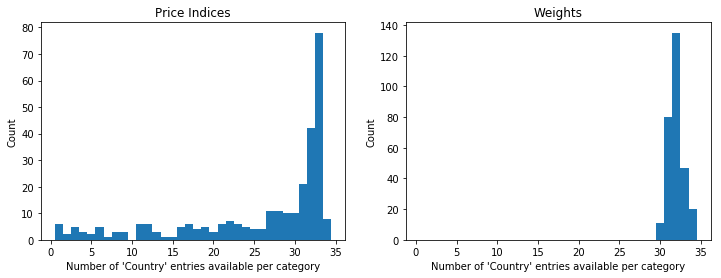

In [37]:
# Number of 'Country' entries available per COICOP
import matplotlib.pyplot as plt
%matplotlib inline

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].hist(df_midx_detailed.groupby('COICOP').Country.count(), bins=34, range=[0.5,34.5])
axes[0].set_xlabel("Number of 'Country' entries available per category")
axes[0].set_ylabel("Count")
axes[0].set_title('Price Indices')
axes[1].hist(df_inw_detailed.groupby('COICOP').Country.count(), bins=34, range=[0.5,34.5])
axes[1].set_xlabel("Number of 'Country' entries available per category")
axes[1].set_ylabel("Count")
axes[1].set_title('Weights')
plt.show()

For all categories of the detailed dataframe there is information about the weights for at least 30 countries. This is fine. 
Same is true for a big part of the categories and their price indices. But there are as well several categories that do not provide a lot of data for the prices indices. Here are the most critical:

In [38]:
# COICOPs with less than 10 'Country' Entries
df_translation.loc[
    df_midx_detailed.groupby('COICOP').count().index[df_midx_detailed.groupby('COICOP').Country.count()<10],:]

,Category
COICOP,
CP02124,Wine-based drinks
CP02134,Beer-based drinks
CP04121,Actual rentals paid by tenants for secondary r...
CP04442,Security services
CP05123,Services of laying of fitted carpets and floor...
CP05204,Repair of household textiles
CP05404,"Repair of glassware, tableware and household u..."
CP05512,"Repair, leasing and rental of major tools and ..."
CP05523,Repair of non-motorised small tools and miscel...


Okay, some of them look very special or old fashioned (e.g. 'Animal drawn vehicles' :-) ).

Let's look to which super-category they belong and which further entries can be found there:

In [39]:
for coicop in df_midx_detailed.groupby('COICOP').count().index[df_midx_detailed.groupby('COICOP').Country.count()<10]:
    print('______________________________________________________________________')
    try:
        print(coicop[:-1], df_translation.loc[coicop[:-1],:].values[0],'\n')
        print(df_translation.loc[all_coicops[pd.Series(all_coicops).str.contains(coicop[:-1])],'Category'].values[1:])
    except:
        print(coicop[:-1], '--- NOT AVAILABLE ---\n')
        print(df_translation.loc[all_coicops[pd.Series(all_coicops).str.contains(coicop[:-1])],'Category'].values)

______________________________________________________________________
CP0212 Wine 

['Wine from grapes' 'Wine from other fruits' 'Fortified wines'
 'Wine-based drinks']
______________________________________________________________________
CP0213 Beer 

['Lager beer' 'Other alcoholic beer' 'Low and non-alcoholic beer'
 'Beer-based drinks']
______________________________________________________________________
CP0412 Other actual rentals 

['Actual rentals paid by tenants for secondary residences'
 'Garage rentals and other rentals paid by tenants']
______________________________________________________________________
CP0444 Other services relating to the dwelling n.e.c. 

['Maintenance charges in multi-occupied buildings' 'Security services'
 'Other services related to dwelling']
______________________________________________________________________
CP0512 Carpets and other floor coverings 

['Carpet and rugs' 'Other floor coverings'
 'Services of laying of fitted carpets and floor c

I have to admit that my first idea was to omit these problematic categories and to take only the super-categories instead. But as soon as I had seen all these interesting data fields I had to revise my decision. There are also some cases where the super-category is not available. So let's go forward keeping in mind that we have some categories with very few datasets.

Until now we have only looked how many country-category combinations are present in the dataframe. Now let's check how much data is actually available for each of those combinations.

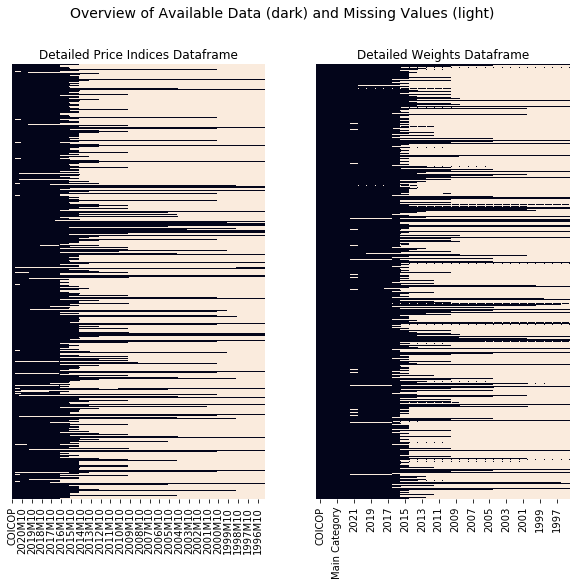

In [40]:
import seaborn as sns

fig, axes = plt.subplots(1, 2, figsize=(10, 8))
fig.suptitle('Overview of Available Data (dark) and Missing Values (light)', fontsize=14)
sns.heatmap(df_midx_detailed.isna(), ax=axes[0], yticklabels=False, cbar=False)
axes[0].set_title('Detailed Price Indices Dataframe')
sns.heatmap(df_inw_detailed.isna(),  ax=axes[1], yticklabels=False, cbar=False)
axes[1].set_title('Detailed Weights Dataframe')
plt.show()

This plot does not show any details but we can see that from 2016 onward we have a vast amount of data.

Only for Iceland there are a significant number of categories that provide less than one year of data. If we want to talk about at least five years then Romania, Ireland, United Kingdom, Finland, Norway, Iceland will be problematic.

In [41]:
# less than one year of data (countries)
df_midx_detailed[df_midx_detailed.isna().sum(axis=1) >= df_midx_detailed.shape[1]-4-12]['Country'].value_counts()

Iceland           74
Switzerland       13
Sweden             5
Finland            3
Ireland            2
Austria            2
United Kingdom     2
Serbia             2
Slovakia           2
Malta              1
Slovenia           1
Hungary            1
Lithuania          1
Italy              1
Poland             1
Name: Country, dtype: int64

In [42]:
# less than five years of data (countries)
df_midx_detailed[df_midx_detailed.isna().sum(axis=1) >= df_midx_detailed.shape[1]-4-12*5]['Country'].value_counts()

Romania            230
Ireland            223
United Kingdom     199
Finland            190
Norway             134
Iceland             95
Malta               33
Latvia              30
Cyprus              25
Sweden              15
Spain               15
Greece              14
Slovenia            13
Switzerland         13
Belgium             13
Portugal            10
Slovakia            10
Italy                9
Netherlands          9
Austria              8
Bulgaria             8
Serbia               6
Lithuania            5
France               4
Germany              4
Hungary              3
North Macedonia      2
Poland               1
Estonia              1
Czechia              1
Name: Country, dtype: int64

In [43]:
# less than one year of data (categories)
df_midx_detailed[df_midx_detailed.isna().sum(axis=1) >= df_midx_detailed.shape[1]-4-12]['Category'].value_counts().head(20)

Other alcoholic beer                                                                3
Services of carpenters                                                              3
Other non-fiction books                                                             2
Boats, outboard motors and fitting out of boats                                     2
Other fees and services                                                             2
Equipment for camping and open-air recreation                                       2
Educational text books                                                              2
Hire of equipment and accessories for culture                                       2
Mobile telephone equipment                                                          2
Hire of garages, parking spaces and personal transport equipment                    2
Other tobacco products                                                              2
Other paramedical services                            

In [44]:
# less than five years of data (categories)
df_midx_detailed[df_midx_detailed.isna().sum(axis=1) >= df_midx_detailed.shape[1]-4-12*5]['Category'].value_counts().head(20)

Unrecorded recording media                            11
Bundled telecommunication services                    11
Other small electric household appliances              9
Pre-recorded recording media                           9
Accessories for personal transport equipment           9
Portable sound and vision devices                      9
Coffee machines, tea-makers and similar appliances     9
Low and non-alcoholic beer                             8
Cutlery, flatware and silverware                       8
Child care services                                    8
Ready-made meals                                       8
Other cereal products                                  8
Educational text books                                 8
Equipment for camping and open-air recreation          8
Artificial sugar substitutes                           8
Other non-fiction books                                8
Mobile telephone equipment                             8
Other recording media          

### 3) Export dataframes for future use

In [45]:
try:
    os.makedirs('Data Project')
except FileExistsError:
    pass

# Full dataframes
df_midx.to_csv(os.path.join('Data Project','df_midx.csv'))
df_inw.to_csv(os.path.join('Data Project','df_inw.csv'))
df_midx_flags.to_csv(os.path.join('Data Project','df_midx_flags.csv'))
df_inw_flags.to_csv(os.path.join('Data Project','df_inw_flags.csv'))

# Small dataframes
df_midx_small.to_csv(os.path.join('Data Project','df_midx_small.csv'))
df_inw_small.to_csv(os.path.join('Data Project','df_inw_small.csv'))
df_midx_flags_small.to_csv(os.path.join('Data Project','df_midx_flags_small.csv'))
df_inw_flags_small.to_csv(os.path.join('Data Project','df_inw_flags_small.csv'))

# Detailed dataframes
df_midx_detailed.to_csv(os.path.join('Data Project','df_midx_detailed.csv'))
df_inw_detailed.to_csv(os.path.join('Data Project','df_inw_detailed.csv'))
df_midx_flags_detailed.to_csv(os.path.join('Data Project','df_midx_flags_detailed.csv'))
df_inw_flags_detailed.to_csv(os.path.join('Data Project','df_inw_flags_detailed.csv'))

## Part 2: Analysis of the weights
### Main Categories (small dataframe)
First I will look at the data from 2015 and then I want to analyze the temporal evolvement of the weights of the main categories.

So let's start from the barplot that we have already seen in the proposal. This time the definition looks a bit different as we can now start directly from the reduced dataframe `df_inw_small`:

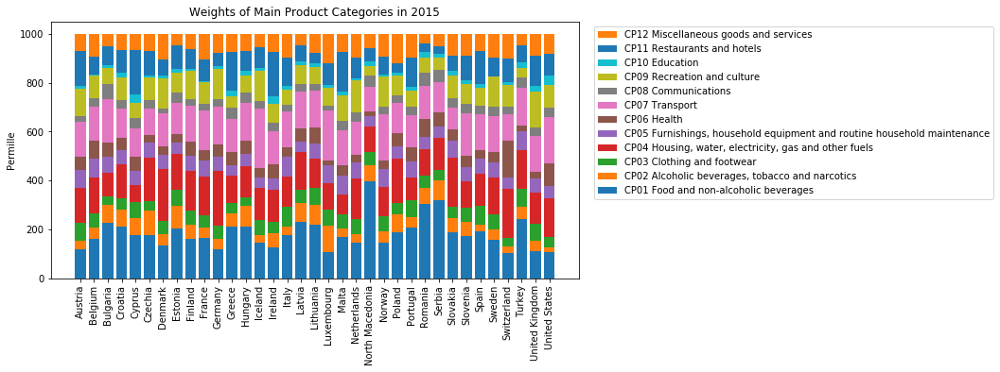

In [46]:
df = df_inw_small.pivot(index='Country', columns='COICOP', values='2015')

fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(1, 1, 1)
bottom_val = np.zeros(35)
for coicop in df.columns:
    plt.bar(np.arange(35), df[coicop], bottom=bottom_val, label=coicop +' '+ df_translation.loc[coicop].values[0])
    bottom_val += df[coicop].values

handles, labels = ax.get_legend_handles_labels()       # found on stackoverflow
ax.legend(handles[::-1], labels[::-1], loc='upper left', bbox_to_anchor=(1.02, 1))
plt.xticks(np.arange(35), df.index, rotation=90)
plt.ylabel('Permille')
plt.title('Weights of Main Product Categories in 2015')
plt.show()

The barplot gives all the information but as all weights are stacked it is difficult to read the values of upper main categories 2-12 and to draw some conclusions. Also there is no obvious way how to sort the countries: here they are sorted lexicographically but that has no deeper meaning.

Another way to present the same data is a "parallel coordinates" plot:

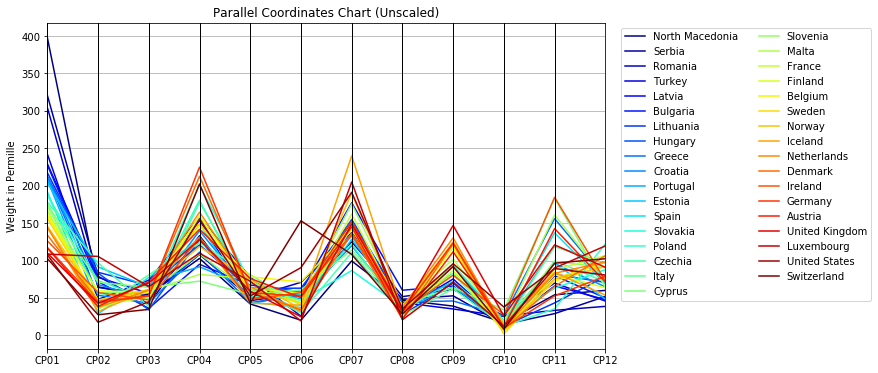

In [47]:
fig = plt.figure(figsize=(10,6))
pd.plotting.parallel_coordinates(df.reset_index(level=0).sort_values(by='CP01',ascending=False), 
                                 class_column='Country', colormap='jet')
plt.legend(loc='upper left', ncol=2, bbox_to_anchor=(1.02, 1))
plt.ylabel('Weight in Permille')
plt.title('Parallel Coordinates Chart (Unscaled)')
plt.show()

This time the weights are plotted over the main categories, each curve representing one country. Now I have sorted the countries by their 'CP01 Food' weight so that I get a smooth shaded rainbow palette for that category. We see that for the other categories these different colours mix up and do not form a band. Only for 'CP02 Alcohol and Tobacco' and 'CP09 Recreation and culture' we might say that the reddish and bluish countries stay more or less together.

Let's look at the legend. The bluish countries are the East-European countries with the darkest blue for the Balkans countries. The reddish countries are located in the North-West of Europe, plus the United States. Without giving a clear definition of poverty we could say that the bluish countries are the "poorer" countries and the reddish countries are the "richer" countries.

For all categories we notice that there is a certain spread in their weights, and we see that alltogether some categories have a higher importance than others. A high weight for a category may have several reasons:
- people "consume" a big amount of it
- people prefer to buy high quality at a higher price
- people spend less money on all other categories
- a high price of that product in that particular country
- high taxes (especially important for alcohol, tobacco, gas, petrol/diesel...)

Food is the most basic need that humans have and all humans need more or less the same amount of it (with differences in the food composition and quality). It is rather difficult to save money or to cut back on food consumption. So when observing that the "poorer" countries have a much higher 'CP01 Food' weight that means that those people spend much less of their income to other purposes where it is easier to abstain from (e.g. 'CP09 Recreation and culture' or 'CP11 Restaurants and hotels'). On the other hand it is interesting to see that Switzerland has the lowest 'CP01' weight even if the food prices are rather high in Switzerland compared to its neighbours.

In 'CP02' and 'CP06' we find as a local maximum two dark red curves that show extremely different behaviour:

In [48]:
# Maximum in CP02
print("The maximum of 'CP02 {}' is {} and is observed in {}.".format(
    df_translation.loc['CP02','Category'],df['CP02'].max(),df['CP02'].idxmax()))

# Maximum in CP06
print("The maximum of 'CP06 {}' is {} and is observed in {}.".format(
    df_translation.loc['CP06','Category'],df['CP06'].max(),df['CP06'].idxmax()))

The maximum of 'CP02 Alcoholic beverages, tobacco and narcotics' is 105.6 and is observed in Luxembourg.
The maximum of 'CP06 Health' is 153.15 and is observed in Switzerland.


Often we also find parallel coordinates plots that are min-max-scaled for all categories. I tried it out here but it really gives a mess: 

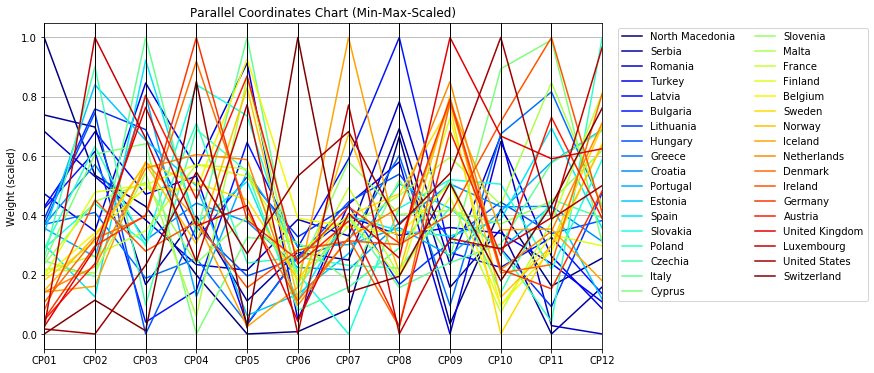

In [49]:
fig = plt.figure(figsize=(10,6))
pd.plotting.parallel_coordinates(df.apply(lambda x: (x-x.min())/(x.max()-x.min()), axis=0)
                                 .reset_index(level=0).sort_values(by='CP01',ascending=False), 
                                 class_column='Country', colormap='jet')
plt.legend(loc='upper left', ncol=2, bbox_to_anchor=(1.02, 1))
plt.ylabel('Weight (scaled)')
plt.title('Parallel Coordinates Chart (Min-Max-Scaled)')
plt.show()

So let's stick to the unscaled data. As the full dataset looks rather confusing and unsystematic I picked out some group of countries where I might expect some similarities:

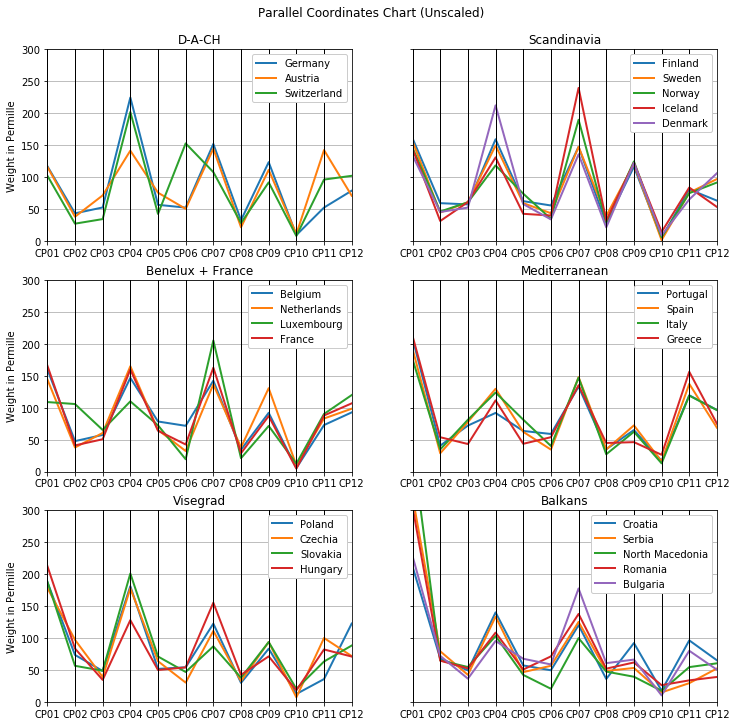

In [50]:
fig, axes = plt.subplots(3, 2, figsize=(12, 12), sharey=True)
plt.suptitle('Parallel Coordinates Chart (Unscaled)',y=0.93)
color=['tab:blue','tab:orange','tab:green','tab:red','tab:purple']

pd.plotting.parallel_coordinates(df.loc[['Germany','Austria','Switzerland']].reset_index(level=0), 
                                 class_column='Country', color=color, linewidth=2, ax=axes[0,0])
axes[0,0].set_ylabel('Weight in Permille')
axes[0,0].set_title('D-A-CH')
axes[0,0].legend(loc='upper right', framealpha=1)


pd.plotting.parallel_coordinates(df.loc[['Belgium','Netherlands','Luxembourg','France']].reset_index(level=0), 
                                 class_column='Country', color=color, linewidth=2, ax=axes[1,0])
axes[1,0].set_ylabel('Weight in Permille')
axes[1,0].set_title('Benelux + France')
axes[1,0].legend(loc='upper right', framealpha=1)

pd.plotting.parallel_coordinates(df.loc[['Finland','Sweden','Norway','Iceland','Denmark']].reset_index(level=0), 
                                 class_column='Country', color=color, linewidth=2, ax=axes[0,1])
axes[0,1].set_title('Scandinavia')
axes[0,1].legend(loc='upper right', framealpha=1)

pd.plotting.parallel_coordinates(df.loc[['Portugal','Spain','Italy','Greece']].reset_index(level=0), 
                                 class_column='Country', color=color, linewidth=2, ax=axes[1,1])
axes[1,1].set_title('Mediterranean')
axes[1,1].legend(loc='upper right', framealpha=1)

pd.plotting.parallel_coordinates(df.loc[['Poland','Czechia','Slovakia','Hungary']].reset_index(level=0), 
                                 class_column='Country', color=color, linewidth=2, ax=axes[2,0])
axes[2,0].set_ylabel('Weight in Permille')
axes[2,0].set_title('Visegrad')
axes[2,0].legend(loc='upper right', framealpha=1)

pd.plotting.parallel_coordinates(df.loc[['Croatia','Serbia','North Macedonia','Romania','Bulgaria']].reset_index(level=0),
                                 class_column='Country', color=color, linewidth=2, ax=axes[2,1])
axes[2,1].set_title('Balkans')
axes[2,1].set_ylim(bottom=0, top=300)
axes[2,1].legend(loc='upper right', framealpha=1)
plt.show()

- **The D-A-CH region:** We find similarities for some of the main categories but globally we cannot say that those countries - or even two of them - show a similar behaviour. Austria has a lower weight for 'CP04 Housing' and Switzerland has its high peak for 'CP06 Health' as we already know.
- **Scandinavia:** Here we find similarity for many categories. Only 'CP04 Housing', 'CP07 Transport' and 'CP12 Miscellaneous' show a bigger variation. Overall, Finland and Sweden are very close to each other. Remember that not all of these countries are part of the EU and only Finland participates in the Euro currency.
- **Benelux + France:** The curve for Luxembourg does not match the others. The other curves are close to each other in many regards but Belgium has a higher weight for 'CP06 Health' and the Netherlands have a higher one for 'CP09 Recreation and culture'.
- **Some mediterranean countries:** Even if those countries are no direct neighbours one might expect some similarities. We see that Spain and Italy are similar for most categories whereas Portugal and particularly Greece are clearly different.
- **Visegrad and Balkans countries:** Here I would say that we do not find any similarities.

Another representation showing once more that there is no common rule in between the rank of the countries is the following heatmap. Again I have sorted the countries by their rank for the food category giving a smooth colour gradient for the first column. We see that that smooth gradient is broken up into an irregular spotted pattern for the subsequent categories.

Lastly I have done a pairplot for all main categories. For most pairs we do not find a significant correlation what fits to the previous findings.

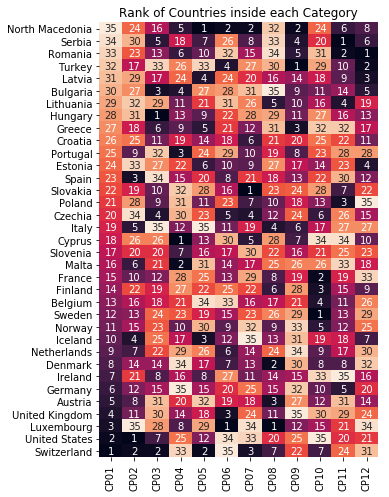

In [51]:
fig = plt.figure(figsize=(5,8))
sns.heatmap(df.sort_values(by='CP01',ascending=False).rank(), cbar=False, annot=True)
plt.title('Rank of Countries inside each Category')
plt.xlabel('')
plt.ylabel('')
plt.show()

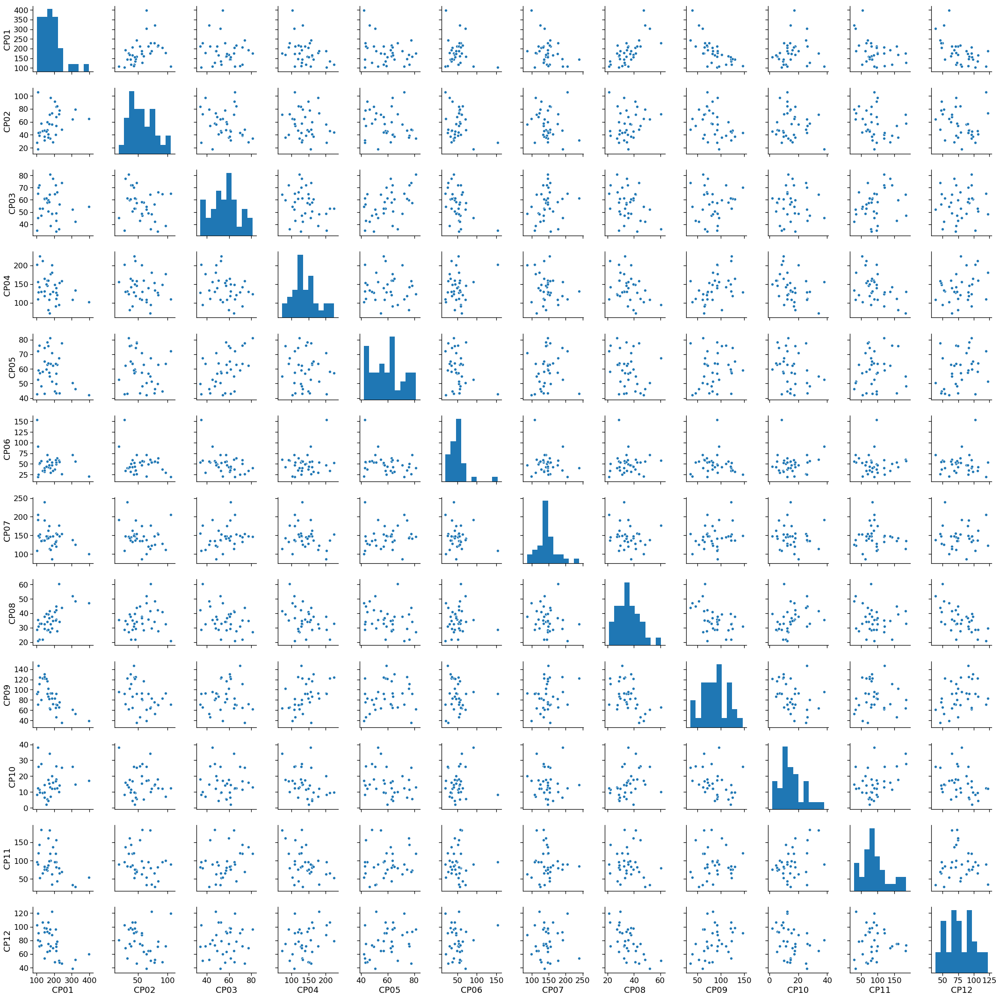

In [52]:
with sns.plotting_context('notebook', font_scale=1.5):
    sns.pairplot(df)    

Now I want to gather some insights about the temporal evolvement of the weights. In the proposal I have already seen that for many countries they do not change a lot. So I will only look at the 5-year steps (exception 1996). Unfortunately some countries did not provide any weights for the first years and have to be excluded from the study:

In [53]:
# incomplete data
df_inw_small.loc[df_inw_small[['COICOP','1996','2000','2005','2015','2020']].isna().any(axis=1),'Country'].unique()

array(['Bulgaria', 'Switzerland', 'Greece', 'Croatia', 'North Macedonia',
       'Serbia', 'United States'], dtype=object)

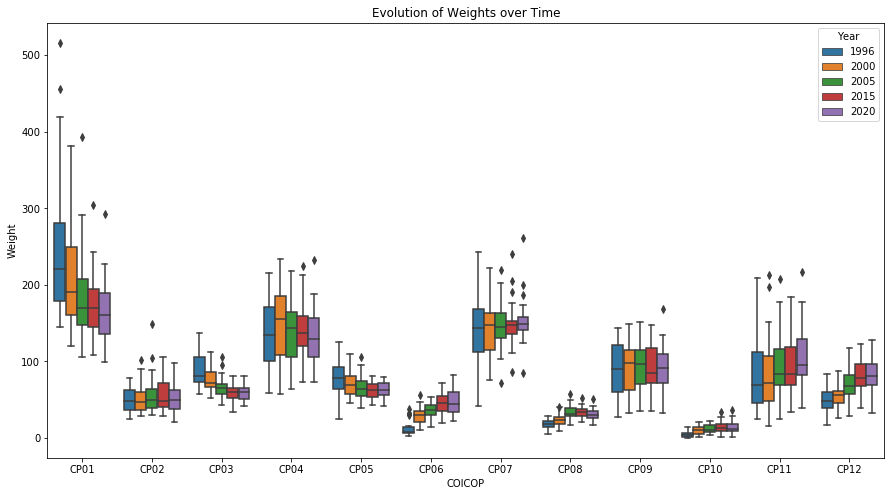

In [54]:
# extract interesting and complete data
df = df_inw_small.loc[~(df_inw_small[['COICOP','1996','2000','2005','2015','2020']].isna().any(axis=1)),
                      ['COICOP','1996','2000','2005','2015','2020']]
# reorder dataframe: add column 'Year'
df = pd.melt(df, id_vars=['COICOP'], value_vars=['1996','2000','2005', '2015','2020'],
             var_name='Year', value_name='Weight')

fig = plt.figure(figsize=(15,8))
ax = sns.boxplot(x='COICOP', y='Weight', hue='Year', data=df)
ax.set_title('Evolution of Weights over Time')
plt.show()

Even if there are always exceptions and outliers for some countries we can see the overall temporal trend for all categories:
- The weights for 'CP01 Food' and 'CP03 Clothing' are falling.
- The weights for 'CP06 Health', 'CP11 Restaurants and hotels' and 'CP12 Miscellaneous' are rising.
- The IQR is getting bigger for 'CP06 Health' whereas for several other categories it is getting smaller.


### Sub-categories (detailed dataframe)
Now I want to come to the detailed dataframe. In a first step I want to check how complete my dataset is from 2015 onwards and if the weights sum up to 1000 permille:

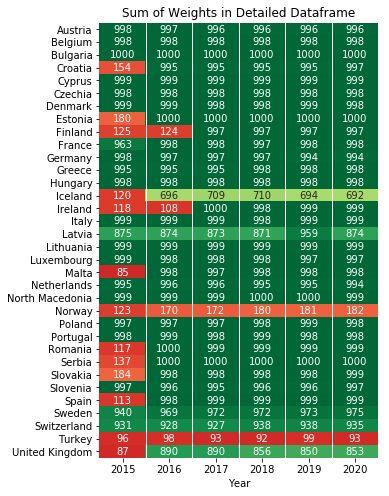

In [55]:
df = df_inw_detailed[['Country','2015','2016','2017','2018','2019','2020']].groupby('Country').sum()

fig = plt.figure(figsize=(5,8))
sns.heatmap(round(df), vmin=0, vmax=1000, cbar=False, annot=True, fmt='g', cmap='RdYlGn')
plt.title('Sum of Weights in Detailed Dataframe')
plt.xlabel('Year')
plt.ylabel('')
for i in np.arange(1,6):
    plt.axvline(i, color='white', lw=1)
plt.show()

In [56]:
# No missing values for Poland
df_inw_detailed.loc[df_inw_detailed['Country']=='Poland', ['2015','2016','2017','2018','2019','2020']].isna().sum()

2015    0
2016    0
2017    0
2018    0
2019    0
2020    0
dtype: int64

The year 2015 still is prone to missing data but from 2016 onwards many countries provided a dataset that nicely sums up to (almost) 1000 permille. The deviation may be due to missing data of less important categories or to roundoff errors. For example Poland provided a perfectly complete dataset and still the sums are in the range of 997-999.

As we already found out the United States did not release any detailed data at all, and we have a serious amount of missing data for Norway and Turkey, and a less critical amount for some other countries. The most complete year in between 2016-2020 is the year 2019. So I will use that year for the following studies.

First, let's look at the detailed 'CP01 Food' values and check if we have complete data for that category:

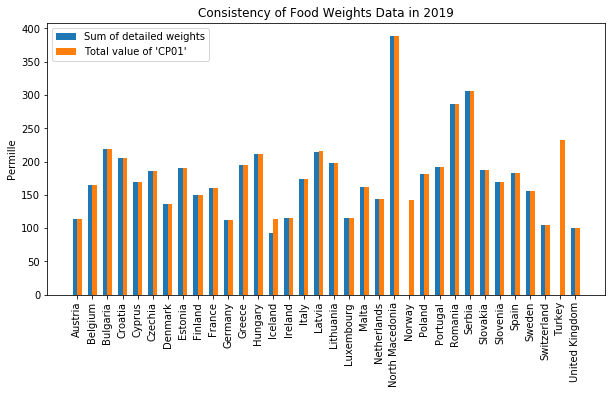

In [57]:
# only CP01 Food in 2019
df = pd.concat(
    [df_inw_detailed.loc[df_inw_detailed['Main Category']=='Food and non-alcoholic beverages', ['Country','2019']]
     .groupby('Country').sum(),
    df_inw_small.loc[df_inw_small['Main Category']=='Food and non-alcoholic beverages', ['Country','2019']]
     .set_index('Country').drop('United States')],
         axis=1, sort=True)
df.columns=['detailed','small']

fig = plt.figure(figsize=(10,5))

plt.bar(np.arange(df.shape[0])-0.15, df['detailed'], width=0.3, label='Sum of detailed weights')
plt.bar(np.arange(df.shape[0])+0.15, df['small'], width=0.3, label="Total value of 'CP01'")

plt.legend()
plt.xticks(np.arange(df.shape[0]), df.index, rotation=90)
plt.title('Consistency of Food Weights Data in 2019')
plt.ylabel('Permille')
plt.show()

From the barplot we see that we have no detailed data from Norway and Turkey, and that there is a significant gap for Iceland and a very small gap for Latvia.

In order to find out what people prefer on their dining plan I will scale all detailed weights with the total weight of 'CP01 Food'. Thus a scaled weight of x permille means that people spend x permille of their food expenses for that paricular product category. Note again that we cannot conclude from this study if a high weight is due to high consumption or to high prices.

The scaled weights sum up to 1000 permille if the detailed food dataset is complete. This is an equivalent statement to the barplot above. We have 61 detailed product categories:

In [58]:
df = df_inw_detailed.loc[(df_inw_detailed['Main Category']=='Food and non-alcoholic beverages') & 
                         (~df_inw_detailed['Country'].isin(['Norway','Turkey'])),
                    ['COICOP','Category','Country','2019']]

for country in df['Country'].unique():
    df.loc[df['Country']==country,'2019 scaled'] = \
        df.loc[df['Country']==country,'2019'] / \
            df_inw_small.loc[
                (df_inw_small['Main Category']=='Food and non-alcoholic beverages') & 
                (df_inw_small['Country']==country), '2019'].values *1000
    
df.groupby('Country')['2019 scaled'].sum()

Country
Austria            1000.175577
Belgium            1000.121197
Bulgaria           1000.182882
Croatia            1000.000000
Cyprus             1000.000000
Czechia            1000.000000
Denmark            1000.073131
Estonia             999.842544
Finland            1000.066729
France             1000.187383
Germany            1000.000000
Greece             1000.000000
Hungary            1000.000000
Iceland             818.238049
Ireland            1000.261552
Italy              1000.057717
Latvia              990.437474
Lithuania           999.898934
Luxembourg         1000.000000
Malta               999.814184
Netherlands         999.930700
North Macedonia     999.897141
Poland             1000.000000
Portugal           1000.000000
Romania            1000.000000
Serbia             1000.000000
Slovakia            999.946709
Slovenia            998.587654
Spain              1000.109349
Sweden             1000.128659
Switzerland        1000.000000
United Kingdom     1000.000000


In [59]:
df['Category'].unique()

array(['Rice', 'Flours and other cereals', 'Bread',
       'Other bakery products', 'Pizza and quiche',
       'Pasta products and couscous', 'Breakfast cereals',
       'Other cereal products', 'Beef and veal', 'Pork', 'Lamb and goat',
       'Poultry', 'Other meats', 'Edible offal',
       'Dried, salted or smoked meat', 'Other meat preparations',
       'Fresh or chilled fish', 'Frozen fish', 'Fresh or chilled seafood',
       'Frozen seafood', 'Dried, smoked or salted fish and seafood',
       'Other preserved or processed fish and seafood and fish and seafood preparations',
       'Fresh whole milk', 'Fresh low fat milk', 'Preserved milk',
       'Yoghurt', 'Cheese and curd', 'Other milk products', 'Eggs',
       'Butter', 'Margarine and other vegetable fats', 'Olive oil',
       'Other edible oils', 'Other edible animal fats',
       'Fresh or chilled fruit', 'Frozen fruit', 'Dried fruit and nuts',
       'Preserved fruit and fruit-based products',
       'Fresh or chilled vegeta

In [60]:
len(df['Category'].unique())

61

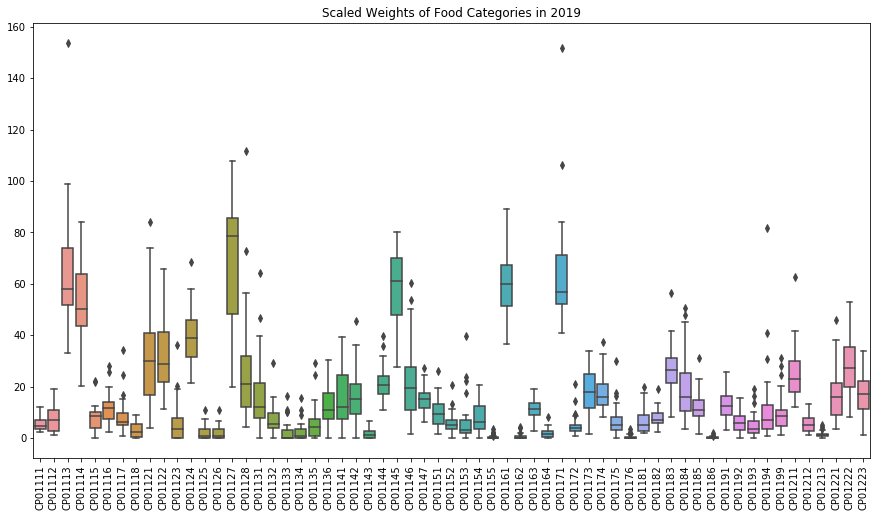

In [61]:
fig = plt.figure(figsize=(15,8))
ax = sns.boxplot(x='COICOP', y='2019 scaled', data=df)
ax.set_title('Scaled Weights of Food Categories in 2019')
plt.xticks(rotation=90)
plt.xlabel('')
plt.ylabel('')
plt.show()

The boxplot shows that for several product categories we find extremely high values. In the following I will filter out to which countries they belong:

In [62]:
df_describe = df.groupby(['COICOP','Category'])['2019 scaled'].describe()
df_describe.head()

,,count,mean,std,min,25%,50%,75%,max
COICOP,Category,,,,,,,,
CP01111,Rice,32.0,5.607451,2.561384,2.402242,3.447441,4.889465,7.263513,12.002885
CP01112,Flours and other cereals,32.0,7.530166,4.701304,1.374141,2.969268,6.933570,11.059486,18.986465
CP01113,Bread,32.0,65.293847,23.225338,33.000000,51.777376,57.988373,74.082798,153.690667
CP01114,Other bakery products,32.0,52.862267,16.752305,20.387537,43.657137,50.343802,63.839731,83.986144
CP01115,Pizza and quiche,31.0,7.730650,5.459770,0.000000,4.005322,8.544028,10.059790,22.394090


In [63]:
df_describe['Q3+1.5*IQR'] = df_describe['75%'] + 1.5 * (df_describe['75%'] - df_describe['25%'])

for coicop in df_describe.index.get_level_values(0):
    df_describe.loc[coicop,'Outliers'] = ', '.join(
        df.loc[(df['COICOP']==coicop) & (df['2019 scaled'] > df_describe.loc[coicop,'Q3+1.5*IQR'].values[0]), 'Country'])
    
with pd.option_context('display.max_rows', None):
    display(df_describe)

,,count,mean,std,min,25%,50%,75%,max,Q3+1.5*IQR,Outliers
COICOP,Category,,,,,,,,,,
CP01111,Rice,32.0,5.607451,2.561384,2.402242,3.447441,4.889465,7.263513,12.002885,12.987621,
CP01112,Flours and other cereals,32.0,7.530166,4.701304,1.374141,2.969268,6.933570,11.059486,18.986465,23.194813,
CP01113,Bread,32.0,65.293847,23.225338,33.000000,51.777376,57.988373,74.082798,153.690667,107.540930,Romania
CP01114,Other bakery products,32.0,52.862267,16.752305,20.387537,43.657137,50.343802,63.839731,83.986144,94.113622,
CP01115,Pizza and quiche,31.0,7.730650,5.459770,0.000000,4.005322,8.544028,10.059790,22.394090,19.141492,"Finland, Italy"
CP01116,Pasta products and couscous,32.0,11.873193,5.795662,2.562517,7.464049,11.914554,14.141129,27.996284,24.156748,"Italy, Malta"
CP01117,Breakfast cereals,31.0,8.522143,6.800057,1.080025,5.131992,6.444906,9.749264,34.500000,16.675171,"Cyprus, Malta, United Kingdom"
CP01118,Other cereal products,31.0,3.162792,2.977196,0.000000,0.530012,2.589301,5.442022,9.118377,12.810037,
CP01121,Beef and veal,32.0,31.613856,20.023114,4.022907,16.864314,30.100778,41.008012,83.917165,77.223559,Greece


Going through this list we find some outliers that are considered as typical dishes but also some others that we cannot explain (and I might not know all countries well enough...).

We find as typical food for example:
- Pizza and pasta products in Italy
- Breakfast cereals in UK, Cyprus and Malta (both are Commonwealth countries)
- Lamb and goat in Greece and Iceland
- all kinds of fish and seafood in Spain, Portugal
- Olive oil in Portugal, Spain, Italy, Greece
- Frozen or prepared fruit in Sweden, Finland, Estonia (i.e. nordish countries)

But we also find outliers for very elementary food such as bread, sugar, eggs, coffee... I cannot imagine that those populations consume extremely much of it, this seems to be more a local price issue or a problem in the statistics.

We also see that there are several country-category combinations listed as 0.000000. I cannot believe that those products are unknown in these countries (at least salt or margarine should be available and consumed everywhere!) but rather think that this is an inaccuracy or simplification in the statistics. Unfortunately this will also affect the other categories as their weights will consequently be slightly higher.

Next I will look at 'CP02 Alcoholic beverages, tobacco and narcotics':

In [64]:
# same for CP02, unscaled weights
df = df_inw_detailed.loc[(df_inw_detailed['Main Category']=='Alcoholic beverages, tobacco and narcotics') & 
                         (~df_inw_detailed['Country'].isin(['Norway','Turkey'])),
                    ['COICOP','Category','Country','2019']]

df_describe = df.groupby(['COICOP','Category'])['2019'].describe()

df_describe['Q3+1.5*IQR'] = df_describe['75%'] + 1.5 * (df_describe['75%'] - df_describe['25%'])

for coicop in df_describe.index.get_level_values(0):
    df_describe.loc[coicop,'Outliers'] = ', '.join(
        df.loc[(df['COICOP']==coicop) & (df['2019'] > df_describe.loc[coicop,'Q3+1.5*IQR'].values[0]), 'Country'])
    
with pd.option_context('display.max_rows', None):
    display(df_describe)

,,count,mean,std,min,25%,50%,75%,max,Q3+1.5*IQR,Outliers
COICOP,Category,,,,,,,,,,
CP02111,Spirits and liqueurs,31.0,6.861290,5.621675,0.83,2.800,4.890,8.9500,22.99,18.17500,Latvia
CP02112,Alcoholic soft drinks,30.0,0.144000,0.355369,0.00,0.000,0.000,0.0875,1.45,0.21875,"Estonia, Hungary, Lithuania, Latvia, Poland"
CP02121,Wine from grapes,31.0,7.913548,2.710555,3.53,5.955,7.850,9.8100,13.10,15.59250,
CP02122,Wine from other fruits,31.0,0.360000,0.609311,0.00,0.000,0.000,0.5000,2.22,1.25000,"Estonia, Finland, Ireland, Latvia"
CP02123,Fortified wines,31.0,0.405484,0.488746,0.00,0.000,0.200,0.7150,1.83,1.78750,Belgium
CP02124,Wine-based drinks,32.0,0.113437,0.426801,0.00,0.000,0.000,0.0000,2.37,0.00000,"Germany, Finland, France, Lithuania, Poland, S..."
CP02131,Lager beer,31.0,8.027097,4.989747,1.44,3.430,6.690,12.7950,16.70,26.84250,
CP02132,Other alcoholic beer,31.0,0.667419,1.524933,0.00,0.000,0.000,0.7100,7.84,1.77500,"Belgium, Czechia, Ireland, Sweden"
CP02133,Low and non-alcoholic beer,32.0,0.245938,0.431553,0.00,0.000,0.025,0.4175,2.17,1.04375,Slovakia


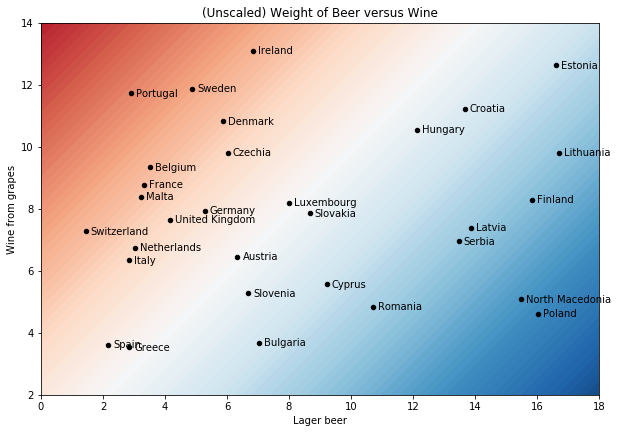

In [65]:
df_plot = df.loc[df['COICOP'].isin(['CP02121','CP02131']), ['Category','Country','2019']].pivot(
    index='Country',columns='Category',values='2019')

fig, ax = plt.subplots(figsize=(10,8))

# create background grid
x = np.linspace(0, 18, 101)
y = np.linspace(2, 14, 101)
X, Y = np.meshgrid(x, y)

# define background colour
cs = plt.contourf(X, Y, X-Y, 100, cmap='RdBu', vmin=-18, vmax=18)

# scatter plot of weights
df_plot.plot.scatter(x='Lager beer', y='Wine from grapes', ax=ax, c='k')

for k, v in df_plot.iterrows():      # found on stackoverflow
    ax.annotate(k, v, xytext=(5,-3), textcoords='offset points')

ax.set_aspect('equal', 'box')
plt.title('(Unscaled) Weight of Beer versus Wine')
plt.show()

This time I used the unscaled weights as we cannot assume that all people consume the same amount of alcohol and tobacco. I wanted to see if I can deduce from the weights which countries are the typical beer-drinkers and which are the wine-drinkers. But that was neither possible with the list nor with the diagram above. We find Ireland, Sweden and Czechia on the wine-side, and Cyprus and North Macedonia on the beer-side.

In addition the diagram would also tell us that wine+beer has an incredible higher weight in Estonia than in Spain and Greece?!

Next I will analyze the details of 'CP06 Health'. We have already seen that Switzerland has an extremely high total weight for that category. Let's try to find out why.

In [66]:
# same for CP06, unscaled weights, include Norway, Turkey
df = df_inw_detailed.loc[df_inw_detailed['Main Category']=='Health', ['COICOP','Category','Country','2019']]

df_describe = df.groupby(['COICOP','Category'])['2019'].describe()

df_describe['Q3+1.5*IQR'] = df_describe['75%'] + 1.5 * (df_describe['75%'] - df_describe['25%'])

for coicop in df_describe.index.get_level_values(0):
    df_describe.loc[coicop,'Outliers'] = ', '.join(
        df.loc[(df['COICOP']==coicop) & (df['2019'] > df_describe.loc[coicop,'Q3+1.5*IQR'].values[0]), 'Country'])
    
with pd.option_context('display.max_rows', None):
    display(df_describe)

,,count,mean,std,min,25%,50%,75%,max,Q3+1.5*IQR,Outliers
COICOP,Category,,,,,,,,,,
CP0611,Pharmaceutical products,34.0,18.257647,11.578844,3.40,9.8475,14.790,22.1050,47.62,40.49125,"Bulgaria, Romania"
CP06121,Pregnancy tests and mechanical contraceptive devices,32.0,0.203750,0.266552,0.00,0.0400,0.075,0.2675,0.94,0.60875,"Estonia, Italy, Slovenia"
CP06129,Other medical products n.e.c.,31.0,0.808387,0.812798,0.00,0.3800,0.620,0.9150,4.40,1.71750,"Switzerland, Luxembourg"
CP06131,Corrective eye-glasses and contact lenses,31.0,2.851290,1.821135,0.37,1.4000,2.400,4.1900,6.88,8.37500,
CP06132,Hearing aids,32.0,0.283125,0.500796,0.00,0.0000,0.000,0.3100,1.86,0.77500,"Belgium, Switzerland, Germany, Spain, France, ..."
CP06133,Repair of therapeutic appliances and equipment,32.0,0.081250,0.233718,0.00,0.0000,0.000,0.0000,1.06,0.00000,"Bulgaria, Cyprus, Germany, Croatia, Poland, Ro..."
CP06139,Other therapeutic appliances and equipment,32.0,0.811562,1.048065,0.00,0.0000,0.380,1.1850,4.93,2.96250,Spain
CP06211,General practice,31.0,2.153871,2.302251,0.00,0.6500,1.220,3.2300,9.31,7.10000,Ireland
CP06212,Specialist practice,31.0,4.627742,3.036292,0.00,2.4850,4.530,6.3850,11.73,12.23500,


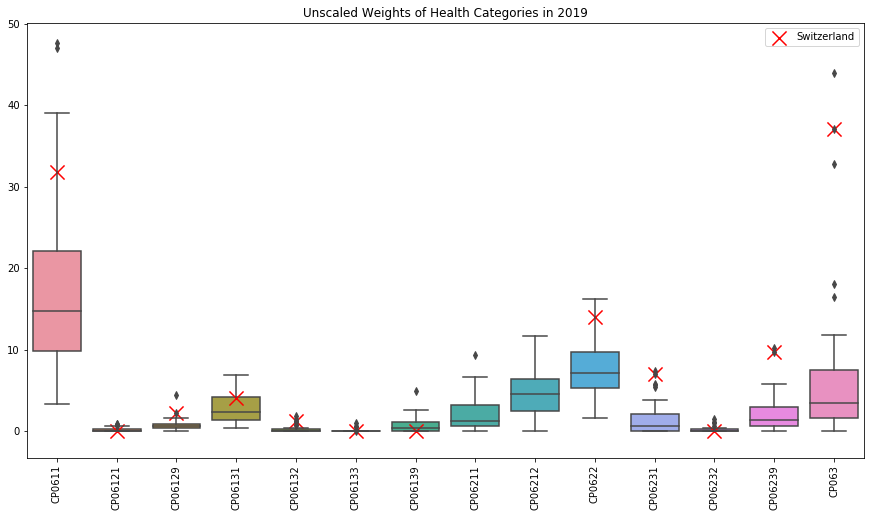

In [67]:
fig = plt.figure(figsize=(15,8))
ax = sns.boxplot(x='COICOP', y='2019', data=df)
plt.scatter(df['COICOP'].unique(), 
            [df.loc[(df['COICOP']==df['COICOP'].unique()[i]) & (df['Country']=='Switzerland'),'2019'].values[0]
                 if len(df.loc[(df['COICOP']==df['COICOP'].unique()[i]) & (df['Country']=='Switzerland'),'2019'].values) >0
                 else np.nan
                 for i in np.arange(len(df['COICOP'].unique()))],
           c='r', marker='x', s=200, label='Switzerland')
ax.set_title('Unscaled Weights of Health Categories in 2019')
plt.xticks(rotation=90)
plt.xlabel('')
plt.ylabel('')
plt.legend()
plt.show()

In [68]:
# inconsistency in sum, missing values!
print('Sum of all detailed weights of Switzerland: {:.2f}'.format(df_inw_detailed.loc[
        (df_inw_detailed['Main Category']=='Health') & (df_inw_detailed['Country']=='Switzerland'),'2019'].sum()))

print('Total Health weight of Switzerland: ',
df_inw_small.loc[(df_inw_small['Main Category']=='Health') & (df_inw_small['Country']=='Switzerland'),'2019'].values[0])

Sum of all detailed weights of Switzerland: 107.12
Total Health weight of Switzerland:  159.59


In [69]:
# Top-three for 'Hospital services'
df_inw_detailed.loc[df_inw_detailed['COICOP']=='CP063', ['Country','2019']].sort_values(by='2019',ascending=False).head(3)

,Country,2019
8935,Belgium,43.99
8937,Switzerland,37.05
8956,Ireland,32.77


We found out that Switzerland has high weights in almost all sub-categories. But it has an extremely high value in 'CP063 Hospital Services' and missing values for 'CP06211 General practice' and 'CP06212 Specialist practice' which sum up to 52 permille.

As far as I understand the fees for the public health insurance are not included here. Instead the indices are based on the charges of doctors, pharmaceuticals and so on. (By the way, the private health insurance is part of 'CP12 Miscellaneous', but not the public one.)

Lastly let's look at 'CP07 Transport':

In [70]:
# same for CP07, unscaled weights, include Norway, Turkey
df = df_inw_detailed.loc[df_inw_detailed['Main Category']=='Transport', ['COICOP','Category','Country','2019']]

df_describe = df.groupby(['COICOP','Category'])['2019'].describe()

df_describe['Q3+1.5*IQR'] = df_describe['75%'] + 1.5 * (df_describe['75%'] - df_describe['25%'])

for coicop in df_describe.index.get_level_values(0):
    df_describe.loc[coicop,'Outliers'] = ', '.join(
        df.loc[(df['COICOP']==coicop) & (df['2019'] > df_describe.loc[coicop,'Q3+1.5*IQR'].values[0]), 'Country'])
    
with pd.option_context('display.max_rows', None):
    display(df_describe)

,,count,mean,std,min,25%,50%,75%,max,Q3+1.5*IQR,Outliers
COICOP,Category,,,,,,,,,,
CP07111,New motor cars,31.0,22.287742,12.399803,4.51,12.0750,22.090,28.5100,57.50,53.16250,Luxembourg
CP07112,Second-hand motor cars,32.0,12.933438,7.152117,0.00,9.2050,11.220,16.2075,31.84,26.71125,Ireland
CP0713,Bicycles,32.0,1.345000,0.978729,0.00,0.5950,1.280,1.7900,4.67,3.58250,Poland
CP0714,Animal drawn vehicles,32.0,0.000000,0.000000,0.00,0.0000,0.000,0.0000,0.00,0.00000,
CP07211,Tyres,32.0,3.287500,2.649892,0.33,1.4175,2.650,4.1750,11.66,8.31125,"Bulgaria, Luxembourg"
CP07212,Spare parts for personal transport equipment,32.0,3.123750,2.612974,0.31,1.3175,2.525,3.6475,11.86,7.14250,"Lithuania, Romania, Slovenia"
CP07213,Accessories for personal transport equipment,31.0,0.791613,0.832783,0.00,0.0000,0.710,1.2250,2.88,3.06250,
CP07221,Diesel,32.0,17.571562,10.889167,3.53,10.2475,16.295,21.3675,58.20,38.04750,Luxembourg
CP07222,Petrol,32.0,25.957812,8.888476,11.82,18.6675,25.795,30.9150,51.71,49.28625,Hungary


Okay, there are some categories that are irrelevant or simply do not exist in some countries:
- people of landlock countries like Switzerland cannot travel by the sea
- small countries like Malta and Cyprus do not have a rail system or domestic flights
- and nowhere in Europe the animal drawn vehicles are a relevant mean of transport :-)

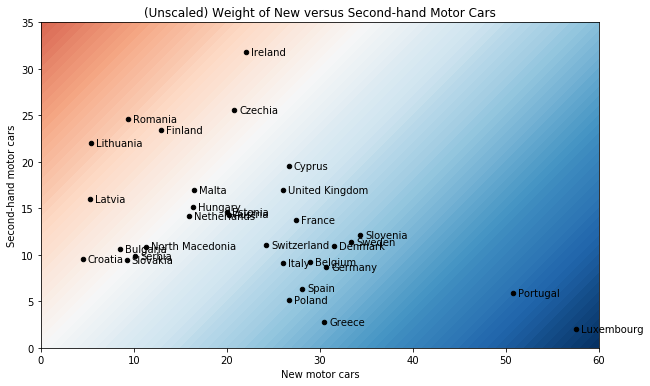

In [71]:
df_plot = df.loc[df['COICOP'].isin(['CP07111','CP07112']), ['Category','Country','2019']].pivot(
    index='Country',columns='Category',values='2019').dropna()

fig, ax = plt.subplots(figsize=(10,8))

# create background grid
x = np.linspace(0, 60, 101)
y = np.linspace(0, 35, 101)
X, Y = np.meshgrid(x, y)

# define background colour
cs = plt.contourf(X, Y, X-Y, 100, cmap='RdBu', vmin=-60, vmax=60)

# scatter plot of weights
df_plot.plot.scatter(x='New motor cars', y='Second-hand motor cars', ax=ax, c='k')

for k, v in df_plot.iterrows():      # found on stackoverflow
    ax.annotate(k, v, xytext=(5,-3), textcoords='offset points')

ax.set_aspect('equal', 'box')
plt.title('(Unscaled) Weight of New versus Second-hand Motor Cars')
plt.show()

Even if new motor cars are generally more expensive than second-hand motor cars we find some countries where the second-hand motor cars have a higher weight.

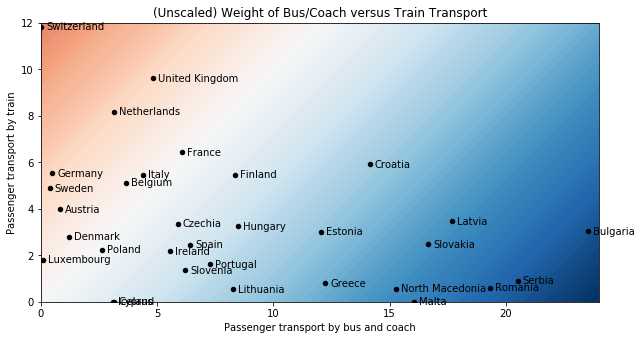

In [72]:
df_plot = df.loc[df['COICOP'].isin(['CP07311','CP07321']), ['Category','Country','2019']].pivot(
    index='Country',columns='Category',values='2019')

fig, ax = plt.subplots(figsize=(10,8))

# create background grid
x = np.linspace(0, 24, 101)
y = np.linspace(0, 12, 101)
X, Y = np.meshgrid(x, y)

# define background colour
cs = plt.contourf(X, Y, X-Y, 100, cmap='RdBu', vmin=-24, vmax=24)

# scatter plot of weights
df_plot.plot.scatter(x='Passenger transport by bus and coach', y='Passenger transport by train', ax=ax, c='k')

for k, v in df_plot.iterrows():      # found on stackoverflow
    ax.annotate(k, v, xytext=(5,-3), textcoords='offset points')

ax.set_aspect('equal', 'box')
plt.xlim(0,24)
plt.ylim(0,12)
plt.title('(Unscaled) Weight of Bus/Coach versus Train Transport')
plt.show()

As already mentioned Cyprus, Iceland (not readable in the diagram as they share almost the same values) and Malta do not have a rail system and therefore lie on the x-axis. On the other hand we find Switzerland on the y-axis what cannot be the full truth: even if long-distance coaches are uncommon here, we have the urban buses and the postbuses which are used regularly by a large part of the population.

But in general I think that this diagram represents very well how good the rail system is developed in each country. We find the East and South-East European countries in the blue part and the Western countries in the reddish part with the "winner" Switzerland.

### Summary of Weights' Analysis
The first part was about the weights for the main categories. It was rather difficult to find some common rules and to identify countries with similar behaviour. Some categories - especially the 'CP01 Food' weight - seem to correlate with "poverty", others may be influenced by the geographical region. We will see if we get more insights during machine learning task 1. 

In the second part we had a look into the weights of the detailed dataframe. Even if the dataset showed some inconsistencies and missing values it was possible to demonstrate some typical facts about the countries. That worked best for the 'CP01 Food' and the 'CP07 transport' categories, and did not work at all for 'CP02 Alcohol and tobacco'. 




## Part 3: Time Series Analysis
We have approximately 8000 time series in the small+detailed dataframes and cannot analyze all of them. But I will do a deeper analysis for all indices of Switzerland, and then for some particular indices for all countries.

In [73]:
df_midx_small.shape

(420, 310)

In [74]:
df_midx_detailed.shape

(7528, 310)

In [75]:
# extract DateTimeIndex
df_midx_dates = pd.to_datetime(df_midx_small.columns[4:], format ='%YM%m')
df_midx_dates

DatetimeIndex(['2021-06-01', '2021-05-01', '2021-04-01', '2021-03-01',
               '2021-02-01', '2021-01-01', '2020-12-01', '2020-11-01',
               '2020-10-01', '2020-09-01',
               ...
               '1996-10-01', '1996-09-01', '1996-08-01', '1996-07-01',
               '1996-06-01', '1996-05-01', '1996-04-01', '1996-03-01',
               '1996-02-01', '1996-01-01'],
              dtype='datetime64[ns]', length=306, freq=None)

### Detailed Analysis of Switzerland's indices

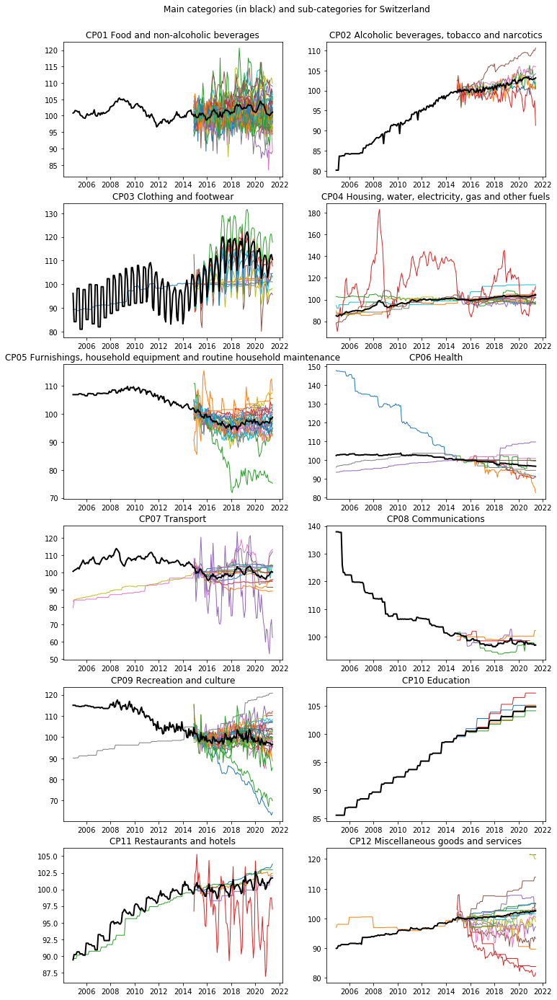

In [76]:
fig, axes = plt.subplots(6, 2, figsize=(12, 24))

for cat, ax in zip(main_cat, axes.ravel()):    
    ax.plot(df_midx_dates,
            df_midx_detailed[(df_midx_detailed['Country']=='Switzerland') & 
                             (df_midx_detailed['Main Category']==cat)].iloc[:,4:].values.T,
           linewidth=1)
    ax.plot(df_midx_dates,
            df_midx_small[(df_midx_small['Country']=='Switzerland') & (df_midx_small['Category']==cat)].iloc[:,4:].values.T,
           'k', linewidth=2)
    ax.set_title(df_midx_small.loc[df_midx_small['Category']==cat,'COICOP'].values[0] +' '+ cat)

fig.suptitle('Main categories (in black) and sub-categories for Switzerland', y=0.91)
plt.show()

- **CP01 Food and non-alcoholic beverages**<br>
We have a lot of product categories in the detailed dataframe and the plot is very messy and overcrowded. But there is no specific index falling out of the trend. The CP01 index (in black) stays more or less at a constant level during the year 2015-2021, and the sub-categories are mostly in a band of $\pm 10 \%$.

- **CP02 Alcoholic beverages, tobacco and narcotics**<br>
Here we see one index with has a steeper slope upwards and another one that is very unsteady and strikingly falling. Let's identify them:

In [77]:
# identify min and max entry for 2021
df_midx_detailed.loc[(df_midx_detailed['Main Category']=='Alcoholic beverages, tobacco and narcotics') & 
                 (df_midx_detailed['Country']=='Switzerland'), ['Category','2021M06']].sort_values('2021M06').iloc[[0,-1]]

,Category,2021M06
10801,Other alcoholic beer,91.34
10949,Cigars,110.56


- **CP03 Clothing and footwear**<br>
Many sub-categories also show the same seasonal pattern as the main category but there are some indices that are much more stable. We find out that those are not really clothing but clothing material and clothing services:

In [78]:
# identify the index starting from 2005
df_midx_detailed.loc[(df_midx_detailed['Main Category']=='Clothing and footwear') & 
                 (df_midx_detailed['Country']=='Switzerland'), ['Category','2005M01']].dropna()

,Category,2005M01
11091,Clothing materials,89.3


In [79]:
# compute standard deviation for 2015-2021
df_midx_detailed.loc[(df_midx_detailed['Main Category']=='Clothing and footwear') & 
                 (df_midx_detailed['Country']=='Switzerland'), :'2015M01'].set_index('Category').std(axis=1)

Category
Clothing materials                                                   0.299680
Garments for men                                                     7.353396
Garments for women                                                  10.402322
Garments for infants (0 to 2 years) and children (3 to 13 years)     7.921012
Other articles of clothing                                           1.097887
Clothing accessories                                                 8.332945
Cleaning of clothing                                                 1.125643
Repair and hire of clothing                                          0.638838
Footwear for men                                                     4.350887
Footwear for women                                                   6.636769
Footwear for infants and children                                    5.695654
Repair and hire of footwear                                          1.047102
dtype: float64

- **CP04 Housing, water, electricity, gas and other fuels**<br>
We see that one index shows much more fluctuations than all the others. Little surprising that this is the index for 'Liquid fuels':

In [80]:
# identify index >150
df_midx_detailed.loc[
    (df_midx_detailed.loc[(df_midx_detailed['Main Category']=='Housing, water, electricity, gas and other fuels') & 
                 (df_midx_detailed['Country']=='Switzerland')].iloc[:,4:] > 150).any(axis=1).idxmax(), 'Category']

'Liquid fuels'

- **CP05 Furnishings, household equipment and routine household maintenance**<br>
In this case there is one index steeply falling in 2015-2018. It is 'Cleaning equipment' - I do not have an explanation...

In [81]:
# identify index <80
df_midx_detailed.loc[
    (df_midx_detailed.loc[
        (df_midx_detailed['Main Category']=='Furnishings, household equipment and routine household maintenance') & 
                 (df_midx_detailed['Country']=='Switzerland')].iloc[:,4:] < 80).any(axis=1).idxmax(), 'Category']

'Cleaning equipment'

- **CP06 Health**<br>
There are three sub-categorical indices starting from 2005. The index of 'Pharmaceutical products' was strongly falling between 2005-2015. On the other hand the 'Dental services' index was continuously rising to its current value of 110.

In [82]:
# identify the indices starting from 2005
df_midx_detailed.loc[(df_midx_detailed['Main Category']=='Health') & 
                 (df_midx_detailed['Country']=='Switzerland'), ['Category','2005M01']].dropna()

,Category,2005M01
14819,Pharmaceutical products,147.5
15352,Dental services,93.5
15512,Hospital services,96.8


In [83]:
# sort the indices from 2021
df_midx_detailed.loc[(df_midx_detailed['Main Category']=='Health') & 
                 (df_midx_detailed['Country']=='Switzerland'), ['Category','2021M06']].sort_values('2021M06')

,Category,2021M06
14936,Other medical products n.e.c.,82.52
15093,Hearing aids,90.81
14819,Pharmaceutical products,91.28
15512,Hospital services,94.45
15054,Corrective eye-glasses and contact lenses,99.47
15430,Services of medical analysis laboratories and ...,100.00
15478,Other paramedical services,100.84
15352,Dental services,109.64


- **CP07 Transport**<br>
There is one index showing extremely strong fluctuations over all the years and falling to a minimum in 2020/2021. We can identify it as 'International Flights' - a direct consequence of Covid-19. The two maximum indices in June 2021 are 'Petrol' and 'Diesel'. For them we also can disinguish the effect of Covid-19: they have already been at a high level in 2018/2019, then they were much lower in 2020, and now they have almost reached the level from before.

In [84]:
# min index from 2021
df_midx_detailed.loc[(df_midx_detailed['Main Category']=='Transport') & 
                 (df_midx_detailed['Country']=='Switzerland'), ['Category','2021M06']].sort_values('2021M06').head(1)

,Category,2021M06
16744,International flights,62.28


In [85]:
# max indices from 2021
df_midx_detailed.loc[(df_midx_detailed['Main Category']=='Transport') & 
                 (df_midx_detailed['Country']=='Switzerland'), ['Category','2021M06']].sort_values('2021M06').tail(2)

,Category,2021M06
16138,Petrol,111.93
16098,Diesel,113.04


- **CP08 Communications**<br>
Only few detailed indices are available that do not show any pecularities.

- **CP09 Recreation and culture**<br>
For 'CP09 Recreation and culture' we find diverging indices for the sub-categories: some are rising, some are falling. The strongest decay is observed for 'Equipment for the reception, recording and reproduction of sound and vision' and 'Personal computers', and the strongest rise for 'Newspapers'.

In [86]:
# min indices from 2021
with pd.option_context('display.max_colwidth', -1):
    display(df_midx_detailed.loc[(df_midx_detailed['Main Category']=='Recreation and culture') & 
                 (df_midx_detailed['Country']=='Switzerland'), ['Category','2021M06']].dropna().sort_values('2021M06').head(2))

,Category,2021M06
17641,"Equipment for the reception, recording and reproduction of sound and vision",64.43
17877,Personal computers,69.89


In [87]:
# max index from 2021
df_midx_detailed.loc[(df_midx_detailed['Main Category']=='Recreation and culture') & 
                 (df_midx_detailed['Country']=='Switzerland'), ['Category','2021M06']].dropna().sort_values('2021M06').tail(1)

,Category,2021M06
19668,Newspapers,120.78


- **CP10 Education**<br>
There are only few indices available - nothing special.

- **CP11 Restaurant and hotels**<br>
Again we find one index strongly fluctuating and showing seasonal pattern: it is 'Hotels, motels, inns and similar accommodation services'. Here as well we see the effect of Covid-19 but it is not so strong as for 'International flights'.

In [88]:
# min index from 2021
df_midx_detailed.loc[(df_midx_detailed['Main Category']=='Restaurants and hotels') & 
                 (df_midx_detailed['Country']=='Switzerland'), ['Category','2021M06']].sort_values('2021M06').head(1)

,Category,2021M06
20574,"Hotels, motels, inns and similar accommodation...",97.02


- **CP12 Miscellaneous goods and services**<br>
There are some rising and some falling indices but none is particularly different from the others.

In [89]:
# sub-categories of 'CP12 Miscellaneous'
df_midx_detailed.loc[(df_midx_detailed['Main Category']=='Miscellaneous goods and services'),'Category'].unique()

array(['Hairdressing for men and children', 'Hairdressing for women',
       'Personal grooming treatments',
       'Electric appliances for personal care',
       'Repair of electric appliances for personal care',
       'Non-electrical appliances',
       'Articles for personal hygiene and wellness, esoteric products and beauty products',
       'Jewellery', 'Clocks and watches',
       'Repair of jewellery, clocks and watches', 'Travel goods',
       'Articles for babies', 'Repair of other personal effects',
       'Other personal effects n.e.c.', 'Child care services',
       'Retirement homes for elderly persons and residences for disabled persons',
       'Services to maintain people in their private homes',
       'Counselling', 'Insurance connected with the dwelling',
       'Private insurance connected with health',
       'Motor vehicle insurance', 'Travel insurance', 'Other insurance',
       'Charges by banks and post offices',
       'Fees and service charges of brokers, i

### Some 'CP01 Food' indices in detail

I picked out some 'CP01 Food' indices that I want to compare in more detail for the different countries. All of them are very basic food that are available everywhere through Europe.
- 'Bread': everywhere in Europe a very basic food, but there are plenty of versions
- 'Pork': very common in all Christian countries (Turkey did not provide any food data)
- 'Fresh whole milk': has to be imported in several countries
- 'Potatoes': are grown almost everywhere in Europe
- 'Coffee': coffee beans are not growing in Europe but are roasted and end-processed in many ways

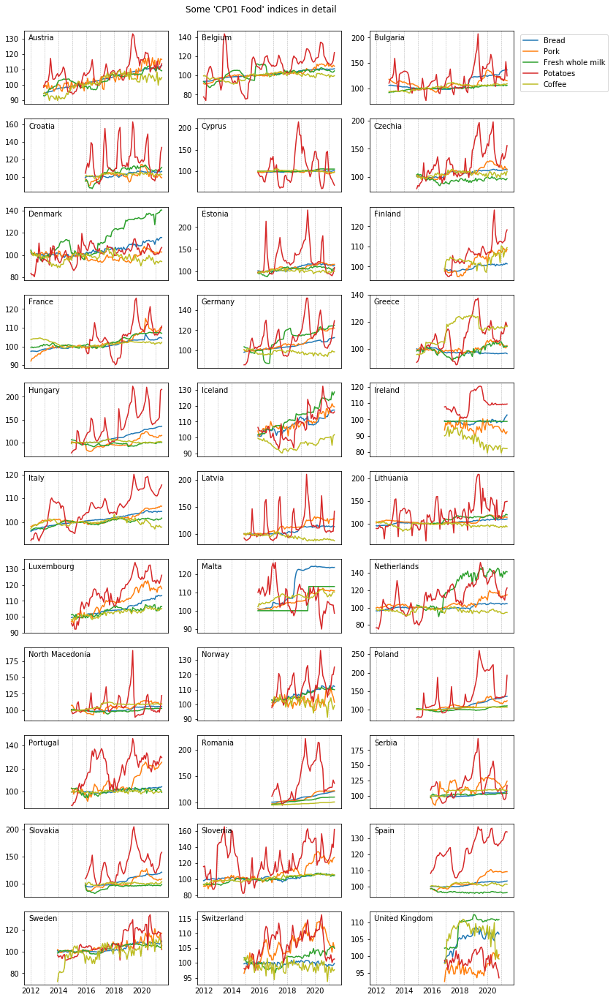

In [90]:
# only for available countries
countries = np.sort(df_midx_detailed.loc[~df_midx_detailed['Country'].isin(['Turkey']),'Country'].unique())

fig, axes = plt.subplots(int(np.ceil(len(countries)/3)), 3, figsize=(12, 24), sharex=True)
plt.suptitle("Some 'CP01 Food' indices in detail", y=0.9)
for country, ax in zip(countries, axes.ravel()):   
    df_midx_values = df_midx_detailed[
        (df_midx_detailed['Category']=='Bread') & (df_midx_detailed['Country']==country)]
    if df_midx_values.shape[0] > 0:
        ax.plot(df_midx_dates[:114], df_midx_values.iloc[:,4:118].values.T, c='tab:blue', label='Bread')
        
    df_midx_values = df_midx_detailed[
        (df_midx_detailed['Category']=='Pork') & (df_midx_detailed['Country']==country)]
    if df_midx_values.shape[0] > 0:
        ax.plot(df_midx_dates[:114], df_midx_values.iloc[:,4:118].values.T, c='tab:orange', label='Pork')
    
    df_midx_values = df_midx_detailed[
        (df_midx_detailed['Category']=='Fresh whole milk') & (df_midx_detailed['Country']==country)]
    if df_midx_values.shape[0] > 0:
        ax.plot(df_midx_dates[:114], df_midx_values.iloc[:,4:118].values.T, c='tab:green', label='Fresh whole milk')
        
    df_midx_values = df_midx_detailed[
        (df_midx_detailed['Category']=='Potatoes') & (df_midx_detailed['Country']==country)]
    if df_midx_values.shape[0] > 0:
        ax.plot(df_midx_dates[:114], df_midx_values.iloc[:,4:118].values.T, c='tab:red', label='Potatoes')
        
    df_midx_values = df_midx_detailed[
        (df_midx_detailed['Category']=='Coffee') & (df_midx_detailed['Country']==country)]
    if df_midx_values.shape[0] > 0:
        ax.plot(df_midx_dates[:114], df_midx_values.iloc[:,4:118].values.T, c='tab:olive', label='Coffee')
        
    ax.annotate(country, xy=(6, 95), xycoords='axes points', size=10, ha='left', va='top')
    ax.set_xticklabels(['',2012,'',2014,'',2016,'',2018,'',2020])
    ax.grid(axis='x', linestyle='--', linewidth=0.5)
    ax.tick_params(axis='x', which='both', length=0)
plt.legend(loc='upper left', bbox_to_anchor=(1.02, 13))
plt.show()

- Even if only a few years around 2015 are plotted, the scale on the y-axis is very different for the different countries. A big spread up to 200/250 is observed for several East-European countries.
- In most countries the top-values are reached for the 'Potatoes' index. It also shows a seasonal component for many countries where the prices are highest in spring/eary-summer and are falling after potato harvest. This effect is much more pronounced in some countries than in others.
- Only in Denmark and in the Netherlands (and in the UK on a very moderate level) the 'Fresh whole milk' index is rising much faster than the 'Potatoes' index.
- The indices for 'Bread' and 'Pork' seem to be more or less stable. Only in Malta we find a sudden increase of the 'Bread' index.
- The 'Coffee' index is falling in Ireland and rising in Greece.

### The 'Garments for men' and the 'Garments for women' indices

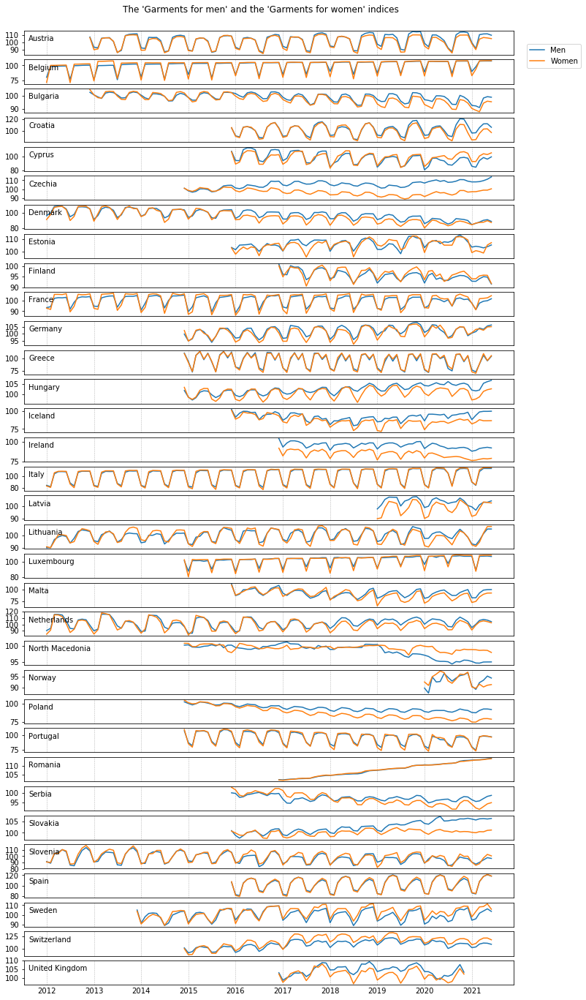

In [97]:
# only for available countries
countries = np.sort(df_midx_detailed.loc[(df_midx_detailed['Category']=='Garments for men'),'Country'].values)

fig, axes = plt.subplots(len(countries), 1, figsize=(12, 24), sharex=True)
plt.suptitle("The 'Garments for men' and the 'Garments for women' indices", y=0.9)
for country, ax in zip(countries, axes.ravel()):   
    ax.plot(df_midx_dates[0:114],
            df_midx_detailed[(df_midx_detailed['Category']=='Garments for men') 
                             & (df_midx_detailed['Country']==country)].iloc[:,4:118].values.T, label='Men')
    ax.plot(df_midx_dates[0:114],
            df_midx_detailed[(df_midx_detailed['Category']=='Garments for women') 
                             & (df_midx_detailed['Country']==country)].iloc[:,4:118].values.T, label='Women')
    ax.annotate(country, xy=(6, 27), xycoords='axes points', size=10, ha='left', va='top')
    ax.grid(axis='x', linestyle='--', linewidth=0.5)
    ax.tick_params(axis='x', which='both', length=0)
plt.legend(loc='upper left', bbox_to_anchor=(1.02, 39))
plt.show()

- For most of the countries we can observe a strong seasonality with lowest indices during summer sale and winter sale. There is no systematic difference between nordic and southern countries.
- In most cases the index shows a smooth undulation whereas in Belgium, France and Luxembourg the profile is rather sharp. In Greece we even find a minor sale in between two sales.
- In many East-European countries the variation is much smaller or even not present (Romania, North Macedonia).
- In general we do not find big differences between garments for men and women. In Hungary and Latvia we find less discounts for men during the sales.

### The 'Liquid fuels' index versus Oil price

We have seen above in the study for Switzerland that the index for 'Liquid fuels' is fluctuating a lot. I suppose that it is strongly dependent from the crude oil price. Therefore I have downloaded the time series for the crude oil price from https://www.eia.gov/dnav/pet/hist/LeafHandler.ashx?n=PET&s=RBRTE&f=M.<br>
I will compare this time series to the 'Liquid fuels' index of all countries.

In [91]:
# import Brent oil price
df_oilprice = pd.read_excel(os.path.join('Prices','RBRTEm.xls'), sheet_name='Data 1', header=2)
df_oilprice.head()

,Date,Europe Brent Spot Price FOB (Dollars per Barrel)
0,1987-05-15,18.58
1,1987-06-15,18.86
2,1987-07-15,19.86
3,1987-08-15,18.98
4,1987-09-15,18.31


In [92]:
# Date is already a datetime --> okay!
df_oilprice.dtypes

Date                                                datetime64[ns]
Europe Brent Spot Price FOB (Dollars per Barrel)           float64
dtype: object

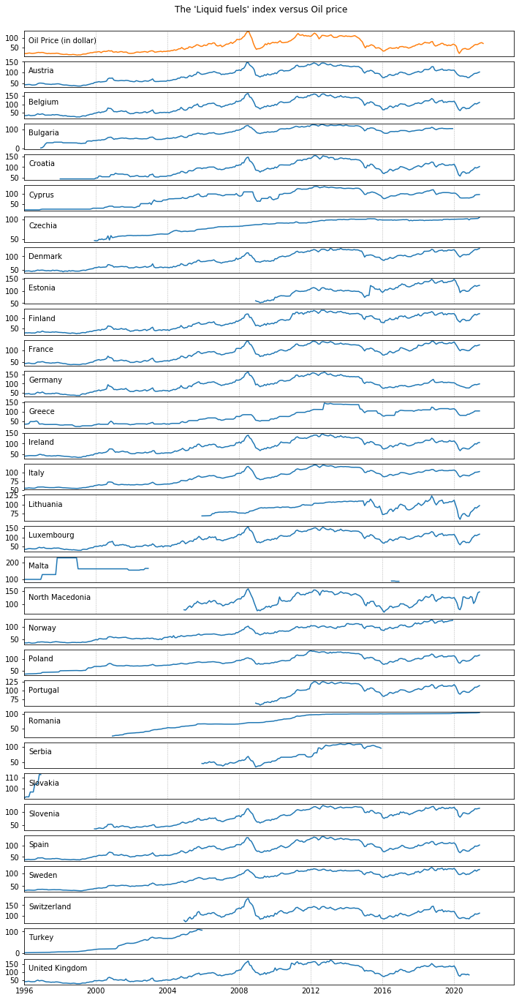

In [93]:
# only for available countries
countries = np.sort(df_midx_detailed.loc[(df_midx_detailed['Category']=='Liquid fuels'),'Country'].values)
countries = np.insert(countries, 0, 'Oil Price')     # add 'Oil Price' to countries

fig, axes = plt.subplots(len(countries), 1, figsize=(12, 24), sharex=True)
plt.suptitle("The 'Liquid fuels' index versus Oil price", y=0.9)
for country, ax in zip(countries, axes.ravel()):   
    if country=='Oil Price':
        ax.plot(df_oilprice['Date'], df_oilprice['Europe Brent Spot Price FOB (Dollars per Barrel)'],
               c='tab:orange')
        ax.set_xlim(left=pd.to_datetime('1996'))
        ax.annotate('Oil Price (in dollar)', xy=(6, 27), xycoords='axes points', size=10, ha='left', va='top')
        ax.grid(axis='x', linestyle='--', linewidth=0.5)
        ax.tick_params(axis='x', which='both', length=0)
    else:
        ax.plot(df_midx_dates,
            df_midx_detailed[(df_midx_detailed['Category']=='Liquid fuels') & (df_midx_detailed['Country']==country)]
             .iloc[:,4:].values.T)
        ax.annotate(country, xy=(6, 27), xycoords='axes points', size=10, ha='left', va='top')
        ax.grid(axis='x', linestyle='--', linewidth=0.5)
        ax.tick_params(axis='x', which='both', length=0)
plt.show()

We see that for many countries the 'Liquid fuels' index resembles a lot to the crude oil price. We find a strong local peak in 2008 followed by a sudden drop during the economic crises, and we observe the influence of Covid-19 crisis in 2020.

Note that the scale is different as the oil price is in dollar per barrel. On the other hand there are some countries showing a very different behaviour. Before judging, let's look for flags:

In [94]:
# look for flags
with pd.option_context('display.max_columns', None):
    display(df_midx_flags_detailed[(df_midx_flags_detailed['Category']=='Liquid fuels')
              & (~df_midx_flags_detailed.iloc[:,4:].isin(['',np.nan]).all(axis=1))])

,COICOP,Category,Main Category,Country,2021M06,2021M05,2021M04,2021M03,2021M02,2021M01,2020M12,2020M11,2020M10,2020M09,2020M08,2020M07,2020M06,2020M05,2020M04,2020M03,2020M02,2020M01,2019M12,2019M11,2019M10,2019M09,2019M08,2019M07,2019M06,2019M05,2019M04,2019M03,2019M02,2019M01,2018M12,2018M11,2018M10,2018M09,2018M08,2018M07,2018M06,2018M05,2018M04,2018M03,2018M02,2018M01,2017M12,2017M11,2017M10,2017M09,2017M08,2017M07,2017M06,2017M05,2017M04,2017M03,2017M02,2017M01,2016M12,2016M11,2016M10,2016M09,2016M08,2016M07,2016M06,2016M05,2016M04,2016M03,2016M02,2016M01,2015M12,2015M11,2015M10,2015M09,2015M08,2015M07,2015M06,2015M05,2015M04,2015M03,2015M02,2015M01,2014M12,2014M11,2014M10,2014M09,2014M08,2014M07,2014M06,2014M05,2014M04,2014M03,2014M02,2014M01,2013M12,2013M11,2013M10,2013M09,2013M08,2013M07,2013M06,2013M05,2013M04,2013M03,2013M02,2013M01,2012M12,2012M11,2012M10,2012M09,2012M08,2012M07,2012M06,2012M05,2012M04,2012M03,2012M02,2012M01,2011M12,2011M11,2011M10,2011M09,2011M08,2011M07,2011M06,2011M05,2011M04,2011M03,2011M02,2011M01,2010M12,2010M11,2010M10,2010M09,2010M08,2010M07,2010M06,2010M05,2010M04,2010M03,2010M02,2010M01,2009M12,2009M11,2009M10,2009M09,2009M08,2009M07,2009M06,2009M05,2009M04,2009M03,2009M02,2009M01,2008M12,2008M11,2008M10,2008M09,2008M08,2008M07,2008M06,2008M05,2008M04,2008M03,2008M02,2008M01,2007M12,2007M11,2007M10,2007M09,2007M08,2007M07,2007M06,2007M05,2007M04,2007M03,2007M02,2007M01,2006M12,2006M11,2006M10,2006M09,2006M08,2006M07,2006M06,2006M05,2006M04,2006M03,2006M02,2006M01,2005M12,2005M11,2005M10,2005M09,2005M08,2005M07,2005M06,2005M05,2005M04,2005M03,2005M02,2005M01,2004M12,2004M11,2004M10,2004M09,2004M08,2004M07,2004M06,2004M05,2004M04,2004M03,2004M02,2004M01,2003M12,2003M11,2003M10,2003M09,2003M08,2003M07,2003M06,2003M05,2003M04,2003M03,2003M02,2003M01,2002M12,2002M11,2002M10,2002M09,2002M08,2002M07,2002M06,2002M05,2002M04,2002M03,2002M02,2002M01,2001M12,2001M11,2001M10,2001M09,2001M08,2001M07,2001M06,2001M05,2001M04,2001M03,2001M02,2001M01,2000M12,2000M11,2000M10,2000M09,2000M08,2000M07,2000M06,2000M05,2000M04,2000M03,2000M02,2000M01,1999M12,1999M11,1999M10,1999M09,1999M08,1999M07,1999M06,1999M05,1999M04,1999M03,1999M02,1999M01,1998M12,1998M11,1998M10,1998M09,1998M08,1998M07,1998M06,1998M05,1998M04,1998M03,1998M02,1998M01,1997M12,1997M11,1997M10,1997M09,1997M08,1997M07,1997M06,1997M05,1997M04,1997M03,1997M02,1997M01,1996M12,1996M11,1996M10,1996M09,1996M08,1996M07,1996M06,1996M05,1996M04,1996M03,1996M02,1996M01
12709,CP0453,Liquid fuels,"Housing, water, electricity, gas and other fuels",France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,u,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12715,CP0453,Liquid fuels,"Housing, water, electricity, gas and other fuels",North Macedonia,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,d,

Okay, for France we find once the flag 'u' related to Covid-19. For North Macedonia, Poland, Serbia, and Turkey the flag 'd' tells us "definition differs". But if I look at the diagram those countries do not look special. I am much more worried about
- Malta and Slovakia: The data is very incomplete, but also the available data looks strange and completely different.
- Czechia, Romania and the first years of Lithuania: These time series show much less of fluctuations and are rather smooth. It could be (unfortunately I do not have further information) that the price for liquid fuels is nationally regulated in those East-European countries.

### The 'Hotels, motels, inns and similar accommodation services' index

Let's look at the index for 'Hotels, motels, inns and similar accommodation services' and try to find out which countries are rather summer holiday destinations or winter holiday destinations. Note that in the definition of the HICP, if a person comes from country A and travels to country B this is added to the index of country B. (This is different from the Swiss national consumer price index, see `953-1800-05.pdf`.)

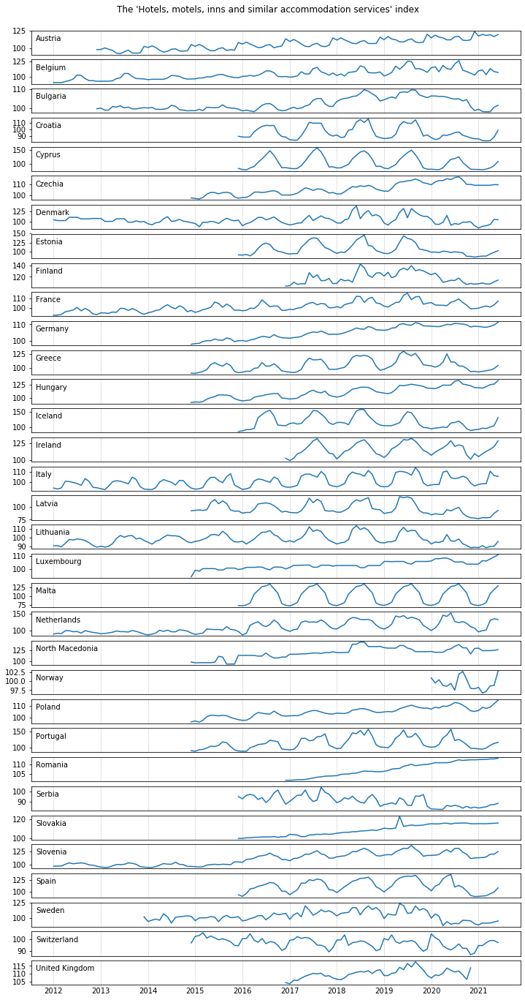

In [95]:
# only for available countries
countries = np.sort(df_midx_detailed.loc[(
    df_midx_detailed['Category']=='Hotels, motels, inns and similar accommodation services'),'Country'].values)

fig, axes = plt.subplots(len(countries), 1, figsize=(12, 24), sharex=True)
plt.suptitle("The 'Hotels, motels, inns and similar accommodation services' index", y=0.9)
for country, ax in zip(countries, axes.ravel()):   
    ax.plot(df_midx_dates[0:114],
            df_midx_detailed[(df_midx_detailed['Category']=='Hotels, motels, inns and similar accommodation services') 
                             & (df_midx_detailed['Country']==country)].iloc[:,4:118].values.T)
    ax.annotate(country, xy=(6, 27), xycoords='axes points', size=10, ha='left', va='top')
    ax.grid(axis='x', linestyle='--', linewidth=0.5)
    ax.tick_params(axis='x', which='both', length=0)
plt.show()

- For most of the countries the local maxima are found during summer. That effect is especially strong for the mediterranean holiday countries  (Croatia, Cyprus, Greece, Italy, Malta, Portugal, Spain) but as well for Ireland, Iceland, Estonia, Latvia and Lithuania. For many of them we see the influence of Covid-19 in summer 2020.
- Local maxima in winter are only found in Austria and Switzerland. These two both have a lower second peak during summer holiday time.
- It is interesting to look at Luxembourg where we find local minima in summer and before Christmas. Luxembourg is not a holiday destination but a destination for business travels and short trips.
- Romania and Slovakia show a smooth and monotonically increasing trend.

## Part 4: Compute and analyze the monthly rates of change
We have to differentiate between the (absolute) change and the (relative) rate of change. Both of them may be helpful in data science and machine learning.

- **The (absolute) change:**<br>    
$\hspace{1cm}\Delta I(t_n) = I(t_n) - I(t_{n-1})$<br><br>
The (absolute) change computes the total difference between the previous month and the current month. This is helpful if we want to sum it up in order to get the total change or if we want to talk about 'average change'. But it does not indicate on which level we are operating. The same change of X may feel much more extreme if it is in relation to a small number than to a bigger one. 

- **The (relative) rate of change:**<br><br>
$\hspace{1cm}M(t_n) = \left(\frac{I(t_n)-I(t_{n-1})}{I(t_{n-1})}\right)\cdot 100 \% = \left(\frac{I(t_n)}{I(t_{n-1})} -1\right)\cdot 100 \%$<br><br>
The (relative) rate of change computes the growth rate in comparison to the value of the previous month. So the level of operation is included into the computation. The disadvantage is that growth and drop are not symmetric:<br>
If we have an oscillating series `1, 2, 1, 2, 1, 2, ...` we compute the rates of change `100%, -50%, 100%, -50%, 100%, ...` even if the total rate of change is zero.

When talking about prices, indices or inflation it is much more common to use the second approach.

On Eurostat's webpage there is also a file `prc_hicp_mmor.tsv.gz` which contains the monthly rates of change. But it is only with one digit of accuracy and it would need to be pre-processed. So I decided to do the computation by hand:

In [96]:
# initialize new dataframes
df_mmor_small = df_midx_small.copy()
df_mmor_detailed = df_midx_detailed.copy()

# compute rate of change
df_mmor_small.iloc[:,4:(df_mmor_small.shape[1]-1)] = \
    (df_mmor_small.iloc[:,4:(df_mmor_small.shape[1]-1)].values / \
         df_mmor_small.iloc[:,5:(df_mmor_small.shape[1])].values - 1) * 100

df_mmor_detailed.iloc[:,4:(df_mmor_detailed.shape[1]-1)] = \
    (df_mmor_detailed.iloc[:,4:(df_mmor_detailed.shape[1]-1)].values / \
        np.where(df_mmor_detailed.iloc[:,5:(df_mmor_detailed.shape[1])].gt(0.0),  # avoid division by zero
                 df_mmor_detailed.iloc[:,5:(df_mmor_detailed.shape[1])].values,
                 np.nan) - 1) * 100

# drop last column - no rate of change
df_mmor_small = df_mmor_small.drop('1996M01', axis=1)
df_mmor_detailed = df_mmor_detailed.drop('1996M01', axis=1)

df_mmor_small.head()

,COICOP,Category,Main Category,Country,2021M06,2021M05,2021M04,2021M03,2021M02,2021M01,...,1996M11,1996M10,1996M09,1996M08,1996M07,1996M06,1996M05,1996M04,1996M03,1996M02
7552,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Austria,-0.449129,0.469657,-0.421825,0.082599,3.240478,-3.254194,...,-0.103765,0.912491,-0.402265,-1.583578,-0.496061,0.292654,-0.393529,-0.493111,1.099707,0.190980
7553,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Belgium,0.213200,-0.175812,0.259764,0.955325,-0.214953,-0.418799,...,0.000000,0.503356,-0.410147,-0.888287,-0.998659,-0.089352,0.689759,0.406504,0.697392,0.197478
7554,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Bulgaria,-0.790979,0.447976,1.041934,0.034173,0.931275,0.276697,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7555,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Switzerland,0.218124,0.558325,0.289971,-0.338814,-0.099552,-0.188792,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7556,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Cyprus,-0.058875,1.101190,-0.933661,0.434311,1.006979,-1.153050,...,-1.159367,1.570093,0.299963,1.988528,0.654349,-1.739788,-0.207586,-1.193362,3.154453,0.328059


In [97]:
# export for future use
df_mmor_small.to_csv(os.path.join('Data Project','df_mmor_small.csv'))
df_mmor_detailed.to_csv(os.path.join('Data Project','df_mmor_detailed.csv'))

Let's first focus on the **main categories**:

In [98]:
# excessive rates of change
df_mmor_small.loc[df_mmor_small.max(axis=1) > 50, 'Country'].unique()

array(['Bulgaria', 'Turkey', 'Romania'], dtype=object)

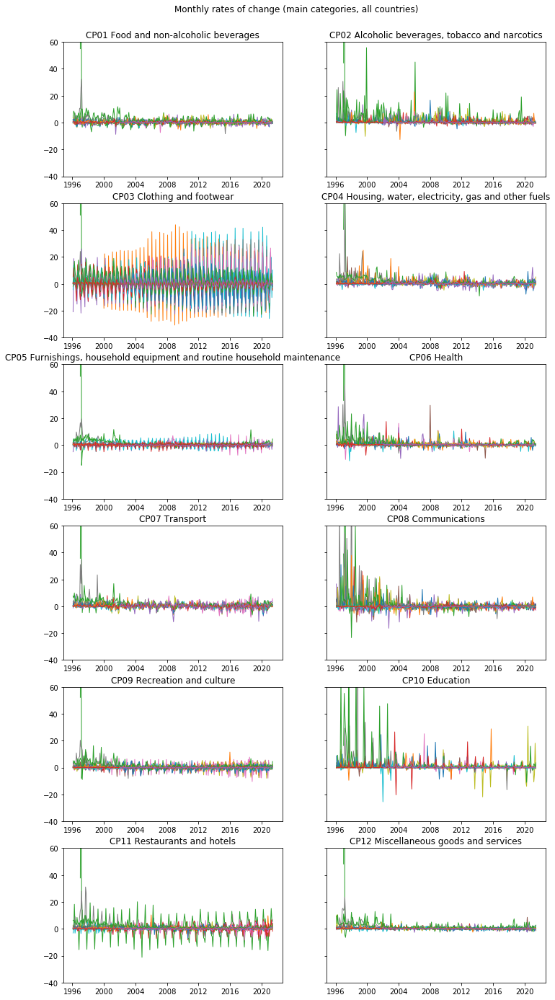

In [99]:
fig, axes = plt.subplots(6, 2, figsize=(12, 24), sharey=True)

for cat, ax in zip(main_cat, axes.ravel()):
    for country in df_mmor_small['Country'].unique():
        ax.plot(df_midx_dates[:-1],
                 df_mmor_small[(df_mmor_small['Country']==country) & (df_mmor_small['Category']==cat)].iloc[:,4:].values[0],
                linewidth=1)
        ax.set_title(df_mmor_small.loc[df_mmor_small['Category']==cat,'COICOP'].values[0] +' '+ cat)
plt.ylim([-40,60])
fig.suptitle('Monthly rates of change (main categories, all countries)', y=0.91)
plt.show()

We see that all time series are now (almost) quasi-stationary. We also see again the seasonality effects in the main categories 'CP03' and 'CP11': The rates of change reach rather big absolute values (i.e. positive and negative values) and do this in a very regular manner where each positive peak is followed by a negative peak and so on. The rates of change are also quite big for 'CP10' what is due to the stepwise character of these time series. All the other time series show much smaller and rather irregular fluctuations around zero with some exceptions for particular countries.

For all of those time series I have evaluated the mean, standard deviation, and skewness. The most interesting thereby is the standard deviation telling us how much strong and sudden jumps a time series has.

In [100]:
df_describe = df_mmor_small.iloc[:,:4].join(df_mmor_small.iloc[:,4:].T.describe().T)
df_describe['skew'] = df_mmor_small.iloc[:,4:].T.skew().tolist()

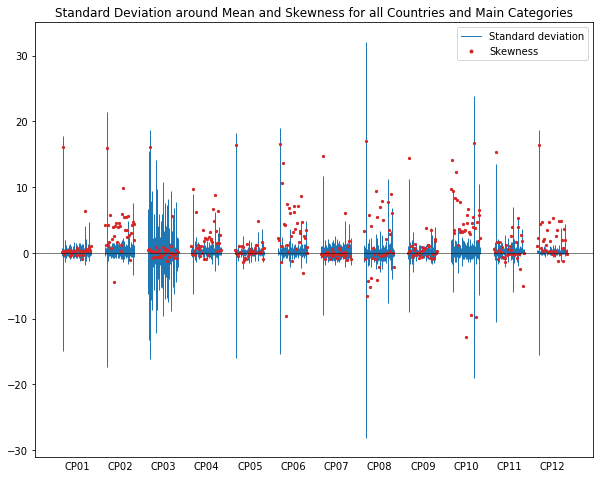

In [101]:
from matplotlib.lines import Line2D

offset = 0
plt.subplots(figsize=(10,8))
for country in df_mmor_small['Country'].unique():
    plt.errorbar(np.arange(12)+offset, df_describe.loc[df_describe['Country']==country,'mean'], 
                 yerr=df_describe.loc[df_describe['Country']==country,'std'], 
                 linewidth=1, fmt='none', color='tab:blue',zorder=-1)
    plt.scatter(np.arange(12)+offset, df_describe.loc[df_describe['Country']==country,'skew'],
                s=5, color='tab:red', zorder=1)
    offset += 0.02
    
plt.xticks(ticks=np.arange(12)+offset/2, labels=df_mmor_small['COICOP'].unique())
plt.tick_params(axis='x', which='both', length=0)
plt.axhline(0, color='k', linewidth=0.5)
plt.legend(handles=[Line2D([0], [0], color='tab:blue', lw=1),
                   Line2D([0], [0], marker='o', color='w', markerfacecolor='tab:red', markersize=5)],
           labels=['Standard deviation','Skewness'])
plt.title('Standard Deviation around Mean and Skewness for all Countries and Main Categories')
plt.show()

Once again we find the highest fluctuations (i.e. highest standard deviations) for many countries in 'CP03'. There were found some higher standard deviations but only for a few countries. Looking at the skewnesses we find that all main categories are dominated by either symmetric or right-skewed distributions, even if there are some exceptions. That can be explained not only by the general increase of prices but also by the asymmetry in the computation of the rates of change. 

Here you find the plot of the standard deviations for each country individually:

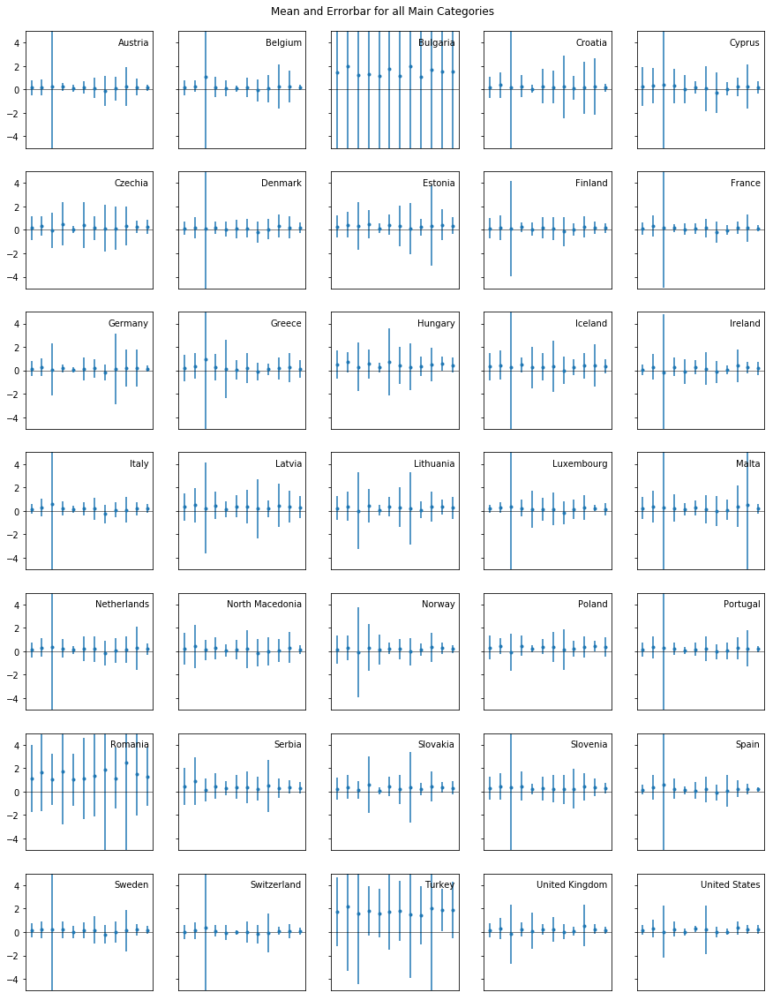

In [102]:
fig, axes = plt.subplots(7, 5, figsize=(15, 20), sharex=True, sharey=True)
plt.suptitle('Mean and Errorbar for all Main Categories', y=0.9)
for country, ax in zip(np.sort(df_mmor_small['Country'].unique()), axes.ravel()):
    ax.errorbar(main_cat, df_describe.loc[df_describe['Country']==country,'mean'], 
                yerr=df_describe.loc[df_describe['Country']==country,'std'], fmt='.')
    ax.annotate(country, xy=(140, 125), xycoords='axes points', size=10, ha='right', va='top')
    ax.set_xticks([])
    ax.axhline(0, color='k', linewidth=0.5)
    ax.set_ylim([-5,5])
plt.show()

Finally I have picked out some categories from the **detailed dataframe** that we have already analyzed before: 'Garments for women' and 'Liquid fuels'. Remember that for the first one we have found a strong seasonal variation whereas the second was showing direct dependency from the oil price. For both of them we have seen that the effect is strongly pronounced in many countries but smoothed out in some others.

Here, when looking at the rate of change, we see the same effects in a new look. We also can see that the computed standard deviation correlates with the depicted size of fluctuations while at the same time the mean is not a helpful measure as I have explained in the introduction to this section.

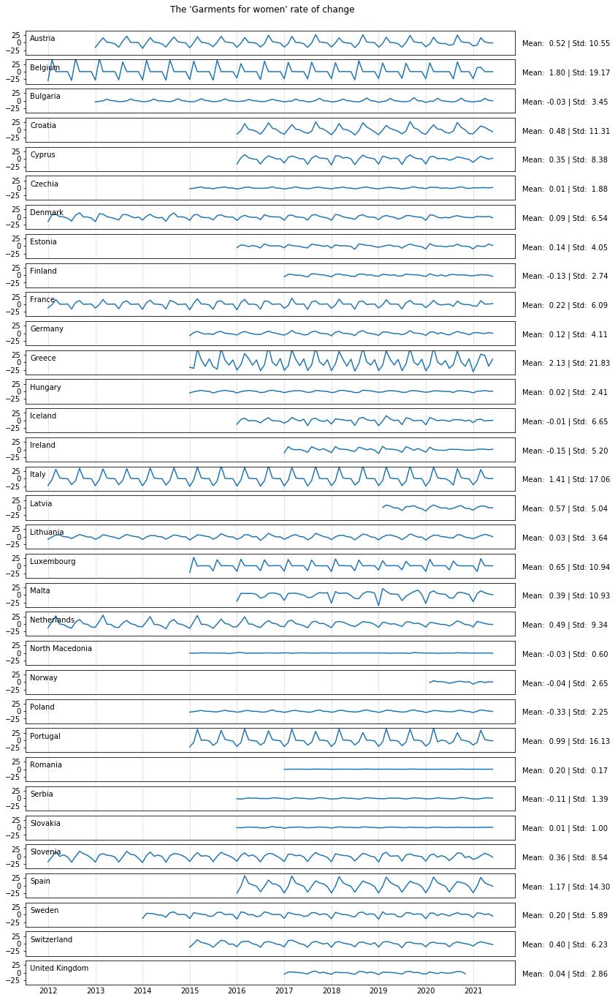

In [103]:
# only for available countries
countries = np.sort(df_mmor_detailed.loc[(df_mmor_detailed['Category']=='Garments for women'),'Country'].values)

fig, axes = plt.subplots(len(countries), 1, figsize=(12, 24), sharex=True)
plt.suptitle("The 'Garments for women' rate of change", y=0.9)
for country, ax in zip(countries, axes.ravel()):   
    ax.plot(df_midx_dates[0:114],
            df_mmor_detailed[(df_mmor_detailed['Category']=='Garments for women') 
                             & (df_mmor_detailed['Country']==country)].iloc[:,4:118].values.T)
    ax.annotate(country, xy=(6, 27), xycoords='axes points', size=10, ha='left', va='top')
    ax.annotate('Mean: {:5.2f} | Std: {:5.2f}'.format(
        df_mmor_detailed[(df_mmor_detailed['Category']=='Garments for women') 
                         & (df_mmor_detailed['Country']==country)].mean(axis=1).values[0],
        df_mmor_detailed[(df_mmor_detailed['Category']=='Garments for women') 
                         & (df_mmor_detailed['Country']==country)].std(axis=1).values[0]), 
                xy=(680, 20), xycoords='axes points', size=10, ha='left', va='top')
    ax.grid(axis='x', linestyle='--', linewidth=0.5)
    ax.tick_params(axis='x', which='both', length=0)
    ax.set_ylim([-40,40])
plt.show()

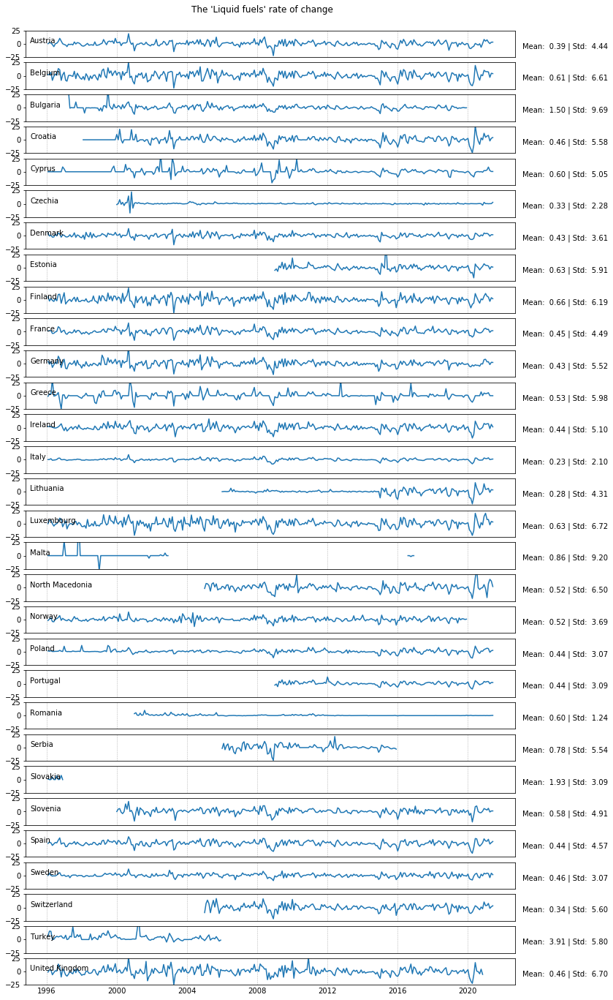

In [104]:
# only for available countries
countries = np.sort(df_mmor_detailed.loc[(df_mmor_detailed['Category']=='Liquid fuels'),'Country'].values)

fig, axes = plt.subplots(len(countries), 1, figsize=(12, 24), sharex=True)
plt.suptitle("The 'Liquid fuels' rate of change", y=0.9)
for country, ax in zip(countries, axes.ravel()):   
    ax.plot(df_midx_dates[:-1],
            df_mmor_detailed[(df_mmor_detailed['Category']=='Liquid fuels') & (df_mmor_detailed['Country']==country)]
             .iloc[:,4:].values.T)
    ax.annotate(country, xy=(6, 27), xycoords='axes points', size=10, ha='left', va='top')
    ax.annotate('Mean: {:5.2f} | Std: {:5.2f}'.format(
        df_mmor_detailed[(df_mmor_detailed['Category']=='Liquid fuels') 
                         & (df_mmor_detailed['Country']==country)].mean(axis=1).values[0],
        df_mmor_detailed[(df_mmor_detailed['Category']=='Liquid fuels') 
                         & (df_mmor_detailed['Country']==country)].std(axis=1).values[0]), 
                xy=(680, 20), xycoords='axes points', size=10, ha='left', va='top')
    ax.grid(axis='x', linestyle='--', linewidth=0.5)     
    ax.tick_params(axis='x', which='both', length=0)
    ax.set_ylim([-25,25])
plt.show()

Lastly I want to elucidate a bit more about the mean and the standard deviation of the rate of change. We have seen that due to the asymmetry in the definition of the rate of change, a high fluctuation and thus a high standard deviation induces a high positive mean even if the overall rate of change is small. On the other hand a negative mean always tells us that the overall trend is falling (because the mean is biased towards positive values).

Below I plotted the means and standard deviations for all product categories of the detailed dataframe. Even if there are some exceptions we notice a positive correlation: higher mean, higher standard deviation. Then I have picked out some categories with extremely high means and plotted their indices (not the rate of change!). We see that only one of the time series is rising steeply whereas all the others stay at their level but show extremely high (seasonal) fluctuations. Vice versa when selecting the catgories with extremely low negative means we find that all indices are strongly falling.

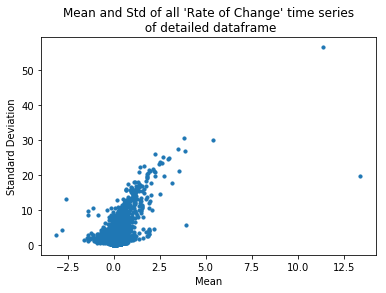

In [105]:
df_mmor_detailed_mean = df_mmor_detailed.iloc[:,:4].join(
    pd.DataFrame(df_mmor_detailed.mean(axis=1), columns=['mean'])).join(
    pd.DataFrame(df_mmor_detailed.std(axis=1), columns=['std']))

plt.scatter(df_mmor_detailed_mean['mean'], df_mmor_detailed_mean['std'], s=10)
plt.xlabel('Mean')
plt.ylabel('Standard Deviation')
plt.title("Mean and Std of all 'Rate of Change' time series\n of detailed dataframe")
plt.show()

In [106]:
# outliers > 3.8
df_mmor_detailed_mean[df_mmor_detailed_mean['mean'] > 3.8].sort_values('mean', ascending=False)

,COICOP,Category,Main Category,Country,mean,std
16337,CP07241,"Hire of garages, parking spaces and personal t...",Transport,Iceland,13.407827,19.831051
16771,CP07332,International flights,Transport,Poland,11.387321,56.523064
16336,CP07241,"Hire of garages, parking spaces and personal t...",Transport,Ireland,5.425152,30.106167
12725,CP0453,Liquid fuels,"Housing, water, electricity, gas and other fuels",Turkey,3.911430,5.802717
19281,CP09422,"Museums, libraries, zoological gardens",Recreation and culture,Greece,3.883694,26.886907
11902,CP04121,Actual rentals paid by tenants for secondary r...,"Housing, water, electricity, gas and other fuels",Denmark,3.820803,30.533365


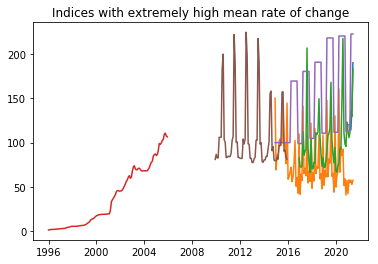

In [107]:
# outliers > 3.8: plot the corresponding indices (not the rates of change!)
idx = df_mmor_detailed_mean[df_mmor_detailed_mean['mean'] > 3.8].sort_values('mean', ascending=False).index
for i in idx:
    plt.plot(df_midx_dates, df_midx_detailed.loc[i,:].iloc[4:].values)        
plt.title('Indices with extremely high mean rate of change')
plt.show()

In [108]:
# outliers < -1.5
df_mmor_detailed_mean[df_mmor_detailed_mean['mean'] < -1.5].sort_values('mean', ascending=True)

,COICOP,Category,Main Category,Country,mean,std
17383,CP08302,Wireless telephone services,Communications,Iceland,-3.115167,2.851981
13589,CP05312,"Clothes washing machines, clothes drying machi...","Furnishings, household equipment and routine h...",Iceland,-2.823845,4.126999
19556,CP09512,Educational text books,Recreation and culture,Hungary,-2.574333,12.987617
17192,CP08202,Mobile telephone equipment,Communications,Estonia,-1.622278,1.484305


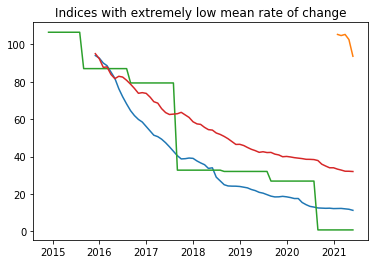

In [109]:
# outliers < -1.5: plot the corresponding indices
idx = df_mmor_detailed_mean[df_mmor_detailed_mean['mean'] < -1.5].sort_values('mean', ascending=True).index
for i in idx:
    plt.plot(df_midx_dates, df_midx_detailed.loc[i,:].iloc[4:].values)     
plt.title('Indices with extremely low mean rate of change')
plt.show()

## Part 5: Try out the rolling window method
I want to try out the rolling window method that we have learnt in the course. Therefore I will make use of the same time series that will be used in my machine learning task 2:

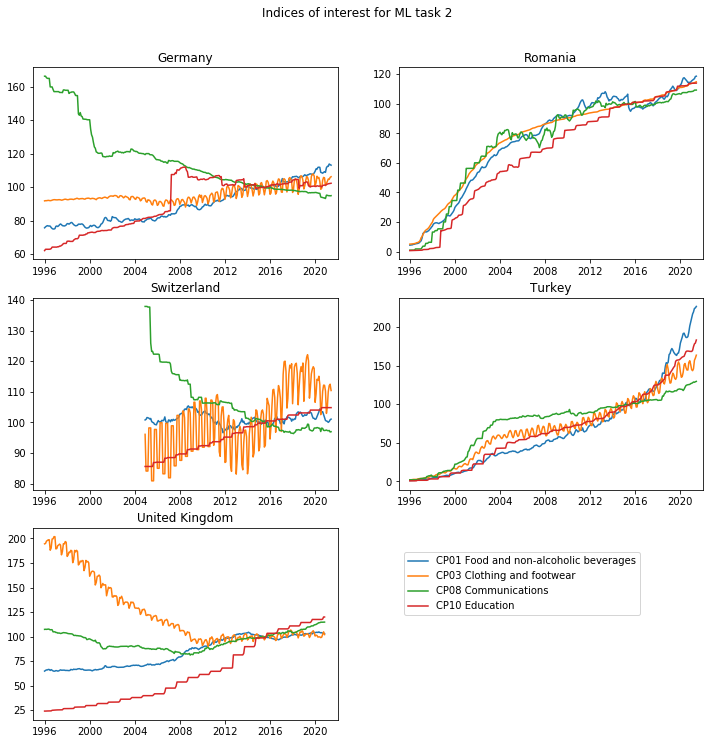

In [110]:
fig, axes = plt.subplots(3, 2, figsize=(12, 12))
plt.suptitle("Indices of interest for ML task 2", y=0.95)
for country, ax in zip(['Germany', 'Romania', 'Switzerland', 'Turkey', 'United Kingdom'], axes.ravel()):
    ax.plot(df_midx_dates, 
            df_midx_small[(df_midx_small['Country']==country) & 
                          (df_midx_small['COICOP'].isin(['CP01','CP03','CP08','CP10']))].iloc[:,4:].values.T,
           label=['CP01','CP03','CP08','CP10'])
    ax.set_title(country)
    ax.set_xlim(pd.to_datetime('1995'), pd.to_datetime('2022'))
fig.delaxes(axes[2][1])

handles, _ = ax.get_legend_handles_labels()
labels = ['CP01 ','CP03 ','CP08 ','CP10 '] + df_translation.loc[['CP01','CP03','CP08','CP10'],:].values[:,0]
plt.legend(handles, labels, loc='upper left', bbox_to_anchor=(1.2, 0.9))
plt.show()

I chose these time series because not only the countries show different patterns but also the categories: there are strong seasonal oscillations in 'CP03 Clothing', there are stepwise increases in 'CP10 Education', there are sudden jumps, random fluctuations and rather smooth time segments.


The `pandas.DataFrame.rolling` method requires a dataframe with a DateTimeIndex as index and the time series as columns. So we first need to rearrange our data:

In [111]:
import datetime

df_datetime = df_midx_small[
    (df_midx_small['Country'].isin(['Germany', 'Romania', 'Switzerland', 'Turkey', 'United Kingdom'])) & 
    (df_midx_small['COICOP'].isin(['CP01','CP03','CP08','CP10']))]
df_datetime.index = df_datetime['COICOP'] +' / '+ df_datetime['Country']
df_datetime = df_datetime.drop(['COICOP','Category','Main Category','Country'], axis=1)
df_datetime = df_datetime.T
df_datetime.sort_index(inplace=True)

# convert to last day of month / trick found on stackoverflow
df_datetime.index = pd.to_datetime(df_datetime.index, format ='%YM%m').to_period('M').to_timestamp('M')
df_datetime.head()

,CP01 / Switzerland,CP01 / Germany,CP01 / Romania,CP01 / Turkey,CP01 / United Kingdom,CP03 / Switzerland,CP03 / Germany,CP03 / Romania,CP03 / Turkey,CP03 / United Kingdom,CP08 / Switzerland,CP08 / Germany,CP08 / Romania,CP08 / Turkey,CP08 / United Kingdom,CP10 / Switzerland,CP10 / Germany,CP10 / Romania,CP10 / Turkey,CP10 / United Kingdom
1996-01-31,NaN,75.7,4.39,1.24,64.9,NaN,91.8,5.06,2.17,194.5,NaN,166.2,1.01,2.15,107.4,NaN,62.1,0.69,0.84,24.2
1996-02-29,NaN,76.3,4.48,1.29,65.6,NaN,91.9,5.13,2.13,194.9,NaN,166.2,1.01,2.16,107.5,NaN,62.9,0.70,0.84,24.2
1996-03-31,NaN,76.7,4.54,1.40,66.1,NaN,91.9,5.19,2.14,197.2,NaN,165.3,1.03,2.16,107.4,NaN,62.9,0.71,0.85,24.2
1996-04-30,NaN,77.0,4.66,1.50,66.1,NaN,92.0,5.27,2.50,197.9,NaN,164.9,1.05,2.16,107.5,NaN,62.9,0.72,0.85,24.3
1996-05-31,NaN,76.8,4.99,1.57,66.6,NaN,92.1,5.34,2.74,198.6,NaN,164.9,1.05,2.17,107.7,NaN,62.9,0.76,0.85,24.3


If we want to smooth out all effects of seasonality the windows size must be at least 12 months. Intuitively it also makes much sense to talk about a 1-year average.

On Eurostat's website we could have downloaded a file containing the yearly mean indices. This is exactly equivalent to manually executing the `.resample('A').mean()` method:

In [112]:
df_datetime.resample('A').mean()

,CP01 / Switzerland,CP01 / Germany,CP01 / Romania,CP01 / Turkey,CP01 / United Kingdom,CP03 / Switzerland,CP03 / Germany,CP03 / Romania,CP03 / Turkey,CP03 / United Kingdom,CP08 / Switzerland,CP08 / Germany,CP08 / Romania,CP08 / Turkey,CP08 / United Kingdom,CP10 / Switzerland,CP10 / Germany,CP10 / Romania,CP10 / Turkey,CP10 / United Kingdom
1996-12-31,NaN,76.033333,5.221667,1.582500,65.691667,NaN,92.100000,5.806667,2.838333,196.875000,NaN,162.008333,1.426667,2.455833,106.725000,NaN,63.308333,0.799167,1.095000,24.566667
1997-12-31,NaN,77.091667,13.058333,3.015000,65.608333,NaN,92.483333,14.390000,4.995833,192.025000,NaN,157.125000,4.820000,5.729167,103.791667,NaN,65.258333,1.530000,2.119167,25.833333
1998-12-31,NaN,77.875000,19.275833,5.551667,66.258333,NaN,92.816667,24.689167,9.015000,184.541667,NaN,156.233333,14.579167,8.777500,102.216667,NaN,68.200000,5.521667,4.500000,27.283333
1999-12-31,NaN,76.908333,24.332500,8.175833,66.433333,NaN,93.116667,32.647500,13.698333,174.858333,NaN,141.541667,27.629167,14.680000,99.200000,NaN,71.550000,16.845000,8.175833,28.850000
2000-12-31,NaN,76.600000,35.040833,11.953333,66.108333,NaN,93.175000,42.372500,19.370833,162.108333,NaN,126.008333,42.225000,25.085000,95.308333,NaN,73.225000,25.850833,12.401667,30.541667
2001-12-31,NaN,80.008333,47.703333,17.920000,68.633333,NaN,93.891667,54.217500,29.140000,149.983333,NaN,118.625000,57.236667,43.915000,89.016667,NaN,74.191667,36.370000,17.850833,32.391667
2002-12-31,NaN,80.675000,56.443333,26.976667,69.175000,NaN,94.583333,62.694167,44.115833,139.116667,NaN,120.641667,64.311667,61.068333,89.750000,NaN,76.141667,44.310833,27.865833,34.191667
2003-12-31,NaN,80.558333,64.686667,34.346667,69.975000,NaN,93.841667,70.119167,55.465000,133.808333,NaN,121.416667,72.943333,75.865833,90.150000,NaN,77.775000,49.526667,38.158333,36.800000
2004-12-31,100.800000,80.266667,70.773333,37.264167,70.433333,96.100000,93.158333,75.420833,59.610833,127.433333,137.900000,120.408333,80.533333,80.489167,89.508333,85.600000,80.333333,55.449167,46.070000,38.550000
2005-12-31,100.500000,80.633333,75.079167,38.708333,71.508333,90.225000,91.408333,79.029167,62.222500,120.916667,129.200000,118.900000,78.932500,82.433333,87.450000,86.041667,82.133333,58.835833,52.056667,40.441667


The rolling window method does a bit more: it does not only compute the mean from january to december but evaluates a mean for every combination of 12 consecutive months. With the `center` option it is specified where the result is saved. If we use `center=True` we find the same values as above on july 31. (And if we had used `center=False` it would have been december 31.)

In [113]:
# compute rolling mean and std
df_mean = df_datetime.rolling(12, center=True).mean()
df_std = df_datetime.rolling(12, center=True).std()

df_mean.head(10)

,CP01 / Switzerland,CP01 / Germany,CP01 / Romania,CP01 / Turkey,CP01 / United Kingdom,CP03 / Switzerland,CP03 / Germany,CP03 / Romania,CP03 / Turkey,CP03 / United Kingdom,CP08 / Switzerland,CP08 / Germany,CP08 / Romania,CP08 / Turkey,CP08 / United Kingdom,CP10 / Switzerland,CP10 / Germany,CP10 / Romania,CP10 / Turkey,CP10 / United Kingdom
1996-01-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1996-02-29,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1996-03-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1996-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1996-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1996-06-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1996-07-31,NaN,76.033333,5.221667,1.5825,65.691667,NaN,92.100000,5.806667,2.838333,196.875000,NaN,162.008333,1.426667,2.455833,106.725000,NaN,63.308333,0.799167,1.095000,24.566667
1996-08-31,NaN,76.108333,5.467500,1.6500,65.733333,NaN,92.150000,6.165000,2.977500,196.441667,NaN,161.241667,1.494167,2.591667,106.458333,NaN,63.483333,0.822500,1.155833,24.658333
1996-09-30,NaN,76.150000,5.864167,1.7300,65.708333,NaN,92.191667,6.586667,3.115000,196.016667,NaN,160.475000,1.644167,2.743333,106.183333,NaN,63.591667,0.846667,1.217500,24.750000
1996-10-31,NaN,76.133333,6.504167,1.8200,65.608333,NaN,92.233333,7.116667,3.254167,195.633333,NaN,159.783333,1.867500,2.908333,105.866667,NaN,63.716667,0.894167,1.278333,24.850000


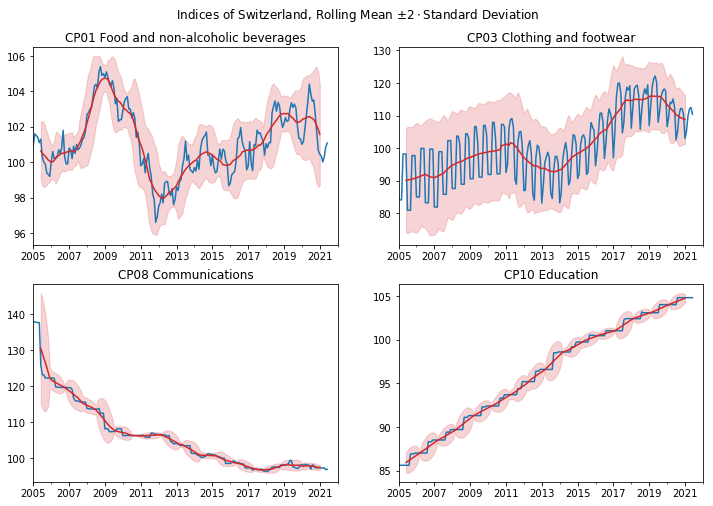

In [114]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
plt.suptitle("Indices of Switzerland, Rolling Mean $\pm 2 \cdot$Standard Deviation", y=0.95)
for coicop, ax in zip(['CP01','CP03','CP08','CP10'], axes.ravel()):
    df_datetime[coicop + ' / Switzerland'].plot(ax=ax)
    df_mean[coicop + ' / Switzerland'].plot(c='tab:red', ax=ax)
    ax.fill_between(df_mean.index, 
                    df_mean[coicop + ' / Switzerland'] - 2*df_std[coicop + ' / Switzerland'], 
                    df_mean[coicop + ' / Switzerland'] + 2*df_std[coicop + ' / Switzerland'],
                    color='tab:red', alpha=0.2)
    
    ax.set_title(coicop +' '+ df_translation.loc[coicop,:].values[0])
    ax.set_xlim(pd.to_datetime('2005'), pd.to_datetime('2022'))
plt.show()

Above I plotted the Swiss indices (blue), the computed rolling mean (red) and an offset of $\pm 2$ times the standard deviation (light pink shadow). Due to the window's size itself a computation is not possible for the earliest and latest time steps of the series. We see that the rolling mean gives a rather smooth curve as all random fluctuations and seasonal effects are damped out. In contrast the standard deviation is not yet smooth. In case of a stepwise decreasing ('CP08') or increasing ('CP10') curve that visually looks like "bubbles" around the steps. A remedy would be to use a bigger window for the standard deviation, if needed.

Below I analyzed the standard deviations in more detail, first for Switzerland and then for the other countries. For Turkey we notice an overall increase of all standard deviations. This is because the underlying Turkish indices are rapidly rising, and the standard deviation is an absolute/unscaled measure. For Switzerland we find that the standard deviation for 'CP03 Clothing' is falling but still quite high compared to the other countries. For 'CP10 Education' we notice that all countries show the typical stepwise changing index and we can identify by looking at the standadrd deviation which steps were extremely high.

In the last plot I have depicted the difference between the index and the rolling mean, and the standard deviation. This kind of display shows very well how the fluctuations evolve over time, if they get smaller or bigger, and if they are regular or irregular.

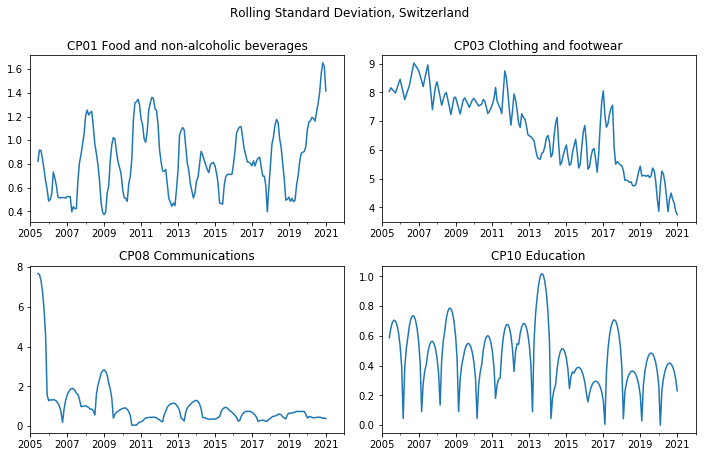

In [115]:
fig, axes = plt.subplots(2, 2, figsize=(10, 6))
plt.suptitle("Rolling Standard Deviation, Switzerland", y=1.05)
for coicop, ax in zip(['CP01','CP03','CP08','CP10'], axes.ravel()):
    df_std[coicop + ' / Switzerland'].plot(ax=ax)
    ax.set_title(coicop +' '+ df_translation.loc[coicop,:].values[0])
    ax.set_xlim(pd.to_datetime('2005'), pd.to_datetime('2022'))
plt.tight_layout()
plt.show()

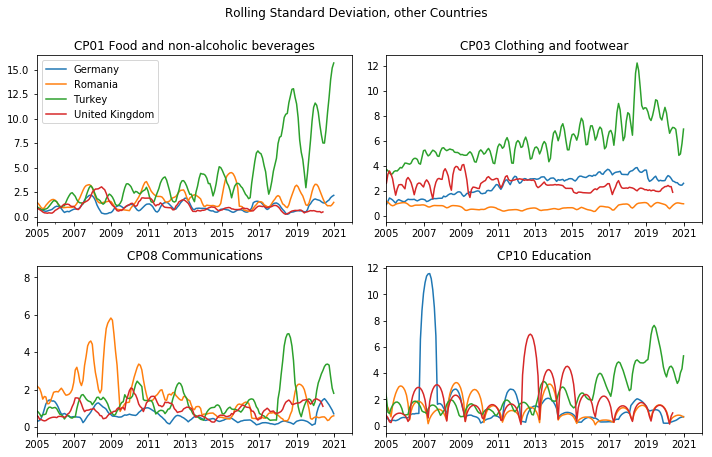

In [116]:
fig, axes = plt.subplots(2, 2, figsize=(10, 6))
plt.suptitle("Rolling Standard Deviation, other Countries", y=1.05)
for coicop, ax in zip(['CP01','CP03','CP08','CP10'], axes.ravel()):
    df_std.loc[:, df_std.columns.str.contains(coicop) & 
               ~df_std.columns.str.contains('Switzerland')].plot(ax=ax, legend=False) 
    ax.set_title(coicop +' '+ df_translation.loc[coicop,:].values[0])
    ax.set_xlim(pd.to_datetime('2005'), pd.to_datetime('2022'))

    if coicop=='CP01':
        handles, labels = ax.get_legend_handles_labels()
        labels = [label.strip('CP10 / ') for label in labels]
        ax.legend(handles, labels, loc='upper left')
plt.tight_layout()
plt.show()

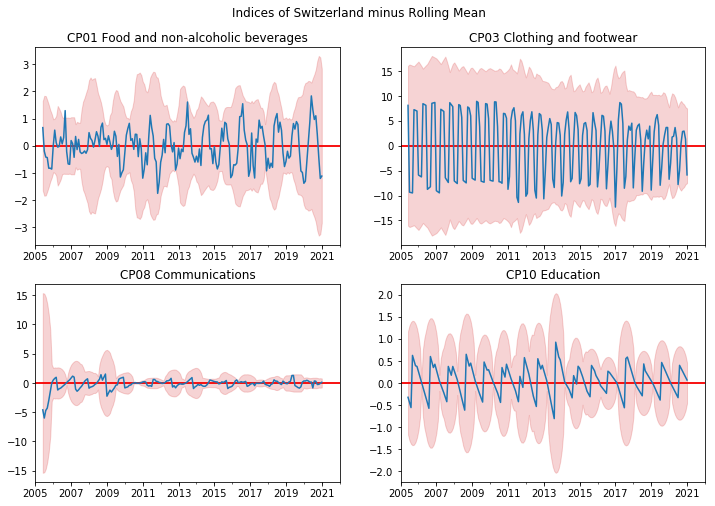

In [117]:
fig, axes = plt.subplots(2, 2, figsize=(12, 8))
plt.suptitle("Indices of Switzerland minus Rolling Mean", y=0.95)
for coicop, ax in zip(['CP01','CP03','CP08','CP10'], axes.ravel()):
    (df_datetime[coicop + ' / Switzerland'] - df_mean[coicop + ' / Switzerland']).plot(ax=ax)
    ax.hlines(0, pd.to_datetime('2005'), pd.to_datetime('2022'),'tab:red')
    ax.fill_between(df_mean.index, 
                    - 2*df_std[coicop + ' / Switzerland'], 2*df_std[coicop + ' / Switzerland'],
                    color='tab:red', alpha=0.2)
    ax.set_title(coicop +' '+ df_translation.loc[coicop,:].values[0])
    ax.set_xlim(pd.to_datetime('2005'), pd.to_datetime('2022'))
    ax.hlines(0, pd.to_datetime('2005'), pd.to_datetime('2022'),'r')
plt.show()

## Part 6: Find price indices showing seasonality
By plotting the indices we have already seen that there are several indices showing seasonality. Now I want to try out if I can find a systematic mathematical approach to identify them. I will have a look at some different approaches:
- In the proposal I have suggested to compute the correlation between the time series and its shifted lags. If this correlation is much bigger for all multiples of 12 than for the other lags, it is a sign of seasonality.
- Another way is to look at the decomposition of a time series into trend, seasonal component and residuals.
- In this context Amir Khalilzadeh also suggested to have a deeper look at the "Augmented Dickey-Fuller" test - i.e. a null hypothesis testing approach for stationarity.

Another question that arises is where to start from. The straightforward way is to look at the time series of the indices what I will do in the first step. But we might also start from the monthly rates of change or from the detrended time series as we will see afterwards.

### Seasonality in the Price Indices
**Autocorrelation within the Lags**

In order to get a feeling for the data and the methods I will first look at the 'CP01 Food' and the 'CP03 Clothing' indices of Switzerland. We already know that there is a repetitive seasonal regularity in 'CP03' whereas the 'CP01' index is much more random and irregular (but also with some seasonal dependency for example for fruit and vegetable).

In the below figures we find the scatter plots of these time series versus its first 12 lags as well as the numerical value of the correlation coefficient:

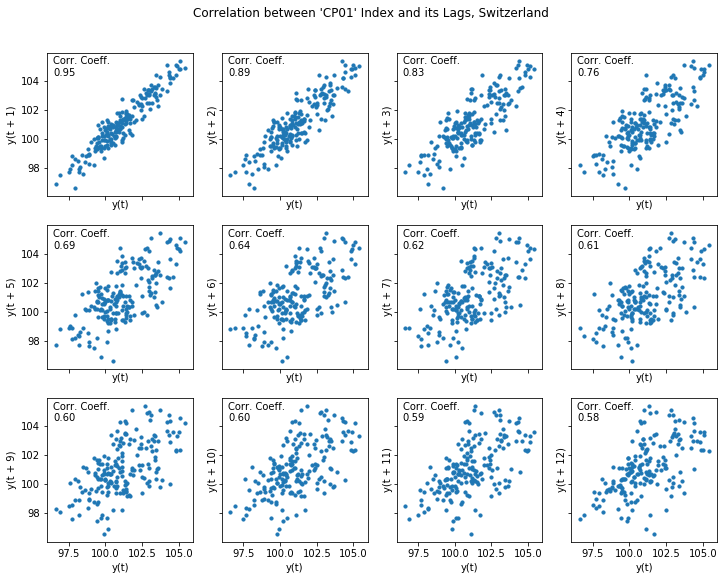

In [118]:
# extract time series
data_CP01 = df_midx_small[(df_midx_small['Country']=='Switzerland') & (df_midx_small['COICOP']=='CP01')].iloc[0,4:] \
        .sort_index().astype('float64')

fig, axes = plt.subplots(3, 4, figsize=(12, 9), sharex=True, sharey=True)
plt.suptitle("Correlation between 'CP01' Index and its Lags, Switzerland", y=0.95)
for lag, ax in zip(np.arange(1,13), axes.ravel()):
    pd.plotting.lag_plot(data_CP01, lag=lag, ax=ax, s=10)
    ax.annotate('Corr. Coeff.\n{:.2f}'.format(data_CP01.autocorr(lag)),
                xy=(6, 140), xycoords='axes points', size=10, ha='left', va='top')
    
plt.show()

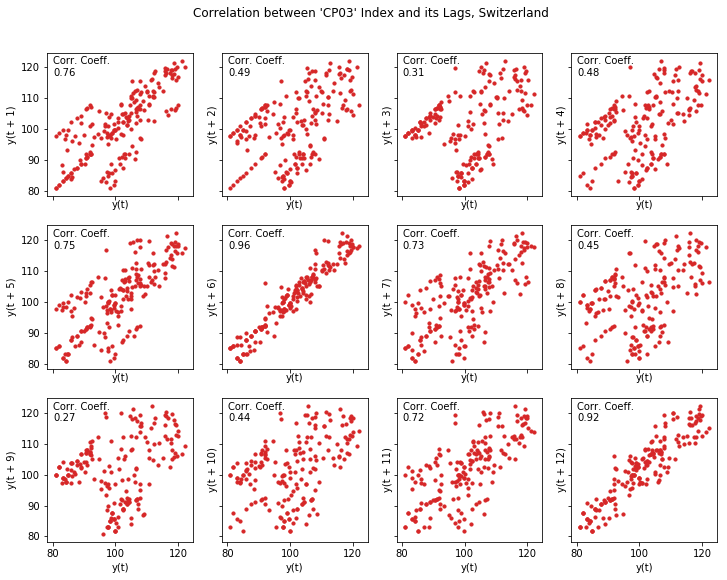

In [119]:
# extract time series
data_CP03 = df_midx_small[(df_midx_small['Country']=='Switzerland') & (df_midx_small['COICOP']=='CP03')].iloc[0,4:] \
        .sort_index().astype('float64')

fig, axes = plt.subplots(3, 4, figsize=(12, 9), sharex=True, sharey=True)
plt.suptitle("Correlation between 'CP03' Index and its Lags, Switzerland", y=0.95)
for lag, ax in zip(np.arange(1,13), axes.ravel()):
    pd.plotting.lag_plot(data_CP03, lag=lag, ax=ax, s=10, c='tab:red')
    ax.annotate('Corr. Coeff.\n{:.2f}'.format(data_CP03.autocorr(lag)),
                xy=(6, 140), xycoords='axes points', size=10, ha='left', va='top')
    
plt.show()

For 'CP01' we see that the autocorrelation coefficient is monotonically falling from lag to lag. A lag that is closer to the current time series shows stronger correlation than another one further away.

However for 'CP03' the autocorrelation for lag 6 and lag 12 is much higher than for all the other lags. That is a clear indicator for a seasonality with a 6-month period, consistent with summer sale/winter sale.

The `statsmodel` library provides another kind of visualization for the autocorrelation of a time series. It shows the correlation coefficients versus the lags (here 48, i.e. four years) and the confidence interval using Bartlett's formula showing which autocorrelations are significant or insignificant.

Again we see that for 'CP01' only the first lags show a significant autocorrelation (due to the continuity and closeness of the index values) whereas for 'CP03' we find a clear pattern of significant and less significant lags.

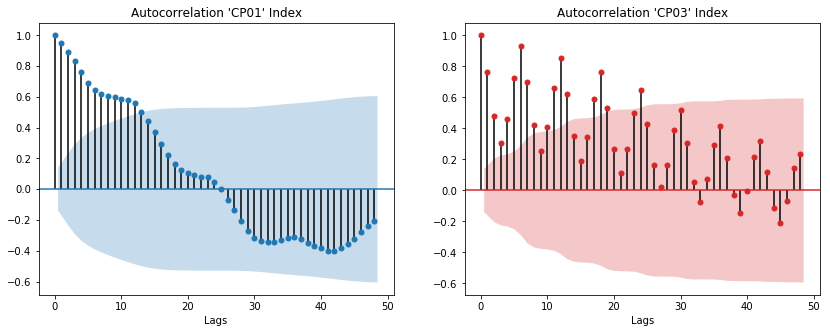

In [120]:
import statsmodels.api as sm
from matplotlib.collections import PolyCollection

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sm.graphics.tsa.plot_acf(data_CP01.dropna(), lags=48, ax=axes[0], title="Autocorrelation 'CP01' Index")
axes[0].set_xlabel('Lags')
sm.graphics.tsa.plot_acf(data_CP03.dropna(), lags=48, ax=axes[1], c='tab:red', title="Autocorrelation 'CP03' Index")
axes[1].set_xlabel('Lags')

# not obvious how to change the background color --> solution from stackoverflow:
    #get polygon patch collections and change their color
for item in axes[1].collections:
    if type(item)==PolyCollection:
        item.set_facecolor('tab:red')

plt.show()

The previous plots `lag_plot` and `plot_acf` yield intuitive visual representations for a single time series but are rather inefficient methods for analyzing a big amount of time series. Therefore we would need a more mathematical and automatic criteria.

So let's take another look at all autocorrelation coefficients of the small dataframe:

In [121]:
# compute and save all autocorrelation coefficients
df_midx_small_lags = df_midx_small.iloc[:,:4].copy()

for lag in np.arange(1,49):
    df_midx_small_lags['Corr. Lag '+str(lag)] = (df_midx_small.iloc[:,4:].T).corrwith(df_midx_small.iloc[:,4:].T.shift(lag))
df_midx_small_lags.head()

,COICOP,Category,Main Category,Country,Corr. Lag 1,Corr. Lag 2,Corr. Lag 3,Corr. Lag 4,Corr. Lag 5,Corr. Lag 6,...,Corr. Lag 39,Corr. Lag 40,Corr. Lag 41,Corr. Lag 42,Corr. Lag 43,Corr. Lag 44,Corr. Lag 45,Corr. Lag 46,Corr. Lag 47,Corr. Lag 48
7552,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Austria,0.999161,0.998432,0.997553,0.996566,0.995701,0.995093,...,0.979821,0.978795,0.977940,0.977509,0.977493,0.977865,0.978459,0.978831,0.978904,0.978654
7553,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Belgium,0.999254,0.998414,0.997403,0.996386,0.995530,0.994854,...,0.981090,0.980208,0.979436,0.978845,0.978572,0.978639,0.978944,0.979263,0.979417,0.979439
7554,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Bulgaria,0.994000,0.985650,0.983086,0.980321,0.977482,0.975111,...,0.926997,0.924513,0.921832,0.919535,0.917061,0.914940,0.914163,0.914148,0.913965,0.912632
7555,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Switzerland,0.947391,0.893026,0.831442,0.763457,0.694178,0.644449,...,-0.406256,-0.424704,-0.446004,-0.452252,-0.437942,-0.408989,-0.380058,-0.333457,-0.296722,-0.260263
7556,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Cyprus,0.996681,0.994154,0.992106,0.991564,0.991207,0.991097,...,0.962955,0.961968,0.960604,0.959342,0.957652,0.956199,0.954940,0.954460,0.953525,0.952600


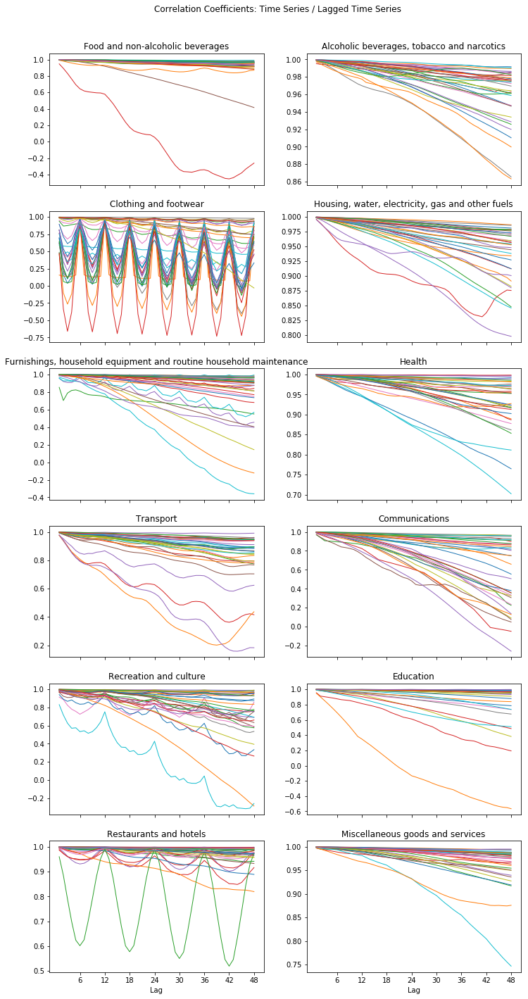

In [122]:
# plot all autocorrelation coefficients
fig, axes = plt.subplots(6, 2, figsize=(12, 24), sharex=True)

for cat, ax in zip(main_cat, axes.ravel()):
    for country in df_midx_small['Country'].unique():
        ax.plot(np.arange(1,49),
                df_midx_small_lags[(df_midx_small_lags['Country']==country) & (df_midx_small_lags['Main Category']==cat)]
                .iloc[:,4:].values[0], linewidth=1)
    ax.set_title(cat)
    ax.set_xticks(np.arange(6,49,6))
    if (cat=='Restaurants and hotels') | (cat=='Miscellaneous goods and services'):
        ax.set_xlabel('Lag')
fig.suptitle('Correlation Coefficients: Time Series / Lagged Time Series', y=0.92)
plt.show()

Again we visually see which time series show a high degree of seasonality. A mathematical criteria for their identification could be that the autocorrelation coefficient for the twelfth lag is bigger than the mean of the previous lags:

In [123]:
with pd.option_context('display.max_colwidth', 1000):
    display(df_midx_small_lags.loc[df_midx_small_lags['Corr. Lag 12'] > df_midx_small_lags.iloc[:,4:15].mean(axis=1),
                       ['Category','Country']].groupby('Category', sort=False)['Country']
            .agg(['count', lambda x: ', '.join(list(x))]).rename(columns={'<lambda>':'Countries'}))

,count,Countries
Category,,
Food and non-alcoholic beverages,1,Greece
Clothing and footwear,28,"Austria, Belgium, Switzerland, Cyprus, Germany, Denmark, Estonia, Greece, Spain, Finland, France, Croatia, Hungary, Ireland, Iceland, Italy, Lithuania, Luxembourg, Latvia, Malta, Netherlands, Norway, Portugal, Sweden, Slovenia, Turkey, United Kingdom, United States"
"Furnishings, household equipment and routine household maintenance",6,"Belgium, Cyprus, Greece, France, Luxembourg, United Kingdom"
Health,2,"Finland, United Kingdom"
Transport,1,Norway
Recreation and culture,15,"Austria, Belgium, Switzerland, Czechia, Germany, Spain, Croatia, Hungary, Italy, Luxembourg, Malta, Netherlands, Serbia, Sweden, Slovenia"
Education,5,"Switzerland, Czechia, France, Norway, United States"
Restaurants and hotels,16,"Austria, Belgium, Switzerland, Cyprus, Germany, Denmark, Estonia, Greece, France, Croatia, Iceland, Italy, Malta, Netherlands, Portugal, United States"


**Seasonal Decomposition**

Another way of identifying seasonality is looking at the seasonal decomposition of a time series. We can always split up a time series into three additive components:
- *the trend:* that is indeed another word for the rolling mean that we have investigated in the previous section
- *the seasonal component:* a strictly repetitive pattern. In our case and in the easiest decomposition model it would be a mean value for january, a mean value for february,...
- *the residual:* the remainder to sum up to the total

We could compute this decomposition by hand but there is also a ready-to-use method in `statsmodel` that can be applied for our 'CP01' and 'CP03' reference data from Switzerland:

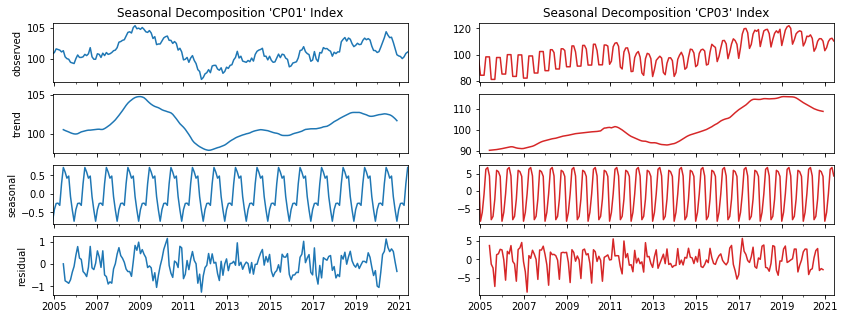

In [124]:
from statsmodels.tsa.seasonal import seasonal_decompose

fig, axes = plt.subplots(4, 2, figsize=(14, 5), sharex=True)
res0 = seasonal_decompose(pd.Series(data_CP01).set_axis(df_midx_dates.sort_values(), inplace=False).dropna(), 
                   model='additive')
res1 = seasonal_decompose(pd.Series(data_CP03).set_axis(df_midx_dates.sort_values(), inplace=False).dropna(), 
                   model='additive')

res0.observed.plot(ax=axes[0,0])
axes[0,0].set_ylabel('observed')
axes[0,0].set_title("Seasonal Decomposition 'CP01' Index")
res0.trend.plot(ax=axes[1,0])
axes[1,0].set_ylabel('trend')
res0.seasonal.plot(ax=axes[2,0])
axes[2,0].set_ylabel('seasonal')
res0.resid.plot(ax=axes[3,0])
axes[3,0].set_ylabel('residual')

res1.observed.plot(ax=axes[0,1], c='tab:red')
axes[0,1].set_title("Seasonal Decomposition 'CP03' Index")
res1.trend.plot(ax=axes[1,1], c='tab:red')
res1.seasonal.plot(ax=axes[2,1], c='tab:red')
res1.resid.plot(ax=axes[3,1], c='tab:red')
plt.show()

We see that the seasonal decomposition works well for our data and that we find a seasonal pattern in both indices. Note that the amount of seasonal fluctuation is much bigger for 'CP03' than for 'CP01' (as expected). The period of the seasonal pattern is always 12 months, even if we have two peaks in a year. The trend looks very similar to the rolling mean that I have computed by hand previously (as expected).

An annoying property of that simple decomposition method is that the residual for 'CP03' still shows seasonality. That can be healed by using a more advanced decomposition method like STL that also allows a temporal modification of the seasonal component. I have tried it out once, but I did not care about the details and don't want to go deeper here:

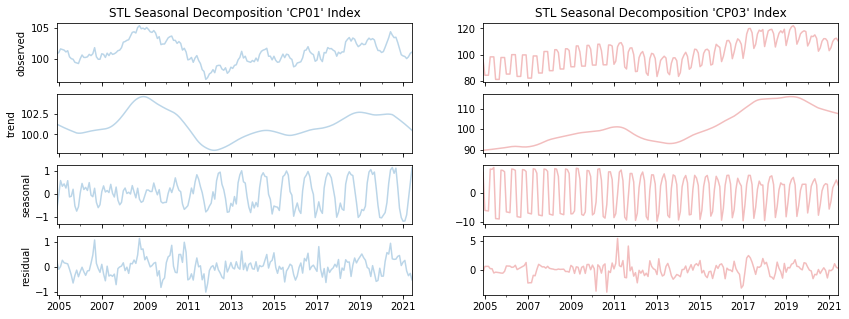

In [125]:
from statsmodels.tsa.seasonal import STL

fig, axes = plt.subplots(4, 2, figsize=(14, 5), sharex=True)
res0a = STL(pd.Series(data_CP01).set_axis(df_midx_dates.sort_values(), inplace=False).dropna()).fit()
res1a = STL(pd.Series(data_CP03).set_axis(df_midx_dates.sort_values(), inplace=False).dropna()).fit()

res0a.observed.plot(ax=axes[0,0], alpha=0.3)
axes[0,0].set_ylabel('observed')
axes[0,0].set_title("STL Seasonal Decomposition 'CP01' Index")
res0a.trend.plot(ax=axes[1,0], alpha=0.3)
axes[1,0].set_ylabel('trend')
res0a.seasonal.plot(ax=axes[2,0], alpha=0.3)
axes[2,0].set_ylabel('seasonal')
res0a.resid.plot(ax=axes[3,0], alpha=0.3)
axes[3,0].set_ylabel('residual')

res1a.observed.plot(ax=axes[0,1], c='tab:red', alpha=0.3)
axes[0,1].set_title("STL Seasonal Decomposition 'CP03' Index")
res1a.trend.plot(ax=axes[1,1], c='tab:red', alpha=0.3)
res1a.seasonal.plot(ax=axes[2,1], c='tab:red', alpha=0.3)
res1a.resid.plot(ax=axes[3,1], c='tab:red', alpha=0.3)
plt.show()

As already said we find a seasonal component in both indices but there is a significant difference in the amount. We can use this measure as another mathematical mean to identify the strength of seasonality:

In [126]:
# range of variation for 'CP01'
res0.seasonal.max() - res0.seasonal.min()

1.4542708333333332

In [127]:
# range of variation for 'CP03'
res1.seasonal.max() - res1.seasonal.min()

15.235833333333336

In [128]:
# same for all indices of small dataframe
seasonal_var = []
for row in np.arange(df_midx_small.shape[0]):
    res = seasonal_decompose(pd.Series(df_midx_small.iloc[row,4:])
                             .set_axis(df_midx_dates.sort_values(), inplace=False).dropna(), 
                   model='additive').seasonal
    seasonal_var.append(res.max() - res.min())
    
df_seasonal = pd.concat([
    df_midx_small.iloc[:,:4],
    pd.DataFrame(seasonal_var, index=df_midx_small.index, columns=['Seasonal Variation'])],
    axis=1)

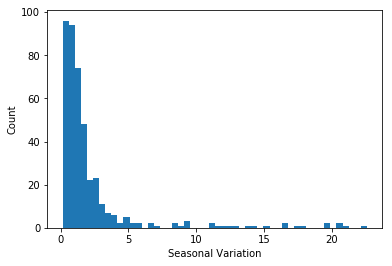

In [129]:
plt.hist(df_seasonal['Seasonal Variation'], bins=50)
plt.xlabel('Seasonal Variation')
plt.ylabel('Count')
plt.show()

We see that most indices show a seasonal variation lower than 2. The 'CP03' of Switzerland is one of the biggest with 15.3.

Let's identify the indices with the smallest and the biggest ranges:

In [130]:
# lowest seasonal variance
df_seasonal.sort_values(by='Seasonal Variation').head(20)

,COICOP,Category,Main Category,Country,Seasonal Variation
14736,CP06,Health,Health,Switzerland,0.140535
12889,CP05,"Furnishings, household equipment and routine h...","Furnishings, household equipment and routine h...",Slovenia,0.191893
20693,CP12,Miscellaneous goods and services,Miscellaneous goods and services,Croatia,0.208551
20713,CP12,Miscellaneous goods and services,Miscellaneous goods and services,United Kingdom,0.219444
11757,CP04,"Housing, water, electricity, gas and other fuels","Housing, water, electricity, gas and other fuels",Austria,0.221081
20702,CP12,Miscellaneous goods and services,Miscellaneous goods and services,Malta,0.227234
12872,CP05,"Furnishings, household equipment and routine h...","Furnishings, household equipment and routine h...",Croatia,0.233647
12873,CP05,"Furnishings, household equipment and routine h...","Furnishings, household equipment and routine h...",Hungary,0.237765
12854,CP05,"Furnishings, household equipment and routine h...","Furnishings, household equipment and routine h...",Bulgaria,0.241771
12884,CP05,"Furnishings, household equipment and routine h...","Furnishings, household equipment and routine h...",Poland,0.254375


In [131]:
# highest seasonal variance
df_seasonal.sort_values(by='Seasonal Variation', ascending=False).head(20)

,COICOP,Category,Main Category,Country,Seasonal Variation
11018,CP03,Clothing and footwear,Clothing and footwear,Greece,22.568939
20316,CP11,Restaurants and hotels,Restaurants and hotels,Malta,20.819781
11009,CP03,Clothing and footwear,Clothing and footwear,Cyprus,20.713515
11038,CP03,Clothing and footwear,Clothing and footwear,Portugal,20.690848
11035,CP03,Clothing and footwear,Clothing and footwear,Netherlands,19.817500
11006,CP03,Clothing and footwear,Clothing and footwear,Belgium,19.768083
11019,CP03,Clothing and footwear,Clothing and footwear,Spain,18.083090
11034,CP03,Clothing and footwear,Clothing and footwear,Malta,17.320514
11029,CP03,Clothing and footwear,Clothing and footwear,Italy,16.460222
11027,CP03,Clothing and footwear,Clothing and footwear,Ireland,16.309708


For the detailed dataframe not all indices can be evaluated in the same way as their time series are too short (that throws an error!) but let's do as much as we can:

In [132]:
# same for all indices of detailed dataframe
seasonal_var = []
for row in np.arange(df_midx_detailed.shape[0]):
    try:
        res = seasonal_decompose(pd.Series(df_midx_detailed.iloc[row,4:])
                             .set_axis(df_midx_dates.sort_values(), inplace=False).dropna(), 
                   model='additive').seasonal
        seasonal_var.append(res.max() - res.min())
    except:
        seasonal_var.append(np.nan)      # evaluation not possible
    
df_seasonal_detailed = pd.concat([
    df_midx_detailed.iloc[:,:4],
    pd.DataFrame(seasonal_var, index=df_midx_detailed.index, columns=['Seasonal Variation'])],
    axis=1)

In [133]:
# evaluation failed
df_seasonal_detailed['Seasonal Variation'].isna().sum()

255

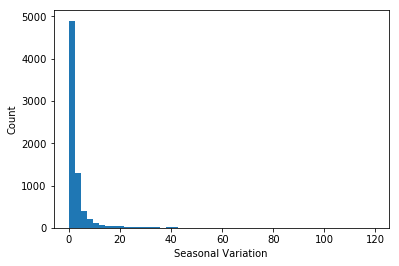

In [134]:
plt.hist(df_seasonal_detailed['Seasonal Variation'].dropna(), bins=50)
plt.xlabel('Seasonal Variation')
plt.ylabel('Count')
plt.show()

Again we find that most time series have a seasonal variation below 5 (or even smaller...) but there are some candidates with values around or above 100. This time we also find some indices where the algorithm did not detect any seasonal component at all: 

In [135]:
# zero seasonal variance
df_seasonal_detailed[df_seasonal_detailed['Seasonal Variation']==0]

,COICOP,Category,Main Category,Country,Seasonal Variation
12477,CP04442,Security services,"Housing, water, electricity, gas and other fuels",North Macedonia,0.0
12642,CP04521,Natural gas and town gas,"Housing, water, electricity, gas and other fuels",Hungary,0.0
15105,CP06132,Hearing aids,Health,Croatia,0.0
15244,CP06211,General practice,Health,Germany,0.0
15256,CP06211,General practice,Health,Croatia,0.0
15278,CP06212,Specialist practice,Health,Germany,0.0
15430,CP06231,Services of medical analysis laboratories and ...,Health,Switzerland,0.0
15432,CP06231,Services of medical analysis laboratories and ...,Health,Germany,0.0
15456,CP06232,"Thermal-baths, corrective-gymnastic therapy, a...",Health,Belgium,0.0
16523,CP07311,Passenger transport by train,Transport,Hungary,0.0


In [136]:
# highest seasonal variance
df_seasonal_detailed.sort_values(by='Seasonal Variation', ascending=False).head(20)

,COICOP,Category,Main Category,Country,Seasonal Variation
11902,CP04121,Actual rentals paid by tenants for secondary r...,"Housing, water, electricity, gas and other fuels",Denmark,119.154167
20028,CP09602,Package international holidays,Recreation and culture,Serbia,117.395000
16336,CP07241,"Hire of garages, parking spaces and personal t...",Transport,Ireland,113.024653
18443,CP0923,Maintenance and repair of other major durables...,Recreation and culture,France,102.372250
19281,CP09422,"Museums, libraries, zoological gardens",Recreation and culture,Greece,88.763000
16771,CP07332,International flights,Transport,Poland,79.599167
20612,CP11202,"Holiday centres, camping sites, youth hostels ...",Restaurants and hotels,Belgium,71.366262
16344,CP07241,"Hire of garages, parking spaces and personal t...",Transport,Portugal,70.801639
9438,CP01174,Potatoes,Food and non-alcoholic beverages,Estonia,67.926417
16777,CP07332,International flights,Transport,Slovakia,67.708583


The highest variances are detected for services around holidays and travelling, but also for potatoes! (Remember that we already had a look at the indices of potatoes in a previous section.)

**Augmented Dickey-Fuller Test**

The ADF test is a statistical test that evaluates a null hypothesis in order to distinguish between stationary and instationary time series. We will see that this aspect works quite well but that the test is not able to identify time series showing seasonality. But let's try it out:

In [137]:
from statsmodels.tsa.stattools import adfuller

adf_result = []
for row in np.arange(df_midx_small.shape[0]):
    adf_result.append(list(adfuller(df_midx_small.iloc[row,4:].dropna(), maxlag=48)))
    
df_adf = pd.concat([
    df_midx_small.iloc[:,:4],
    pd.DataFrame(adf_result, index=df_midx_small.index,
                 columns=['ADF statistics', 'p-value', 'used lag', 'nr. of observations',
                    'critical values', 'maximized information criterion'])],
    axis=1)
df_adf.head()

,COICOP,Category,Main Category,Country,ADF statistics,p-value,used lag,nr. of observations,critical values,maximized information criterion
7552,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Austria,-1.081283,0.722478,19,286,"{'1%': -3.4534232986669546, '5%': -2.871699418...",288.917319
7553,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Belgium,-0.689068,0.849561,36,269,"{'1%': -3.4548957220044336, '5%': -2.872345178...",379.959142
7554,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Bulgaria,1.235599,0.996223,21,273,"{'1%': -3.45453261164607, '5%': -2.87218595750...",1156.132342
7555,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Switzerland,-3.689134,0.004269,25,173,"{'1%': -3.4687256239864017, '5%': -2.878396137...",252.560104
7556,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Cyprus,1.247723,0.996300,5,300,"{'1%': -3.4523371197407404, '5%': -2.871222860...",874.217558


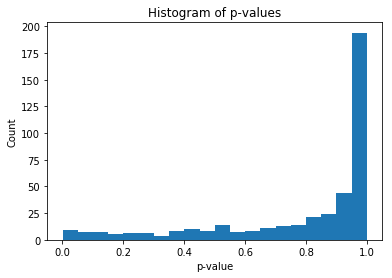

In [138]:
plt.hist(df_adf['p-value'], 20)
plt.xlabel('p-value')
plt.ylabel('Count')
plt.title('Histogram of p-values')
plt.show()

The histogram shows that most of the p-values are rather big and much bigger than 0.05, meaning that for these indices the null hypothesis cannot be rejected and the data is non-stationary. Only a few time series have a p-value below the significance level of 0.05:

In [139]:
# reject H0, stationary data
df_adf[df_adf['p-value'] <= 0.05]

,COICOP,Category,Main Category,Country,ADF statistics,p-value,used lag,nr. of observations,critical values,maximized information criterion
7555,CP01,Food and non-alcoholic beverages,Food and non-alcoholic beverages,Switzerland,-3.689134,0.004269,25,173,"{'1%': -3.4687256239864017, '5%': -2.878396137...",252.560104
10389,CP02,"Alcoholic beverages, tobacco and narcotics","Alcoholic beverages, tobacco and narcotics",Austria,-3.313309,0.014294,36,269,"{'1%': -3.4548957220044336, '5%': -2.872345178...",396.533075
11796,CP04,"Housing, water, electricity, gas and other fuels","Housing, water, electricity, gas and other fuels",Turkey,-3.098914,0.026634,13,292,"{'1%': -3.4529449243622383, '5%': -2.871489553...",363.336593
12891,CP05,"Furnishings, household equipment and routine h...","Furnishings, household equipment and routine h...",Turkey,-2.929988,0.041970,22,283,"{'1%': -3.453670163592738, '5%': -2.8718077069...",378.143320
14773,CP06,Health,Health,United Kingdom,-2.892096,0.046275,12,286,"{'1%': -3.4534232986669546, '5%': -2.871699418...",104.274746
17485,CP09,Recreation and culture,Recreation and culture,Germany,-3.295419,0.015085,37,268,"{'1%': -3.454988209954765, '5%': -2.8723857312...",738.048675
17515,CP09,Recreation and culture,Recreation and culture,Sweden,-4.182970,0.000704,36,269,"{'1%': -3.4548957220044336, '5%': -2.872345178...",343.393226
20287,CP11,Restaurants and hotels,Restaurants and hotels,Austria,-3.693755,0.004202,36,269,"{'1%': -3.4548957220044336, '5%': -2.872345178...",5.230063


We know from the previous investigations that almost all time series show a trend, a seasonal component and a remainder, but from the result of the ADF test we cannot conclude anything about seasonality.

### Seasonality in the Monthly Rates of Change

Up to now we have looked at the indices. But instead we can also analyze the monthly rates of change and search for patterns showing seasonality. So let's repeat some of the investigations.

**Autocorrelation within the Lags**

We will start again with the 'CP01' and 'CP03' data from Switzerland:

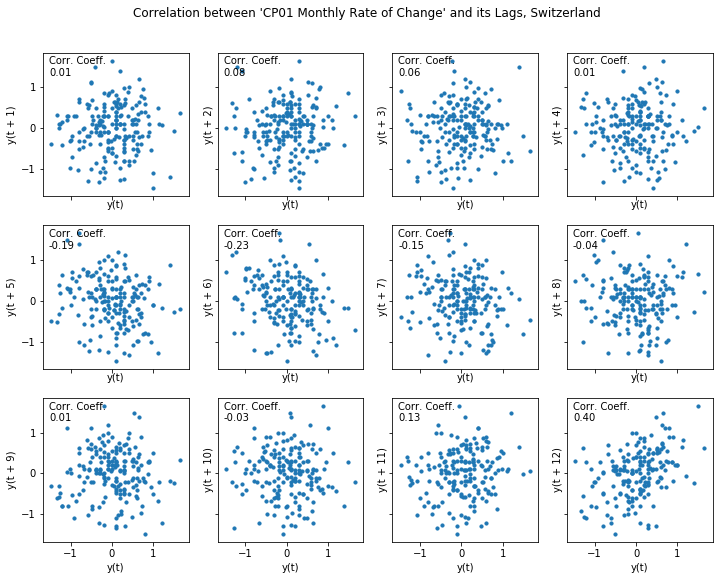

In [140]:
# same for monthly rate of change
# extract time series
data_CP01 = df_mmor_small[(df_mmor_small['Country']=='Switzerland') & (df_mmor_small['COICOP']=='CP01')].iloc[0,4:] \
        .sort_index().astype('float64')

fig, axes = plt.subplots(3, 4, figsize=(12, 9), sharex=True, sharey=True)
plt.suptitle("Correlation between 'CP01 Monthly Rate of Change' and its Lags, Switzerland", y=0.95)
for lag, ax in zip(np.arange(1,13), axes.ravel()):
    pd.plotting.lag_plot(data_CP01, lag=lag, ax=ax, s=10)
    ax.annotate('Corr. Coeff.\n{:.2f}'.format(data_CP01.autocorr(lag)),
                xy=(6, 140), xycoords='axes points', size=10, ha='left', va='top')
plt.show()

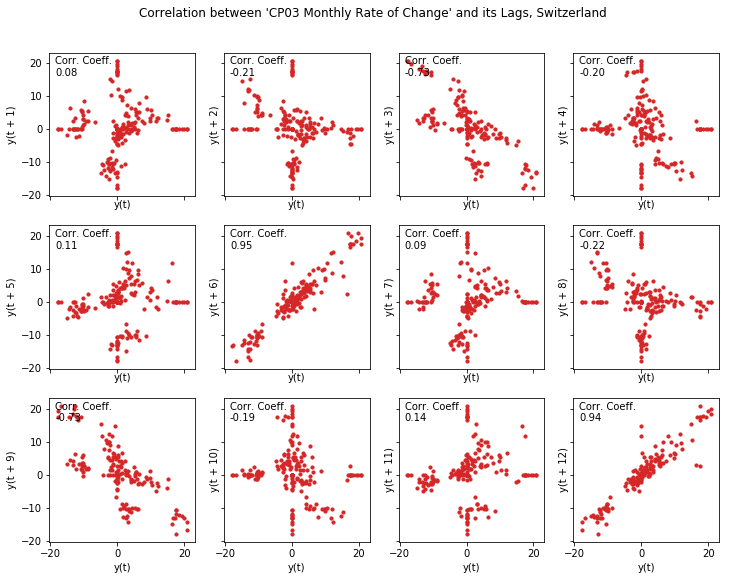

In [141]:
# extract time series
data_CP03 = df_mmor_small[(df_mmor_small['Country']=='Switzerland') & (df_mmor_small['COICOP']=='CP03')].iloc[0,4:] \
        .sort_index().astype('float64')

fig, axes = plt.subplots(3, 4, figsize=(12, 9), sharex=True, sharey=True)
plt.suptitle("Correlation between 'CP03 Monthly Rate of Change' and its Lags, Switzerland", y=0.95)
for lag, ax in zip(np.arange(1,13), axes.ravel()):
    pd.plotting.lag_plot(data_CP03, lag=lag, ax=ax, s=10, c='tab:red')
    ax.annotate('Corr. Coeff.\n{:.2f}'.format(data_CP03.autocorr(lag)),
                xy=(6, 140), xycoords='axes points', size=10, ha='left', va='top')
plt.show()

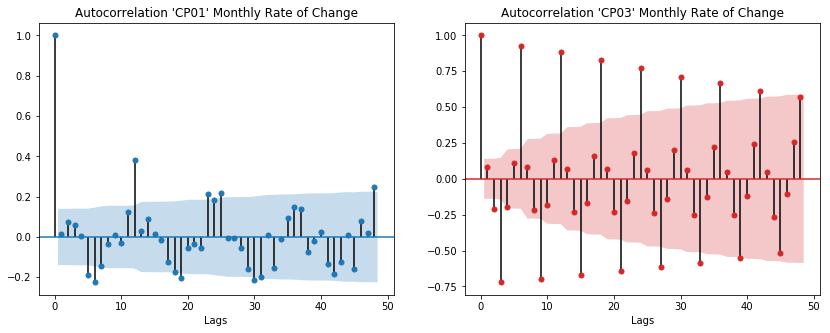

In [142]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sm.graphics.tsa.plot_acf(data_CP01.dropna(), lags=48, ax=axes[0], title="Autocorrelation 'CP01' Monthly Rate of Change")
axes[0].set_xlabel('Lags')
sm.graphics.tsa.plot_acf(data_CP03.dropna(), lags=48, ax=axes[1], c='tab:red', 
                         title="Autocorrelation 'CP03' Monthly Rate of Change")
axes[1].set_xlabel('Lags')

for item in axes[1].collections:
    if type(item)==PolyCollection:
        item.set_facecolor('tab:red')

plt.show()

This time the difference between 'CP01' and 'CP03' is much more evident. For 'CP01' the autocorrelation coefficients are much closer to zero - I would say we have a weak, but not an irrelevant correlation, as we still see a regular pattern in the autocorrelation plot. However for 'CP03' the situation is much more obvious: we find very high positive correlation coefficients for every 6th lag and a strong negative correlation for lag 3, 9, 15,... Those coefficients are clearly outside the confidence interval and thus being significant for sure.

Note that here for the monthly rates of change, both autocorrelation plots are centered around zero which was not the case before.

If we plot all autocorrelation coefficients for the rates of change we find a regular pattern with a period of 6 or 12 months for almost all of the time series:

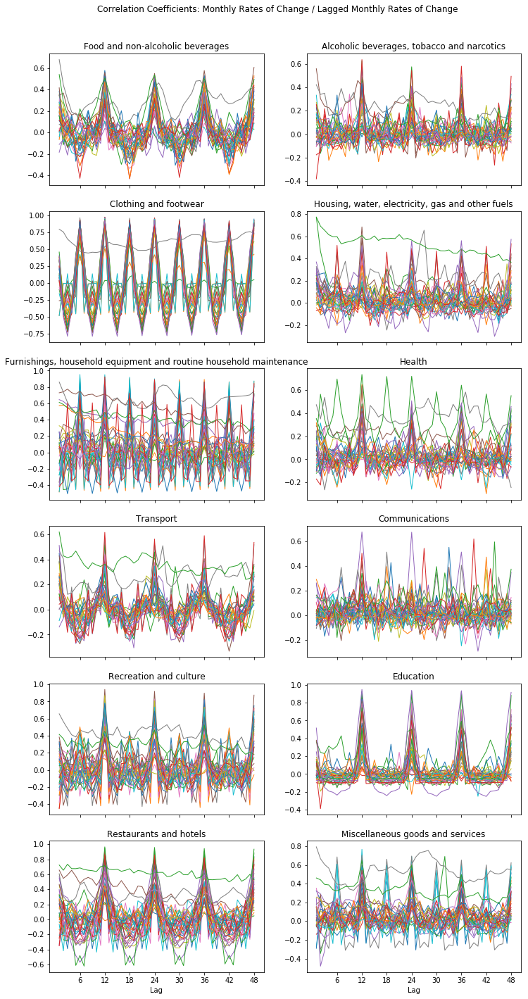

In [143]:
df_mmor_small_lags = df_mmor_small.iloc[:,:4].copy()

for lag in np.arange(1,49):
    df_mmor_small_lags['Corr. Lag '+str(lag)] = (df_mmor_small.iloc[:,4:].T).corrwith(df_mmor_small.iloc[:,4:].T.shift(lag))

fig, axes = plt.subplots(6, 2, figsize=(12, 24), sharex=True)

for cat, ax in zip(main_cat, axes.ravel()):
    for country in df_mmor_small['Country'].unique():
        ax.plot(np.arange(1,49),
                df_mmor_small_lags[(df_mmor_small_lags['Country']==country) & (df_mmor_small_lags['Main Category']==cat)]
                .iloc[:,4:].values[0], linewidth=1)
    ax.set_title(cat)
    ax.set_xticks(np.arange(6,49,6))
    if (cat=='Restaurants and hotels') | (cat=='Miscellaneous goods and services'):
        ax.set_xlabel('Lag')
fig.suptitle('Correlation Coefficients: Monthly Rates of Change / Lagged Monthly Rates of Change', y=0.92)
plt.show()

**Seasonal Decomposition**

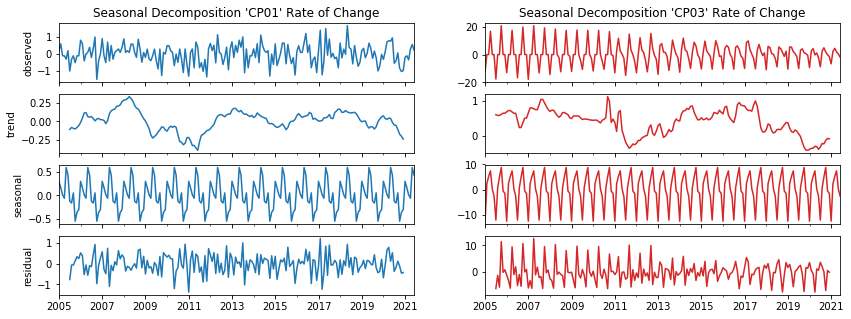

In [144]:
fig, axes = plt.subplots(4, 2, figsize=(14, 5), sharex=True)
res0 = seasonal_decompose(pd.Series(data_CP01).set_axis(df_midx_dates[:-1].sort_values(), inplace=False).dropna(), 
                   model='additive')
res1 = seasonal_decompose(pd.Series(data_CP03).set_axis(df_midx_dates[:-1].sort_values(), inplace=False).dropna(), 
                   model='additive')

res0.observed.plot(ax=axes[0,0])
axes[0,0].set_ylabel('observed')
axes[0,0].set_title("Seasonal Decomposition 'CP01' Rate of Change")
res0.trend.plot(ax=axes[1,0])
axes[1,0].set_ylabel('trend')
res0.seasonal.plot(ax=axes[2,0])
axes[2,0].set_ylabel('seasonal')
res0.resid.plot(ax=axes[3,0])
axes[3,0].set_ylabel('residual')

res1.observed.plot(ax=axes[0,1], c='tab:red')
axes[0,1].set_title("Seasonal Decomposition 'CP03' Rate of Change")
res1.trend.plot(ax=axes[1,1], c='tab:red')
res1.seasonal.plot(ax=axes[2,1], c='tab:red')
res1.resid.plot(ax=axes[3,1], c='tab:red')
plt.show()

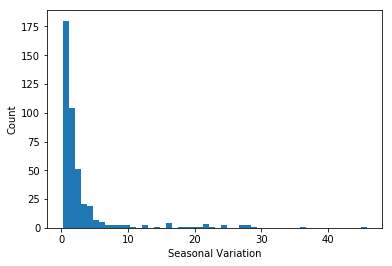

In [145]:
# same for all rates of change of small dataframe
seasonal_var = []
for row in np.arange(df_mmor_small.shape[0]):
    res = seasonal_decompose(pd.Series(df_mmor_small.iloc[row,4:])
                             .set_axis(df_midx_dates[:-1].sort_values(), inplace=False).dropna(), 
                   model='additive').seasonal
    seasonal_var.append(res.max() - res.min())
    
df_seasonal = pd.concat([
    df_mmor_small.iloc[:,:4],
    pd.DataFrame(seasonal_var, index=df_mmor_small.index, columns=['Seasonal Variation'])],
    axis=1)

plt.hist(df_seasonal['Seasonal Variation'], bins=50)
plt.xlabel('Seasonal Variation')
plt.ylabel('Count')
plt.show()

In [146]:
# zero seasonal variance
(df_seasonal['Seasonal Variation']==0).sum()

0

By computing the seasonal decomposition of the monthly rates of change of the main categories, we find that most of the time series show a seasonal variation below 5 but all of them are strictly greater than zero.

**Augmented Dickey-Fuller Test**

Let's see what happens for the ADF test:

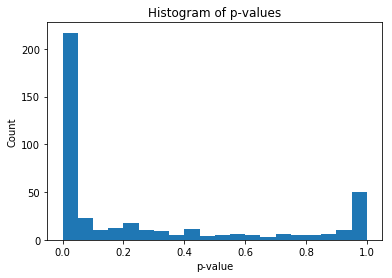

In [147]:
adf_result = []
for row in np.arange(df_mmor_small.shape[0]):
    adf_result.append(list(adfuller(df_mmor_small.iloc[row,4:].dropna(), maxlag=48)))
    
df_adf = pd.concat([
    df_mmor_small.iloc[:,:4],
    pd.DataFrame(adf_result, index=df_mmor_small.index,
                 columns=['ADF statistics', 'p-value', 'used lag', 'nr. of observations',
                    'critical values', 'maximized information criterion'])],
    axis=1)

plt.hist(df_adf['p-value'], 20)
plt.xlabel('p-value')
plt.ylabel('Count')
plt.title('Histogram of p-values')
plt.show()

In [148]:
# reject H0, stationary data
with pd.option_context('display.max_colwidth', 1000):
    display(df_adf[df_adf['p-value'] <= 0.05].groupby('Category', sort=False)['Country']
            .agg([lambda x: ', '.join(list(x))]).rename(columns={'<lambda>':'Countries'}))

,Countries
Category,
Food and non-alcoholic beverages,"Austria, Switzerland, Cyprus, Czechia, Germany, Denmark, Estonia, Finland, France, Croatia, Ireland, Iceland, Italy, Luxembourg, North Macedonia, Malta, Netherlands, Norway, Portugal, Serbia, Sweden, United States"
"Alcoholic beverages, tobacco and narcotics","Austria, Belgium, Bulgaria, Switzerland, Cyprus, Czechia, Germany, Denmark, Estonia, Greece, Spain, Finland, France, Croatia, Ireland, Iceland, Italy, Lithuania, Latvia, North Macedonia, Netherlands, Norway, Portugal, Serbia, Sweden, Slovakia, Turkey, United States"
Clothing and footwear,"Finland, Ireland, Malta, Netherlands, Sweden, Slovenia"
"Housing, water, electricity, gas and other fuels","Austria, Belgium, Switzerland, Cyprus, Germany, Estonia, Greece, Spain, Finland, France, Croatia, Ireland, Iceland, Italy, Lithuania, Luxembourg, Latvia, North Macedonia, Malta, Netherlands, Norway, Portugal, Serbia, Sweden, Slovenia, United Kingdom"
"Furnishings, household equipment and routine household maintenance","Austria, Cyprus, Germany, Denmark, Iceland, Luxembourg, North Macedonia, Malta, Serbia, Sweden, Slovakia, United Kingdom"
Health,"Austria, Switzerland, Cyprus, Czechia, Germany, Denmark, Greece, Spain, Finland, Croatia, Iceland, Italy, Luxembourg, Latvia, North Macedonia, Netherlands, Portugal, Serbia, Slovakia, United Kingdom"
Transport,"Austria, Belgium, Switzerland, Cyprus, Czechia, Germany, Denmark, Estonia, Greece, Spain, Finland, France, Croatia, Hungary, Lithuania, Luxembourg, Latvia, North Macedonia, Malta, Netherlands, Norway, Poland, Portugal, Serbia, Sweden, Slovenia, Slovakia, United States"
Communications,"Austria, Belgium, Switzerland, Germany, Denmark, Greece, Spain, Finland, France, Ireland, Italy, North Macedonia, Malta, Netherlands, Norway, Portugal, Serbia, Sweden, Slovenia, United Kingdom, United States"
Recreation and culture,"Belgium, Denmark, Croatia, Iceland, Italy, Luxembourg, North Macedonia, Netherlands, Serbia, United Kingdom, United States"


In [149]:
# do not reject H0, non-stationary data
with pd.option_context('display.max_colwidth', 1000):
    display(df_adf[df_adf['p-value'] >= 0.8].groupby('Category', sort=False)['Country']
            .agg([lambda x: ', '.join(list(x))]).rename(columns={'<lambda>':'Countries'}))

,Countries
Category,
Food and non-alcoholic beverages,"Poland, Romania, Turkey"
"Alcoholic beverages, tobacco and narcotics",Romania
Clothing and footwear,"Belgium, Bulgaria, Estonia, Hungary, Lithuania, Latvia, Poland, Romania, Serbia, Slovakia, Turkey"
"Housing, water, electricity, gas and other fuels","Bulgaria, Czechia, Poland, Romania, Slovakia, Turkey"
"Furnishings, household equipment and routine household maintenance","Bulgaria, Hungary, Ireland, Latvia, Poland, Romania, Turkey"
Health,"Bulgaria, Hungary, Poland, Romania, Turkey"
Transport,"Romania, Turkey"
Communications,"Bulgaria, Czechia, Estonia, Croatia, Hungary, Lithuania, Latvia, Poland, Romania, Slovakia, Turkey"
Recreation and culture,"Bulgaria, Greece, Hungary, Poland, Romania, Slovakia, Turkey"


This time there are a lot of time series with a p-value below 0.05 (thus stationary) but there are still many others with a p-value above the significance level (non-stationary). Almost all of the time series with a big p-value above 0.8 are located in Eastern Europe.

### Seasonality in the Detrended Price Indices

Lastly I want to look at the detrended indices, i.e. the difference between the index and its rolling mean.

**Autocorrelation within the Lags**

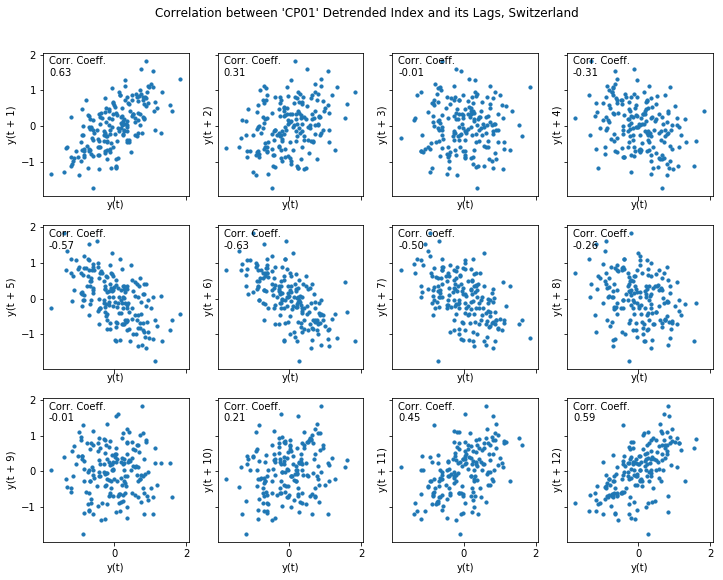

In [150]:
# same for the difference "index - rolling mean"
data_CP01 = df_datetime['CP01 / Switzerland'] - df_mean['CP01 / Switzerland']

fig, axes = plt.subplots(3, 4, figsize=(12, 9), sharex=True, sharey=True)
plt.suptitle("Correlation between 'CP01' Detrended Index and its Lags, Switzerland", y=0.95)
for lag, ax in zip(np.arange(1,13), axes.ravel()):
    pd.plotting.lag_plot(data_CP01, lag=lag, ax=ax, s=10)
    ax.annotate('Corr. Coeff.\n{:.2f}'.format(data_CP01.autocorr(lag)),
                xy=(6, 140), xycoords='axes points', size=10, ha='left', va='top')
plt.show()

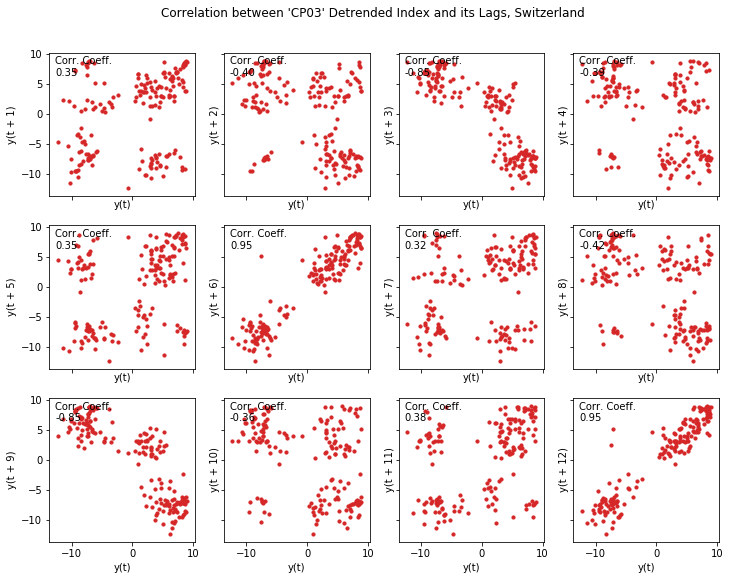

In [151]:
# same for the difference "index - rolling mean"
data_CP03 = df_datetime['CP03 / Switzerland'] - df_mean['CP03 / Switzerland']

fig, axes = plt.subplots(3, 4, figsize=(12, 9), sharex=True, sharey=True)
plt.suptitle("Correlation between 'CP03' Detrended Index and its Lags, Switzerland", y=0.95)
for lag, ax in zip(np.arange(1,13), axes.ravel()):
    pd.plotting.lag_plot(data_CP03, lag=lag, ax=ax, s=10, c='tab:red')
    ax.annotate('Corr. Coeff.\n{:.2f}'.format(data_CP03.autocorr(lag)),
                xy=(6, 140), xycoords='axes points', size=10, ha='left', va='top')
plt.show()

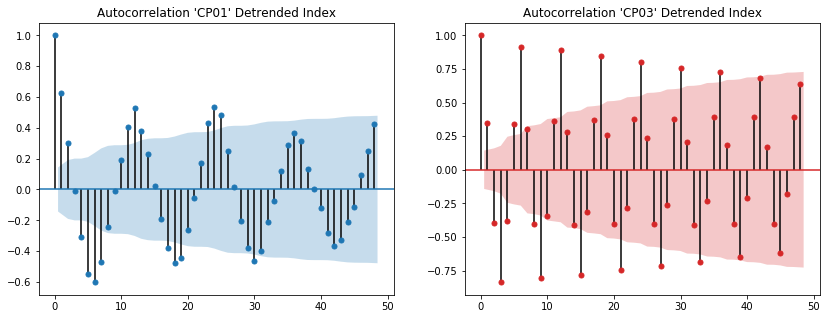

In [152]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sm.graphics.tsa.plot_acf(data_CP01.dropna(), lags=48, ax=axes[0], title="Autocorrelation 'CP01' Detrended Index")
sm.graphics.tsa.plot_acf(data_CP03.dropna(), lags=48, ax=axes[1], c='tab:red', 
                         title="Autocorrelation 'CP03' Detrended Index")

for item in axes[1].collections:
    if type(item)==PolyCollection:
        item.set_facecolor('tab:red')

plt.show()

Here we can identify a very regular pattern in the 'CP01' detrended index of Switzerland as well as in the 'CP03' detrended index. Thereby the magnitudes are much higher for 'CP03'. Similarly almost all detrended indices of the main categories show clear signs of seasonality:

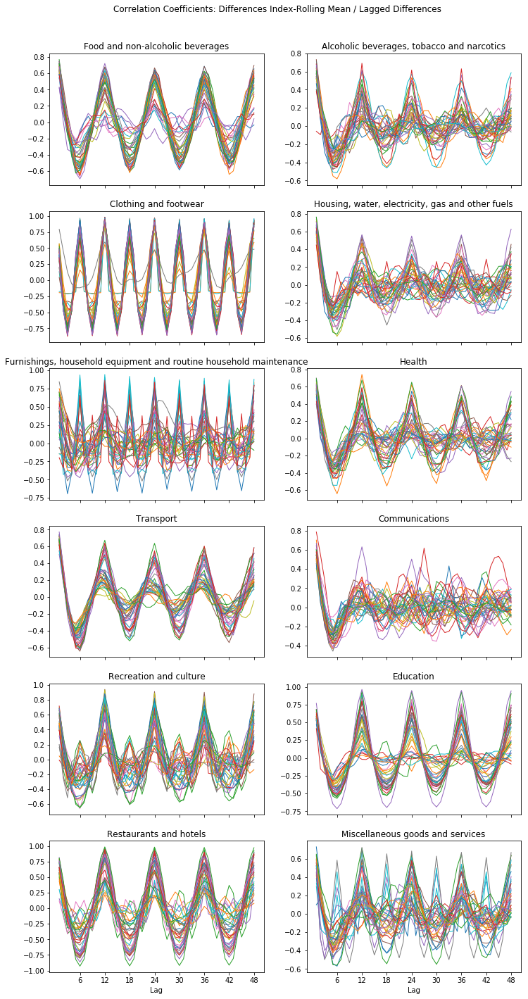

In [153]:
df_diff_small_lags = df_midx_small.iloc[:,:4].copy()
df_diff_small = df_midx_small.iloc[:,4:].T.sort_index() - \
                df_midx_small.iloc[:,4:].T.sort_index().rolling(12,center=True).mean()

for lag in np.arange(1,49):
    df_diff_small_lags['Corr. Lag '+str(lag)] = df_diff_small.corrwith(df_diff_small.shift(lag))

fig, axes = plt.subplots(6, 2, figsize=(12, 24), sharex=True)

for cat, ax in zip(main_cat, axes.ravel()):
    for country in df_midx_small['Country'].unique():
        ax.plot(np.arange(1,49),
                df_diff_small_lags[(df_diff_small_lags['Country']==country) & (df_diff_small_lags['Main Category']==cat)]
                .iloc[:,4:].values[0], linewidth=1)
    ax.set_title(cat)
    ax.set_xticks(np.arange(6,49,6))
    if (cat=='Restaurants and hotels') | (cat=='Miscellaneous goods and services'):
        ax.set_xlabel('Lag')
fig.suptitle('Correlation Coefficients: Differences Index-Rolling Mean / Lagged Differences', y=0.92)
plt.show()

**Augmented Dickey-Fuller Test**

Almost all detrended indices are correctly classified as stationary time series:

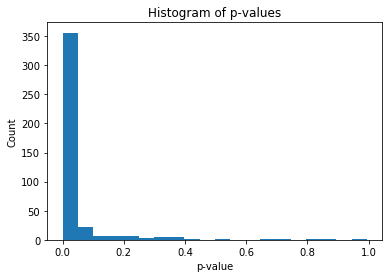

In [154]:
adf_result = []
for row in np.arange(df_diff_small.T.shape[0]):
    adf_result.append(list(adfuller(df_diff_small.T.iloc[row,4:].dropna(), maxlag=48)))
    
df_adf = pd.concat([
    df_midx_small.iloc[:,:4],
    pd.DataFrame(adf_result, index=df_diff_small.T.index,
                 columns=['ADF statistics', 'p-value', 'used lag', 'nr. of observations',
                    'critical values', 'maximized information criterion'])],
    axis=1)

plt.hist(df_adf['p-value'], 20)
plt.xlabel('p-value')
plt.ylabel('Count')
plt.title('Histogram of p-values')
plt.show()

In [155]:
# do not reject H0, non-stationary data
with pd.option_context('display.max_colwidth', 1000):
    display(df_adf[df_adf['p-value'] > 0.05].groupby('Category', sort=False)['Country']
            .agg([lambda x: ', '.join(list(x))]).rename(columns={'<lambda>':'Countries'}))

,Countries
Category,
Food and non-alcoholic beverages,"Switzerland, Romania, Turkey"
"Alcoholic beverages, tobacco and narcotics","Belgium, United Kingdom"
Clothing and footwear,"Estonia, Croatia, Poland, Romania, Serbia, United Kingdom"
"Housing, water, electricity, gas and other fuels","Czechia, Spain, Iceland, Italy, United States"
"Furnishings, household equipment and routine household maintenance","Finland, Ireland, Italy, Netherlands, Norway, Poland, United Kingdom"
Health,"Belgium, France, Turkey, United States"
Transport,"Ireland, Iceland"
Communications,"Bulgaria, Cyprus, Lithuania, Luxembourg, Latvia, Poland, Slovakia"
Recreation and culture,"Austria, Spain, France, Hungary, Norway"


### Short Summary about Seasonality
There are two promising mathematical methods for the identification of time series showing seasonality effects:
1. computation of the autocorrelation between the time series and its lags - if it is particularly high for certain periods that is a sign for seasonality 
2. computation of the seasonal decomposition into trend, seasonal component and residual, and evaluation of the magnitude of seasonal variation

Both methods were tried out on the HICP dataset and both concluded that almost all time series show "a little bit" of seasonality. They correctly identified several indices like clothing, hotels and tourism services as well as potatoes having the strongest seasonal component as we have already seen from the visual investigations.

In contrast the Augmented Dickey-Fuller Test is a test for stationarity but it cannot be used for identifying seasonality.